## Conexión con la cuenta de drive donde estan alojados los audios

In [1]:
from google.colab import drive
drive.mount('/content/drive')

KeyboardInterrupt: ignored

## Importación de librerías

In [ ]:
import openpyxl
import os
!pip install pydub
!pip install essentia
from pydub import AudioSegment
from math import * 
import IPython
import random
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import  sklearn
import essentia, essentia.standard as ess
from scipy import fftpack

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pylab as pl
from sklearn.datasets import make_circles
from matplotlib.colors import Normalize
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from tabulate import tabulate


# Función para visualizar un conjunto de datos en 2D
def plot_data(X, y):
    y_unique = np.unique(y)
    colors = pl.cm.rainbow(np.linspace(0.0, 1.0, y_unique.size))
    for this_y, color in zip(y_unique, colors):
        this_X = X[y == this_y]
        pl.scatter(this_X[:, 0], this_X[:, 1],  c=color,
                    alpha=0.5, edgecolor='k',
                    label="Class %s" % this_y)
    pl.legend(loc="best")
    pl.title("Data")
    
def modulo(a, b):
  '''Funcion que calcula el
  residuo (modulo) de una division'''
  residuo = 0
  x = a // b
  residuo = a - (x * b)
  return residuo

# Función para visualizar de la superficie de decisión de un clasificador
def plot_decision_region(X, pred_fun):
    min_x = np.min(X[:, 0])
    max_x = np.max(X[:, 0])
    min_y = np.min(X[:, 1])
    max_y = np.max(X[:, 1])
    min_x = min_x - (max_x - min_x) * 0.05
    max_x = max_x + (max_x - min_x) * 0.05
    min_y = min_y - (max_y - min_y) * 0.05
    max_y = max_y + (max_y - min_y) * 0.05
    x_vals = np.linspace(min_x, max_x, 100)
    y_vals = np.linspace(min_y, max_y, 100)
    XX, YY = np.meshgrid(x_vals, y_vals)
    grid_r, grid_c = XX.shape
    ZZ = np.zeros((grid_r, grid_c))
    for i in range(grid_r):
        for j in range(grid_c):
            ZZ[i, j] = pred_fun(XX[i, j], YY[i, j])
    pl.contourf(XX, YY, ZZ, 100, cmap = pl.cm.coolwarm, vmin= -1, vmax=2)
    pl.colorbar()
    pl.xlabel("x")
    pl.ylabel("y")
    
class MidpointNormalize(Normalize):

    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))
    
def gen_pred_fun(clf):
    def pred_fun(x1, x2):
        x = np.array([[x1, x2]])
        return clf.predict(x)[0]
    return pred_fun

def plot_labels(n_folds, n_classes, list_labels):
    ind = np.arange(n_folds)
    width = 0.15
    
    countings = []
    for labels in list_labels:
        labels = np.array(labels)
        countings.append([np.count_nonzero(labels == x) for x in range(n_classes)])
    
    class_bars = []
    for cls in range(n_classes):
        class_bars.append([l[cls] for l in countings])
    
    fig, ax = pl.subplots()
    i = 0
    for class_bar in class_bars:
        ax.bar(ind + width*i, class_bar, width, label='Clase '+str(i))
        i += 1
        
    ax.set_xticks(ind + 2*width / 3)
    ax.set_xticklabels(['Pliegue {}'.format(k) for k in range(n_folds)])
    pl.legend(loc="best")
    pl.title("Etiquetas")
    
def list_cm(cm,classes):     #función para generar de una forma más visual la matriz de confusión
    if len(cm)==2:
      row_0 =['','Valor','Verdadero']
      row_1 =['-',classes[0],classes[1]]
      row_2 =[classes[0],cm[0,0],cm[1,0]]
      row_3 =[classes[1],cm[0,1],cm[1,1]]
      table = zip(row_0,row_1, row_2, row_3)
      headers = ['', '', 'Valor', 'Predicho']  
      return print(tabulate(table, headers=headers, floatfmt=".4f"))
    else:
      row_0 =['','Valor','Verdadero','']
      row_1 =['-',classes[0],classes[1],classes[2]]
      row_2 =[classes[0],cm[0,0],cm[1,0],cm[2,0]]
      row_3 =[classes[1],cm[0,1],cm[1,1],cm[2,1]]
      row_4 =[classes[2],cm[0,2],cm[1,2],cm[2,2]]
      table = zip(row_0,row_1, row_2, row_3, row_4)
      headers = ['', '', 'Valor', 'Predicho', '']  
      return print(tabulate(table, headers=headers, floatfmt=".4f"))  

from sklearn.metrics import plot_confusion_matrix

     |████████████████████████████████| 11.7MB 4.0MB/s 


## Selección de la ubicación de los datos de los audios 

In [ ]:

here_path = os.path.dirname(os.path.realpath('/content/drive/My Drive/Datos/'))
path ='/content/drive/My Drive/Datos/'

excel_name = 'data_set.xlsx'
excel_path = path+excel_name
excel_document = openpyxl.load_workbook(excel_path)
sheet = excel_document.get_sheet_by_name('datos')

## Definición de las columnas con la información de los segmentos para audios sin riudos
multiple_cells = sheet['D3':'E833']
## Definición de las columnas con la información de los segmentos para audios ruidos
multiple_cells_ruido = sheet['D834':'E4427']


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
  


# Funciones empleadas en el proceso

## Función para guardar los resultados del proceso de cluster

In [ ]:
def write_excel_results(labels,columna,fila,name,sheet_resultado):
  columnas =['A','B','C','D','E','F','G','H','I',
          'J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z',
          'AA','AB','AC','AD','AE','AF','AG','AH','AI','AJ','AK','AL','AM','AN','AO','AP','AQ','AR','AS','AT','AU','AV','AW','AX','AY','AZ',
          'BA','BB','BC','BD','BE','BF','BG','BH','BI','BJ','BK','BL','BM','BN','BO','BP','BQ','BR','BS','BT','BU','BV','BW','BX','BY','BZ', 
          ]
  for label in labels:
    if (fila==3):
      sheet_resultado[columnas[columna]+str(fila-1)] = name
    sheet_resultado[columnas[columna]+str(fila)] = label
    fila=fila+1
    #print(fila)
  columna=columna+1
  #print(name)
  return columna

def write_excel_results_metrics(labels,columna,fila,name,sheet_resultado_metricas):
  columnas =['A','B','C','D','E','F','G','H','I',
          'J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z',
          'AA','AB','AC','AD','AE','AF','AG','AH','AI','AJ','AK','AL','AM','AN','AO','AP','AQ','AR','AS','AT','AU','AV','AW','AX','AY','AZ',
          'BA','BB','BC','BD','BE','BF','BG','BH','BI','BJ','BK','BL','BM','BN','BO','BP','BQ','BR','BS','BT','BU','BV','BW','BX','BY','BZ', 
          ]
  for label in labels:
    if (fila==3):
      sheet_resultado_metricas[columnas[columna]+str(fila-1)] = name
    if (fila==40):
      sheet_resultado_metricas[columnas[columna]+str(fila-1)] = name
    sheet_resultado_metricas[columnas[columna]+str(fila)] = label
    fila=fila+1
    #print(fila)
  columna=columna+1
  #print(name)
  return columna


## Función para implementar la clusterización

In [ ]:
def implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_, titulo_):
  import numpy as np
  from matplotlib import pyplot as plt
  from scipy.cluster.hierarchy import dendrogram
  from sklearn.datasets import load_iris
  from sklearn.cluster import AgglomerativeClustering
  import numpy as np
  import matplotlib.pyplot as plt
  from sklearn.cluster import SpectralClustering
  from sklearn import metrics
  from sklearn.cluster import KMeans
  from sklearn.neighbors import KNeighborsClassifier
  from sklearn.metrics import pairwise_distances_argmin_min

  %matplotlib inline
  plt.rcParams['figure.figsize'] = (16, 9)
  plt.style.use('ggplot')
  #import seaborn as sns; sns.set()  # for plot styling
  
  df_X_train = pd.DataFrame(X_train)
  df_X_test = pd.DataFrame(X_test)
  X = np.array(df_X_train)
  y = np.array(y_train)
  X1 = np.array(df_X_test)
  y1 = np.array(y_test)
  print(X.shape)
  print(X1.shape)

  ### Obtener el valor de K
  Nc = range(1, 20)
  kmeans = [KMeans(n_clusters=i) for i in Nc]
  score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
  plt.plot(Nc,score)
  plt.xlabel('Número de Clusters para '+titulo_ )
  plt.ylabel('Score')
  plt.title('Elbow Curve')
  plt.show()
  # Though the following import is not directly being used, it is required
  # for 3D projection to work
  from mpl_toolkits.mplot3d import Axes3D
  estimators = [('k_means_20', KMeans(n_clusters=20)),
                ('k_means_10', KMeans(n_clusters=10)),
                ('k_means_9', KMeans(n_clusters=9)),
                ('k_means_8', KMeans(n_clusters=8)),
                ('k_means_7', KMeans(n_clusters=7)),
                ('k_means_6', KMeans(n_clusters=6)),
                ('k_means_5', KMeans(n_clusters=5)),
                ('k_means_4', KMeans(n_clusters=4)),
                ('k_means_3', KMeans(n_clusters=3)),
                ('k_means_2', KMeans(n_clusters=2)),
                ('SpectralClustering_20', SpectralClustering(n_clusters=20, affinity='nearest_neighbors',
                            assign_labels='kmeans')),
                ('SpectralClustering_10', SpectralClustering(n_clusters=10, affinity='nearest_neighbors',
                            assign_labels='kmeans')),
                ('SpectralClustering_9', SpectralClustering(n_clusters=9, affinity='nearest_neighbors',
                            assign_labels='kmeans')),
                ('SpectralClustering_8', SpectralClustering(n_clusters=8, affinity='nearest_neighbors',
                            assign_labels='kmeans')),
                ('SpectralClustering_7', SpectralClustering(n_clusters=7, affinity='nearest_neighbors',
                            assign_labels='kmeans')),
                ('SpectralClustering_6', SpectralClustering(n_clusters=6, affinity='nearest_neighbors',
                            assign_labels='kmeans')),
                ('SpectralClustering_5', SpectralClustering(n_clusters=5, affinity='nearest_neighbors',
                            assign_labels='kmeans')),
                ('SpectralClustering_4', SpectralClustering(n_clusters=4, affinity='nearest_neighbors',
                            assign_labels='kmeans')),
                ('SpectralClustering_3', SpectralClustering(n_clusters=3, affinity='nearest_neighbors',
                            assign_labels='kmeans')),
                ('SpectralClustering_2', SpectralClustering(n_clusters=2, affinity='nearest_neighbors',
                            assign_labels='kmeans'))]

  titles = ['k_means_20','k_means_10','k_means_9','k_means_8','k_means_7','k_means_6','k_means_5', 'k_means_4','k_means_3','k_means_2','SpectralClustering_20','SpectralClustering_10', 'SpectralClustering_9','SpectralClustering_8', 'SpectralClustering_7', 'SpectralClustering_6','SpectralClustering_5','SpectralClustering_4','SpectralClustering_3','SpectralClustering_2']


  fignum = 1
  labels = {}
  labels_true = y1

  metricas_list={}
  sigla_experimento=sigla_experimento_
  experimento=experimento_
  metricas =[]
  metricas.append('Homogeneidad_'+sigla_experimento)
  metricas.append('Integridad_'+sigla_experimento)
  metricas.append('v_measure_score_'+sigla_experimento)
  metricas.append('adjusted_rand_score_'+sigla_experimento)
  metricas.append('adjusted_mutual_info_score_'+sigla_experimento)
  metricas.append('silueta_'+sigla_experimento)
  metricas.append('Dato_mas_cercano_centroide_'+sigla_experimento)
  metricas_list['nombre metricas']=metricas
  def calcular_metricas(metricas,labels_true,name,label_predict):
    homogeneity_score=metrics.homogeneity_score(labels_true, label_predict)
    completeness_score=metrics.completeness_score(labels_true, label_predict)
    v_measure_score=metrics.v_measure_score(labels_true, label_predict)
    adjusted_rand_score= metrics.adjusted_rand_score(labels_true, label_predict)
    adjusted_mutual_info_score=metrics.adjusted_mutual_info_score(labels_true, label_predict)
    silhouette_score = metrics.silhouette_score(X1, label_predict)
    print("=====================================")
    metricas.append(homogeneity_score)
    metricas.append(completeness_score)
    metricas.append(v_measure_score)
    metricas.append(adjusted_rand_score)
    metricas.append(adjusted_mutual_info_score)
    metricas.append(silhouette_score)
    metricas.append(' '.join([str(elem) for elem in closest]))
    metricas_list[name]=metricas
    print(name)
    return metricas_list 
    
  for name, est in estimators:
      metricas =[]
      est.fit(X)
      try:
        labels[name] = est.predict(X1)
        closest, _ = pairwise_distances_argmin_min(est.cluster_centers_, X1)
        metricas = calcular_metricas(metricas,labels_true,name,labels[name])
      except:
        labels[name] = est.fit_predict(X1)
        metricas =[]
        metricas = calcular_metricas(metricas,labels_true,name,labels[name])
        name1=name
        name = name1+'_KNN_2'
        metricas =[]
        neigh = KNeighborsClassifier(n_neighbors=2)
        neigh.fit(X, est.fit_predict(X))
        labels[name] =neigh.predict(X1)
        metricas = calcular_metricas(metricas,labels_true,name,labels[name])

        name = name1+'_KNN_5'
        metricas =[]
        neigh = KNeighborsClassifier(n_neighbors=5)
        neigh.fit(X, est.fit_predict(X))
        labels[name] =neigh.predict(X1)
        metricas = calcular_metricas(metricas,labels_true,name,labels[name])

        name = name1+'_KNN_10'
        metricas =[]
        neigh = KNeighborsClassifier(n_neighbors=10)
        neigh.fit(X, est.fit_predict(X))
        labels[name] =neigh.predict(X1)
        metricas = calcular_metricas(metricas,labels_true,name,labels[name])


  ###  Guarda en excel los resultados de la clusterizacion
  excel_name_metricas = 'resultados_cluster_pulsos.xlsx'
  excel_path_metricas = path+excel_name_metricas
  excel_resultado_metricas = openpyxl.load_workbook(excel_path_metricas)

  excel_name = 'data_set_cluster_pulsos.xlsx'
  excel_path = path+excel_name
  excel_resultado = openpyxl.load_workbook(excel_path)
  sheet_resultado = excel_resultado.get_sheet_by_name(experimento)
  columna=0
  titles = ['k_means_20','k_means_10','k_means_9','k_means_8','k_means_7','k_means_6','k_means_5', 'k_means_4','k_means_3','k_means_2',
            'SpectralClustering_20','SpectralClustering_20_KNN_2','SpectralClustering_20_KNN_5','SpectralClustering_20_KNN_10',
            'SpectralClustering_10','SpectralClustering_10_KNN_2','SpectralClustering_10_KNN_5','SpectralClustering_10_KNN_10',
            'SpectralClustering_9','SpectralClustering_9_KNN_2','SpectralClustering_9_KNN_5','SpectralClustering_9_KNN_10',
            'SpectralClustering_8','SpectralClustering_8_KNN_2','SpectralClustering_8_KNN_5','SpectralClustering_8_KNN_10',
            'SpectralClustering_7','SpectralClustering_7_KNN_2','SpectralClustering_7_KNN_5','SpectralClustering_7_KNN_10',
            'SpectralClustering_6','SpectralClustering_6_KNN_2','SpectralClustering_6_KNN_5','SpectralClustering_6_KNN_10',
            'SpectralClustering_5','SpectralClustering_5_KNN_2','SpectralClustering_5_KNN_5','SpectralClustering_5_KNN_10',
            'SpectralClustering_4','SpectralClustering_4_KNN_2','SpectralClustering_4_KNN_5','SpectralClustering_4_KNN_10',
            'SpectralClustering_3','SpectralClustering_3_KNN_2','SpectralClustering_3_KNN_5','SpectralClustering_3_KNN_10',
            'SpectralClustering_2','SpectralClustering_2_KNN_2','SpectralClustering_2_KNN_5','SpectralClustering_2_KNN_10']
  for title in titles:
    fila=3
    columna = write_excel_results (labels[title],columna,fila,title,sheet_resultado)
    #print(title)
  excel_resultado.save(excel_path)

  ### Guarda en el excel el resultado de las metricas

  sheet_resultado_metricas = excel_resultado_metricas.get_sheet_by_name(experimento)
  columna_metricas=0
  titles = ['nombre metricas','k_means_20','k_means_10','k_means_9','k_means_8','k_means_7','k_means_6','k_means_5', 'k_means_4','k_means_3','k_means_2',
            'SpectralClustering_20','SpectralClustering_20_KNN_2','SpectralClustering_20_KNN_5','SpectralClustering_20_KNN_10',
            'SpectralClustering_10','SpectralClustering_10_KNN_2','SpectralClustering_10_KNN_5','SpectralClustering_10_KNN_10',
            'SpectralClustering_9','SpectralClustering_9_KNN_2','SpectralClustering_9_KNN_5','SpectralClustering_9_KNN_10',
            'SpectralClustering_8','SpectralClustering_8_KNN_2','SpectralClustering_8_KNN_5','SpectralClustering_8_KNN_10',
            'SpectralClustering_7','SpectralClustering_7_KNN_2','SpectralClustering_7_KNN_5','SpectralClustering_7_KNN_10',
            'SpectralClustering_6','SpectralClustering_6_KNN_2','SpectralClustering_6_KNN_5','SpectralClustering_6_KNN_10',
            'SpectralClustering_5','SpectralClustering_5_KNN_2','SpectralClustering_5_KNN_5','SpectralClustering_5_KNN_10',
            'SpectralClustering_4','SpectralClustering_4_KNN_2','SpectralClustering_4_KNN_5','SpectralClustering_4_KNN_10',
            'SpectralClustering_3','SpectralClustering_3_KNN_2','SpectralClustering_3_KNN_5','SpectralClustering_3_KNN_10',
            'SpectralClustering_2','SpectralClustering_2_KNN_2','SpectralClustering_2_KNN_5','SpectralClustering_2_KNN_10']

  for title in titles:
    fila=3
    columna_metricas = write_excel_results_metrics (metricas_list[title],columna_metricas,fila,title,sheet_resultado_metricas)
    #print(title)
  excel_resultado_metricas.save(excel_path_metricas)  
  print("###########################################################")
  print("Finaliza el proceso de clusterización para el experimento " + experimento)

## Función para implementar PCA


In [ ]:
def implementar_pca(datos_,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento,feature_names_,graficas_):
  import pandas as pd
  import numpy as np
  import matplotlib.pyplot as plt
  %matplotlib inline
  plt.rcParams['figure.figsize'] = (16, 9)
  plt.style.use('ggplot')
  from sklearn.decomposition import PCA
  from sklearn.preprocessing import StandardScaler
  %matplotlib inline
  from mpl_toolkits.mplot3d import Axes3D
  from sklearn.model_selection import train_test_split
  print(titulo_)
  #Cargamos los datos de entrada
  X_scaled = np.array(datos_)

  a=X_scaled.shape
  n_component=a[1]
  #La submatriz x contiene los valores de las columnas del dataframe y todas las filas
  print(n_component)
  #Instanciamos objeto PCA y aplicamos
  pca=PCA(n_components=n_component) # Otra opción es instanciar pca sólo con dimensiones nuevas hasta obtener un mínimo "explicado" ej.: pca=PCA(.85)
  pca.fit(X_scaled) # obtener los componentes principales
  X_pca_pulso=pca.transform(X_scaled) # convertimos nuestros datos con las nuevas dimensiones de PCA
  
  print("shape of X_pca", X_pca_pulso.shape)
  expl = pca.explained_variance_ratio_
  #print(expl)
  print('Varianza explicada # componentes = '+ str(cant_componentes_),sum(expl[0:cant_componentes_]))
  #Vemos que con x # de componentes tenemos algo mas del % de varianza explicada
  
  #Graficamos el acumulado de varianza explicada en las nuevas dimensiones
  plt.plot(np.cumsum(pca.explained_variance_ratio_))
  plt.xlabel('Número de componentes')
  plt.ylabel('Varianza explicada acumulada')
  plt.show()
  if (graficas_ == 1):
    #Graficamos en 3 Dimensiones, tomando los 3 primeros componentes principales
    Xax=X_pca_pulso[:,0]
    Yax=X_pca_pulso[:,1]
    Zax=X_pca_pulso[:,2]
    cdict={1:'red',2:'green',3:'blue'}
    marker={1:'*',2:'o',3:'+'}
    alpha={1:.3, 2:.3,  3:.3}

    fig = plt.figure()
    ax = Axes3D(fig)

    for l in np.unique(labels):
        ix=np.where(labels==l)
        ax.scatter(Xax[ix],Yax[ix],Zax[ix],c=cdict[l],label=labl[l],s=10,marker=marker[l],alpha=alpha[l])

    ax.set_xlabel('Primer Componente')
    ax.set_ylabel('Segundo Componente')
    ax.set_zlabel('Tercer Componente')
    plt.legend()
    plt.show()

    fig = plt.figure()
    ax = Axes3D(fig)
    for l in np.unique(labels):
        ix=np.where(labels==l)
        ax.scatter(Yax[ix],Zax[ix],Xax[ix],c=cdict[l],label=labl[l],s=10,marker=marker[l],alpha=alpha[l])

    ax.set_ylabel('Primer Componente')
    ax.set_zlabel('Segundo Componente')
    ax.set_xlabel('Tercer Componente')
    plt.legend()
    plt.show()


    fig = plt.figure()
    ax = Axes3D(fig)
    for l in np.unique(labels):
        ix=np.where(labels==l)
        ax.scatter(Zax[ix],Xax[ix],Yax[ix],c=cdict[l],label=labl[l],s=10,marker=marker[l],alpha=alpha[l])

    ax.set_zlabel('Primer Componente')
    ax.set_xlabel('Segundo Componente')
    ax.set_ylabel('Tercer Componente')
    plt.legend()
    plt.show()


    plt.rcParams['figure.figsize'] = (12, 9)
    for l in np.unique(labels):
        ix=np.where(labels==l)
        plt.scatter(Xax[ix],Yax[ix],c=cdict[l],label=labl[l],s=20,marker=marker[l],alpha=alpha[l])

    plt.xlabel('Primer Componente')
    plt.ylabel('Segundo Componente')
    plt.legend()
    plt.title(titulo_)
    plt.show()

    plt.rcParams['figure.figsize'] = (12, 9)
    for l in np.unique(labels):
        ix=np.where(labels==l)
        plt.scatter(Xax[ix],Zax[ix],c=cdict[l],label=labl[l],s=20,marker=marker[l],alpha=alpha[l])

    plt.xlabel('Primer Componente')
    plt.ylabel('Tercer Componente')
    plt.legend()
    plt.title(titulo_)
    plt.show()

    plt.rcParams['figure.figsize'] = (12, 9)
    for l in np.unique(labels):
        ix=np.where(labels==l)
        plt.scatter(Zax[ix],Yax[ix],c=cdict[l],label=labl[l],s=20,marker=marker[l],alpha=alpha[l])

    plt.xlabel('Tercer Componente')
    plt.ylabel('Segundo Componente')
    plt.legend()
    #plt.title('Pulsos mejores carácteristicas automáticas')
    plt.title(titulo_)
    plt.show()

  ########################## Se implementa Clusterización a PCA #################
  ## Datos de todas las caracteristicas
  dfpca = pd.DataFrame(X_pca_pulso[:,0:cant_componentes_])

  scaler = MinMaxScaler()
  scaled_data = scaler.fit_transform(dfpca)
  X_train=[]
  X_test=[]
  y_train=[]
  y_test=[]
  X_train, X_test, y_train, y_test = train_test_split(
                                                      scaled_data, 
                                                      labels, 
                                                      test_size=0.3, random_state=0)

  print(X_train.shape)
  implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)



## Función para identificar los mejores parámetros para RandomForest

In [ ]:
def identificacion_mejores_parametros(labels_, class_names,feature_names_, datos_,tuned_parameters):
  from sklearn import datasets
  from sklearn.model_selection import train_test_split
  from sklearn.model_selection import GridSearchCV
  from sklearn.metrics import classification_report
  from sklearn.svm import SVC
  from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
  from sklearn.model_selection import KFold
  from sklearn.model_selection import StratifiedKFold
  from sklearn.preprocessing import MinMaxScaler
  import numpy as np

  scaler = MinMaxScaler()
  scaled_data = scaler.fit_transform(datos_)

  X_train, X_test, y_train, y_test = train_test_split(
                                                      scaled_data, 
                                                      labels_, 
                                                      test_size=0.3, random_state=0)

  print(tuned_parameters)
  XX=0
  scores = ['accuracy']
  rf=RandomForestClassifier()
  for score in scores:
      print("# Tuning hyper-parameters for %s" % score)
      print()

      clf = GridSearchCV(
          estimator = rf, param_grid=tuned_parameters, scoring="accuracy",n_jobs=-1, verbose = 2
      )
      clf.fit(X_train, y_train)

      print("Best parameters set found on development set:")
      print()
      print(clf.best_params_)
      print()
      print("Grid scores on development set:")
      print()
      means = clf.cv_results_['mean_test_score']
      stds = clf.cv_results_['std_test_score']
      for mean, std, params in zip(means, stds, clf.cv_results_['params']):
          print("%0.3f (+/-%0.03f) for %r"
                % (mean, std * 2, params))
      print()

      print("Detailed classification report:")
      print()
      print("The model is trained on the full development set.")
      print("The scores are computed on the full evaluation set.")
      print()
      y_true, y_pred = y_test, clf.predict(X_test)
      print(classification_report(y_true, y_pred))
      print()

  def evaluate(model, test_features, test_labels):
      predictions = model.predict(test_features)
      errors = abs(predictions - test_labels)
      mape = 100 * np.mean(errors / test_labels)
      accuracy = 100 - mape
      print('Model Performance')
      print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
      print('Accuracy = {:0.2f}%.'.format(accuracy))
      return accuracy

  best_random = clf.best_estimator_
  random_accuracy = evaluate(best_random, X_test, y_test)


## Función para Gráficar las características importantes para fases y pulsos

In [ ]:
def grafica_caracterisiticas_importantes(labels_,class_names,feature_names_,datos_):
  from sklearn import datasets
  from sklearn.model_selection import train_test_split

  #####################Características más importantes###############################
  columns=feature_names_
  df = datos_[feature_names_]
  scaled_data = scaler.fit_transform(df)
  X_train, X_test, y_train, y_test = train_test_split(
                                                      scaled_data, 
                                                      labels_, 
                                                      test_size=0.3, random_state=0)

  pca_data_pulso = pd.DataFrame(X_train, columns=feature_names_)
  pca_data_pulso['tipo']=y_train

  grouped_data_pulso = pca_data_pulso.groupby('tipo',group_keys=True)

  fig = plt.figure(figsize=(10, 60))
  fig.subplots_adjust(left=0.01, bottom=0.02, top=1.1, right=0.99)
  for i, sc in enumerate(columns):
      print(sc)
      datos_pulso={}
      datos_pulso[class_names[0]]=np.array(grouped_data_pulso.get_group(1)[sc])
      pd1=pd.DataFrame(datos_pulso)
      datos_pulso={}
      datos_pulso[class_names[1]]=np.array(grouped_data_pulso.get_group(2)[sc])
      pd2=pd.DataFrame(datos_pulso)
      datos_pulso={}
      datos_pulso[class_names[2]]=np.array(grouped_data_pulso.get_group(3)[sc])
      pd3=pd.DataFrame(datos_pulso)
      pd4=pd.concat([pd2, pd1, pd3], join ='outer', axis=1)
      try:
        pd4.plot(kind='kde', title='Datos Entrenamiento: '+sc)
      except:
       print("Error en generar la gráfica de la caraterística :"+sc+" Singular matrix issue" )
      
  plt.show()



  pca_data_pulso = pd.DataFrame(X_test, columns=feature_names_)
  pca_data_pulso['tipo']=y_test
  grouped_data_pulso = pca_data_pulso.groupby('tipo',group_keys=True)

  fig = plt.figure(figsize=(10, 60))
  fig.subplots_adjust(left=0.01, bottom=0.02, top=1.1, right=0.99)
  for i, sc in enumerate(columns):
      print(sc)
      datos_pulso={}
      datos_pulso[class_names[0]]=np.array(grouped_data_pulso.get_group(1)[sc])
      pd1=pd.DataFrame(datos_pulso)
      datos_pulso={}
      datos_pulso[class_names[1]]=np.array(grouped_data_pulso.get_group(2)[sc])
      pd2=pd.DataFrame(datos_pulso)
      datos_pulso={}
      datos_pulso[class_names[2]]=np.array(grouped_data_pulso.get_group(3)[sc])
      pd3=pd.DataFrame(datos_pulso)
      pd4=pd.concat([pd2, pd1, pd3], join ='outer', axis=1)
      try:
        pd4.plot(kind='kde', title='Datos Prueba: '+sc)
      except:
       print("Error en generar la gráfica de la caraterística :"+sc+" Singular matrix issue" )
  plt.show()

## Función para Validación de los mejores parámetros 

In [ ]:
def validar_mejores_parametros(labels_, class_names,feature_names_, datos_,max_depth_, max_features_ ,min_samples_leaf_, min_samples_split_, n_estimators_): 
  from sklearn import datasets
  from sklearn.model_selection import train_test_split
  from sklearn.model_selection import GridSearchCV
  from sklearn.metrics import classification_report
  from sklearn.svm import SVC
  from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
  from sklearn.model_selection import KFold
  from sklearn.model_selection import StratifiedKFold
  from sklearn.preprocessing import MinMaxScaler
  from sklearn.preprocessing import StandardScaler
  from sklearn.metrics import accuracy_score
  from sklearn.metrics import recall_score
  from sklearn.metrics import precision_score
  from sklearn.metrics import plot_confusion_matrix
  import numpy as np


  scaler = MinMaxScaler()
  scaled_data = scaler.fit_transform(datos_)
  X_train, X_test, y_train, y_test = train_test_split(
                                                      scaled_data, 
                                                      labels_, 
                                                      test_size=0.3, random_state=0)
  titles_rf=[]
  metricas_list =[]
  metricas=[]
  metricas_list={}
  metricas.append('Promedio Error absoluto')
  metricas.append('Accuracy')
  metricas.append('Exactitud')
  metricas.append('Precisión')
  metricas.append('Sensibilidad')
  metricas_list['Métricas']=metricas
  titles_rf.append('Métricas')
  predictions_todas=[]
  Y_test_bat_todas=[]
  importance_names=[]
  importance_acum=[]

  rf= RandomForestClassifier(bootstrap= True,
                             max_depth=max_depth_, 
                             max_features= max_features_ ,
                             min_samples_leaf= min_samples_leaf_, 
                             min_samples_split=min_samples_split_ , 
                             n_estimators=n_estimators_ , 
                             warm_start= True)

  print(X_test.shape)
  print("Validación mejores parámetros ")
  rf.fit(X_train, y_train);
  print("Detailed classification report:")
  print()
  print("The model is trained on the full development set.")
  print("The scores are computed on the full evaluation set.")
  print()
  # Use the forest's predict method on the test data
  predictions = rf.predict(X_test)
  y_true, y_pred = y_test, predictions
  print(classification_report(y_true, y_pred,labels=[1, 2, 3]))
  print()
  # Calculate the absolute errors
  errors = abs(predictions - y_test)
  Error_absoluto =  round(np.mean(errors), 2)

  # Calculate mean absolute percentage error (MAPE)
  mape = 100 * (errors / y_test)
  # Calculate and display accuracy
  accuracy = 100 - np.mean(mape)
  #print('Accuracy:', round(accuracy, 2), '%.')
  print("=====================================")
  ## 
  Exactitud = accuracy_score(y_test,predictions)
  #print('Exactitud= ',Exactitud)
  Precision = precision_score(y_test,predictions,average='weighted')
  #print('Precisión= ',Precision)
  Sensibilidad = recall_score(y_test,predictions,average='weighted')
  #print('Sensibilidad= ',Sensibilidad)
  metricas =[]
  metricas.append(Error_absoluto)
  metricas.append(accuracy)
  metricas.append(Exactitud)
  metricas.append(Precision)
  metricas.append(Sensibilidad)
  # Get numerical feature importances
  importances = list(rf.feature_importances_)
  # List of tuples with variable and importance
  feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_names_, importances)]
  # Sort the feature importances by most important first
  feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
  # Print out the feature and importances 

  print("=============Caracerísticas Importantes para los valores de prueba ========================")
  for pair in feature_importances:
    if pair[1]> 0 :
      print('{:20} Importancia = {}'.format(*pair))
      Importancia='{:20} Importancia = {}'.format(*pair)
      metricas.append(Importancia)
      importance_names.append(pair[0])
      importance_acum.append(pair[1])
  for j in range(predictions.shape[0]):
    predictions_todas.append(predictions[j])
    Y_test_bat_todas.append(y_test[j])

  print("=============Matriz para los valores de prueba ========================")
  mat = confusion_matrix(y_test,predictions)
  print(list_cm(mat,class_names))
  print("=======================================================================")

  

  #######################
  print("=============Valores de Entrenamiento ========================")
  #######################

  # Use the forest's predict method on the test data
  predictions = rf.predict(X_train)
  y_true, y_pred = y_train, predictions
  print(classification_report(y_true, y_pred,labels=[1, 2, 3]))
  print()
  # Calculate the absolute errors
  errors = abs(predictions - y_true)
  Error_absoluto =  round(np.mean(errors), 2)

  # Calculate mean absolute percentage error (MAPE)
  mape = 100 * (errors / y_true)
  # Calculate and display accuracy
  accuracy = 100 - np.mean(mape)
  #print('Accuracy:', round(accuracy, 2), '%.')
  print("=====================================")
  ## 
  Exactitud = accuracy_score(y_true,predictions)
  #print('Exactitud= ',Exactitud)
  Precision = precision_score(y_true,predictions,average='weighted')
  #print('Precisión= ',Precision)
  Sensibilidad = recall_score(y_true,predictions,average='weighted')
  #print('Sensibilidad= ',Sensibilidad)
  metricas =[]
  metricas.append(Error_absoluto)
  metricas.append(accuracy)
  metricas.append(Exactitud)
  metricas.append(Precision)
  metricas.append(Sensibilidad)
  # Get numerical feature importances
  importances = list(rf.feature_importances_)
  # List of tuples with variable and importance
  feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_names_, importances)]
  # Sort the feature importances by most important first
  feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
  # Print out the feature and importances 
  print("=============Caracerísticas Importantes para los valores de Entrenamiento ========================")

  for pair in feature_importances:
    if pair[1]> 0 :
      print('{:20} Importancia = {}'.format(*pair))
      Importancia='{:20} Importancia = {}'.format(*pair)
  print("=============Matriz para los valores de Entrenamiento ====================")
  mat = confusion_matrix(y_true,predictions)
  print(list_cm(mat,class_names))
  print("=============Listado de características importantes========================")
  print(importance_names)
  from sklearn.metrics import plot_confusion_matrix
  titles_options = [("Matriz Confusión, sin normalización datos entrenamiento", None,X_train,y_train),
                  ("Matriz Confusión, con normalización datos entrenamiento", 'true',X_train,y_train),
                  ("Matriz Confusión, sin normalización datos prueba", None,X_test,y_test),
                  ("Matriz Confusión, con normalización datos prueba", 'true',X_test,y_test)]
  for title, normalize, X, y in titles_options:
      disp = plot_confusion_matrix(rf, X, y,
                                  display_labels=class_names,
                                  cmap=plt.cm.Reds,
                                  normalize=normalize)
      disp.ax_.set_title(title)
      disp.ax_.grid(False)
      disp.ax_.set_ylabel("Valor verdadero", fontsize=15)
      disp.ax_.set_xlabel("Valor predicho", fontsize=15)
      print(title)
      print(disp.confusion_matrix)

  plt.show()

  ### Se gráfica las características más importantes para el experimento
  grafica_caracterisiticas_importantes(labels_,class_names,importance_names,datos_)

# Lectura de características extraídas para procesar

In [ ]:
## Definición de las columnas con la información de las características
## Se crea la matriz de datos con las características
cantidad_datos_null=0
data = []
features_fordes = []
fila_inicio='2'
fila_nombres='1'
columna_inicio='K'
columna_inicio_aut='S'
fila_fin='4405'
columna_fin='WL'
celda_inicio=columna_inicio+fila_inicio
celda_fin=columna_fin+fila_fin
celda_inicio_aut=columna_inicio_aut+fila_inicio
#multiple_cells = sheet['K3':'NN833']
multiple_cells = sheet[celda_inicio:celda_fin]
for row in multiple_cells: 
  fila = []
  feature_fila = []
  for cell in row:
     try:
      ## Se extraen los datos y se cálcula el abs para poder emplear scatter_matrix
      fila.append(abs(cell.value))
      ## Se extraen los datos sin modificar para los cálculos estadísticos
      feature_fila.append(cell.value)
     except:
     ##  print("An exception occurred ")
       if (cell.value ==None):
          fila.append((0))
          feature_fila.append(0)
       else:
          fila.append(0)
          print(cell.coordinate)
          print(cell.value)
          feature_fila.append(0)
       cantidad_datos_null=cantidad_datos_null+1

  data.append (fila) 
  features_fordes.append (feature_fila) 
datos=np.array(data)
features_fd1=np.array(features_fordes)

print(datos.shape)
print(features_fd1.shape)


## Se crea una matriz con los datos calculados de manera automática
cantidad_datos_null=0
data_aut = []
features_aut = []
multiple_cells = sheet[celda_inicio_aut:celda_fin]
for row in multiple_cells: 
  fila = []
  feature_fila = []
  for cell in row:
     try:
      ## Se extraen los datos y se cálcula el abs para poder emplear scatter_matrix
      fila.append(abs(cell.value))
      ## Se extraen los datos sin modificar para los cálculos estadísticos
      feature_fila.append(cell.value)
     except:
     ##  print("An exception occurred ")
       if (cell.value ==None):
          fila.append((0))
          feature_fila.append(0)
       else:
          fila.append(0)
          print(cell.coordinate)
          print(cell.value)
          feature_fila.append(0)
       cantidad_datos_null=cantidad_datos_null+1

  data_aut.append (fila) 
  features_aut.append (feature_fila) 
datos_aut=np.array(data_aut)
features_fd1_aut=np.array(features_aut)

print(datos_aut.shape)
print(features_fd1_aut.shape)

## Se extrae el nombre de las características automáticas
multiple_cells_names = sheet[columna_inicio_aut+fila_nombres:columna_fin+fila_nombres]
feature_names_aut = []
for row in multiple_cells_names: 
  for cell in row:
    feature_names_aut.append(cell.value)
print(feature_names_aut)

## Se extrae el nombre de las características
multiple_cells_names = sheet[columna_inicio+fila_nombres:columna_fin+fila_nombres]
feature_names = []
for row in multiple_cells_names: 
  for cell in row:
    feature_names.append(cell.value)
print(feature_names)


## Se extrae la etiqueta de los datos para los tipos de pulso [CF-FM, QCF, FM]
multiple_cells = sheet['F'+fila_inicio:'F'+fila_fin]
target = []
for row in multiple_cells: 
  for cell in row:
    
    try:
      target.append((cell.value))
    except:
      print(row)
      print(cell.value)
print(target)
pulso_name=np.array(target)

## Se extrae la etiqueta de los datos para los tipos de pulso [CF-FM, QCF, FM]
multiple_cells = sheet['G'+fila_inicio:'G'+fila_fin]
target = []
for row in multiple_cells: 
  for cell in row:
    
    try:
      target.append(int(cell.value))
    except:
      print(row)
      print(cell.value)
print(target)
target1=np.array(target)

## Se extrae la etiqueta de los datos para las fases [BÚSQUEDA, ENFOQUE,TERMINAL]
multiple_cells = sheet['I'+fila_inicio:'I'+fila_fin]
target_fases = []
for row in multiple_cells: 
  for cell in row:
    target_fases.append(cell.value)
print(target_fases)
target_fase1=np.array(target_fases)

## Se extrae la etiqueta de los datos para las fases [BÚSQUEDA, ENFOQUE,TERMINAL]
multiple_cells = sheet['H'+fila_inicio:'H'+fila_fin]
target_fases = []
for row in multiple_cells: 
  for cell in row:
    target_fases.append(cell.value)
print(target_fases)
fase_name=np.array(target_fases)


## Se extrae la etiqueta de los datos para las fases [RUIDO SIN RUIDO]
multiple_cells = sheet['J'+fila_inicio:'J'+fila_fin]
target_entorno = []
for row in multiple_cells: 
  for cell in row:
    target_entorno.append(cell.value)
print(target_entorno)
target_entorno=np.array(target_entorno)

## Se extrae la los nombres de los audios
multiple_cells = sheet['A'+fila_inicio:'A'+fila_fin]
nombre_audios = []
for row in multiple_cells: 
  for cell in row:
    nombre_audios.append(cell.value)
print(nombre_audios)
nombre_audios=np.array(nombre_audios)
print(cantidad_datos_null)

(4404, 600)
(4404, 600)
(4404, 592)
(4404, 592)
['Duracion_(ms)', 'TEMPO', 'FFT_freq_1', 'FFT_freq_2', 'FFT_freq_3', 'FFT_freq_4', 'Rolloff_0.8_max', 'Rolloff_0.8_min', 'Rolloff_0.8_avg', 'Rolloff_0.5_max', 'Rolloff_0.5_min', 'Rolloff_0.5_avg', 'chroma_stft_avg(y1)', 'chroma_stft_avg(y2)', 'chroma_stft_avg(y3)', 'chroma_stft_avg(y4)', 'chroma_stft_avg(y5)', 'chroma_stft_avg(y6)', 'chroma_stft_avg(y7)', 'chroma_stft_avg(y8)', 'chroma_stft_avg(y9)', 'chroma_stft_avg(y10)', 'chroma_stft_avg(y11)', 'chroma_stft_avg(y12)', 'chroma_stft_avg(avg(y1):avg(y12))', 'chroma_stft_max(avg(y1):avg(y12))', 'chroma_stft_min(avg(y1):avg(y12))', 'chroma_stft_order_by(avg(y1):avg(y12))desc(1)', 'chroma_stft_order_by(avg(y1):avg(y12))desc(2)', 'chroma_stft_order_by(avg(y1):avg(y12))desc(3)', 'chroma_stft_order_by(avg(y1):avg(y12))desc(4)', 'chroma_stft_order_by(avg(y1):avg(y12))desc(5)', 'chroma_stft_order_by(avg(y1):avg(y12))desc(6)', 'chroma_stft_order_by(avg(y1):avg(y12))desc(7)', 'chroma_stft_order_by(

In [ ]:
print(list(zip(feature_names_aut, features_aut[4000])))

[('Duracion_(ms)', 11), ('TEMPO', 135.3204387990762), ('FFT_freq_1', 72818.18181818182), ('FFT_freq_2', 73090.9090909091), ('FFT_freq_3', 73272.72727272728), ('FFT_freq_4', 73363.63636363637), ('Rolloff_0.8_max', 70068.359375), ('Rolloff_0.8_min', 45166.015625), ('Rolloff_0.8_avg', 59770.0625), ('Rolloff_0.5_max', 57617.1875), ('Rolloff_0.5_min', 34912.109375), ('Rolloff_0.5_avg', 42857.77734375), ('chroma_stft_avg(y1)', 0.7619901895523071), ('chroma_stft_avg(y2)', 0.6572156548500061), ('chroma_stft_avg(y3)', 0.3732095062732697), ('chroma_stft_avg(y4)', 0.2308402806520462), ('chroma_stft_avg(y5)', 0.3645562529563904), ('chroma_stft_avg(y6)', 0.2928193211555481), ('chroma_stft_avg(y7)', 0.3311578035354614), ('chroma_stft_avg(y8)', 0.2655194401741028), ('chroma_stft_avg(y9)', 0.2720841765403748), ('chroma_stft_avg(y10)', 0.4027269184589386), ('chroma_stft_avg(y11)', 0.5361444354057312), ('chroma_stft_avg(y12)', 0.5802668929100037), ('chroma_stft_avg(avg(y1):avg(y12))', 0.4223775863647461

Normalización de los datos.

Visualización usando Pandas para las Etiquetas de Tipo de Pulso (FM QCF CF-FM) La función boxplot de Pandas nos permite visualizar cada elemento del conjunto de datos como una comparación entre características:

A continuación, comparamos cada pareja de características usando boxplot:

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
df2 = pd.DataFrame(features_fordes, columns=feature_names)
scaler = MinMaxScaler()
scaled_data_tipo_pulso = scaler.fit_transform(df2)
scaled_data_tipo_pulso1 = pd.DataFrame(scaled_data_tipo_pulso, columns=feature_names)
scaled_data_todos_pulso = pd.DataFrame(scaled_data_tipo_pulso, columns=feature_names)
scaled_data_tipo_pulso1['Pulso'] = pd.Series(target1)
scaled_data_tipo_pulso1['nombre_audios'] = pd.Series(nombre_audios)
scaled_data_tipo_pulso1['target_entorno'] = pd.Series(target_entorno)
scaled_data_tipo_pulso1['pulso_name'] = pd.Series(pulso_name)
scaled_data_tipo_pulso1['fase'] = pd.Series(target_fase1)
scaled_data_tipo_pulso1['fase_name'] = pd.Series(fase_name)

#boxplot = scaled_data_tipo_pulso1.boxplot(by='Pulso', figsize=(80, 80))

df1 = pd.DataFrame(features_aut, columns=feature_names_aut)
scaler = MinMaxScaler()
scaled_data_tipo_pulso_aut = scaler.fit_transform(df1)
scaled_data_tipo_pulso_aut = pd.DataFrame(scaled_data_tipo_pulso_aut, columns=feature_names_aut)
scaled_data_aut = pd.DataFrame(scaled_data_tipo_pulso_aut, columns=feature_names_aut)
scaled_data_tipo_pulso_aut_target = pd.DataFrame(scaled_data_tipo_pulso_aut, columns=feature_names_aut)
scaled_data_tipo_pulso_aut_target['Pulso'] = pd.Series(target1)
#scaled_data_tipo_pulso_aut_target['nombre_audios'] = pd.Series(nombre_audios)


In [ ]:
#boxplot = scaled_data_tipo_pulso1.boxplot(by='Pulso', figsize=(80, 80))

In [ ]:
#split1=scaled_data_tipo_pulso1[caracteristicas]
#scaled_pulso=[]
#scaled_pulso = pd.DataFrame(split1)
#scaled_pulso['Pulso'] = pd.Series(pulso_name)
#boxplot = scaled_pulso.boxplot(by='Pulso', figsize=(20, 20))
#scaled_fase.describe

In [ ]:
#split1=scaled_data_tipo_pulso1[caracteristicas]
#scaled_fase=[]
#scaled_fase  = pd.DataFrame(split1)
#scaled_fase['Fase'] = pd.Series(fase_name)
#boxplot = scaled_fase.boxplot(by='Fase', figsize=(20, 20))

Normalización de los datos.

Visualización usando Pandas para las Etiquetas de Tipo de fase [BÚSQUEDA, ENFOQUE,TERMINAL] La función boxplot de Pandas nos permite visualizar cada elemento del conjunto de datos como una comparación entre características:

A continuación, comparamos cada pareja de características usando boxplot:

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

df = pd.DataFrame(features_fordes, columns=feature_names)
scaler = MinMaxScaler()
scaled_data_tipo_fase = scaler.fit_transform(df)
scaled_data_tipo_fase = pd.DataFrame(scaled_data_tipo_fase, columns=feature_names)
scaled_data_tipo_fase['Fase'] = pd.Series(target_fase1)
scaled_data_tipo_fase['nombre_audios'] = pd.Series(nombre_audios)
#boxplot = scaled_df.boxplot(by='y', figsize=(80, 80))

df1 = pd.DataFrame(features_aut, columns=feature_names_aut)
scaler = MinMaxScaler()
scaled_data_tipo_fase_aut = scaler.fit_transform(df1)
scaled_data_tipo_fase_aut = pd.DataFrame(scaled_data_tipo_fase_aut, columns=feature_names_aut)
scaled_data_tipo_fase_aut_target = pd.DataFrame(scaled_data_tipo_fase_aut, columns=feature_names_aut)
scaled_data_tipo_fase_aut_target['Fase'] = pd.Series(target_fase1)
scaled_data_tipo_fase_aut_target['nombre_audios'] = pd.Series(nombre_audios)

In [ ]:
df.shape

(4404, 600)

# Implementación de los métodos para el análisis de las señales

## Identificación de los mejores parámetros para RandomForest

In [ ]:

#####################Pulsos###############################
## RamdomForest para los datos de los pulsos ['CF_FM','FM','QCF']
labels_=target1
class_names = ['CF-FM','FM','QCF']

## Datos de las características todos
#df = pd.DataFrame(features_fordes, columns=feature_names)
#experimento='rf_pulsos_todos'
#feature_names_=feature_names

## Datos de las características manuales
columns = ['Frecuencia pico (kHz)','Frecuencia inicial (kHz)','Frecuencia final (kHz)','Frecuencia máxima (kHz)','Frecuencia mínima (kHz)','Ancho de banda (kHz)','Duración (ms)','Intervalo (ms)']
experimento='rf_pulsos_manuales'
df = scaled_data_tipo_pulso1[columns]
feature_names_= columns


## Datos de las características automáticas
#experimento='rf_pulsos_auto'
#df = pd.DataFrame(features_aut, columns=feature_names_aut)
#feature_names_=feature_names_aut

#####################Fases###############################
#RamdomForest para los datos de las Fases 1: 'BÚSQUEDA',2:'ENFOQUE,',3:'TERMINAL'
#labels_=target_fase1
#class_names = ['BÚSQUEDA','ENFOQUE','TERMINAL']

## Datos de las características todos
#df = pd.DataFrame(features_fordes, columns=feature_names)
#feature_names_=feature_names
#experimento='rf_fases_todos'


## Datos de las características manuales
#columns = ['Frecuencia pico (kHz)','Frecuencia inicial (kHz)','Frecuencia final (kHz)','Frecuencia máxima (kHz)','Frecuencia mínima (kHz)','Ancho de banda (kHz)','Duración (ms)','Intervalo (ms)']
#experimento='rf_fases_manuales'
#df = scaled_data_tipo_pulso1[columns]
#feature_names_= columns

## Datos de las características automaticas
#experimento='rf_fases_auto'
#feature_names_=feature_names_aut
#df = pd.DataFrame(features_aut, columns=feature_names_aut)

# Number of trees in random forest
n_estimators = [10,100,500,1000]
# Number of features to consider at every split
max_features = [None,'sqrt']
#max_features.append(None)
# Maximum number of levels in tree
max_depth = [10,100,500,1000]
#max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [4,6,7]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1,3,5]
# Method of selecting samples for training each tree
# Create the random grid
tuned_parameters = {'n_estimators': n_estimators,
              'max_features': max_features,
              'max_depth': max_depth,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf
              }
## Se hace llamado a la funcion que identifica los mejores parametros
identificacion_mejores_parametros(labels_, class_names,feature_names_, df,tuned_parameters)

{'n_estimators': [10, 100, 500, 1000], 'max_features': [None, 'sqrt'], 'max_depth': [10, 100, 500, 1000], 'min_samples_split': [4, 6, 7], 'min_samples_leaf': [1, 3, 5]}
# Tuning hyper-parameters for accuracy

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


KeyboardInterrupt: ignored

## Validación mejores parámetros

### Pulsos mejores características Todo el conjunto de datos

(1322, 600)
Validación mejores parámetros 
Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           1       0.97      0.96      0.96       449
           2       0.98      0.98      0.98       736
           3       0.99      1.00      0.99       137

    accuracy                           0.98      1322
   macro avg       0.98      0.98      0.98      1322
weighted avg       0.97      0.98      0.97      1322


=============Caracerísticas Importantes para los valores de prueba ========================
mels_max(x)for(y9)   Importancia = 0.57
Frecuencia final (kHz) Importancia = 0.15
Frecuencia mínima (kHz) Importancia = 0.15
Frecuencia inicial (kHz) Importancia = 0.03
Frecuencia máxima (kHz) Importancia = 0.03
Frecuencia pico (kHz) Importancia = 0.01
=============Matriz para los valores de prueba ========================
                  Valo

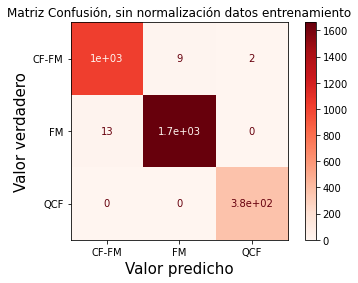

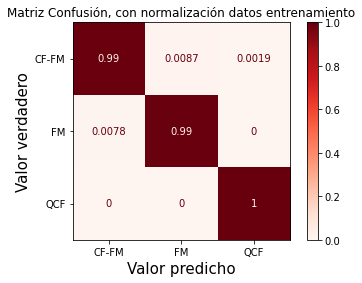

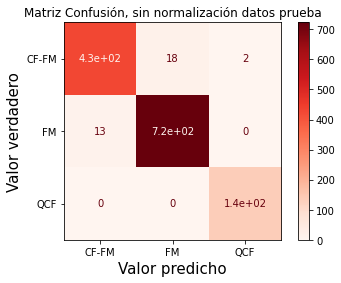

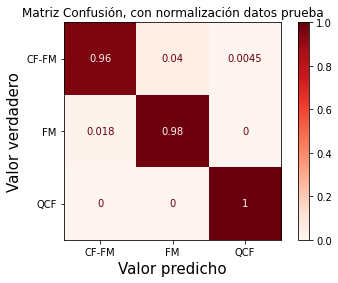

mels_max(x)for(y9)
Frecuencia final (kHz)
Frecuencia mínima (kHz)
Frecuencia inicial (kHz)
Frecuencia máxima (kHz)
Frecuencia pico (kHz)


<Figure size 720x4320 with 0 Axes>

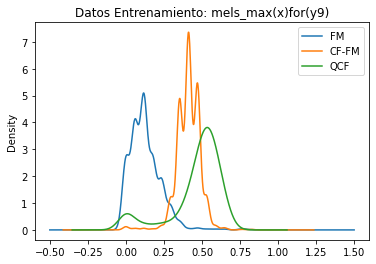

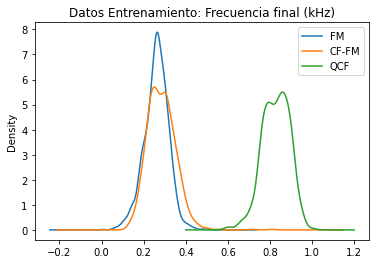

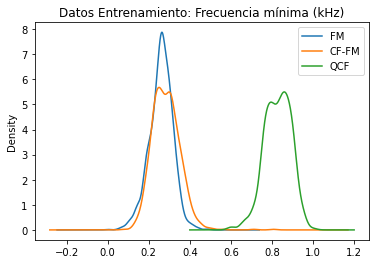

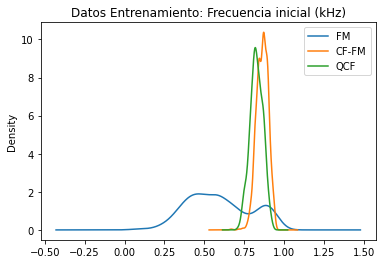

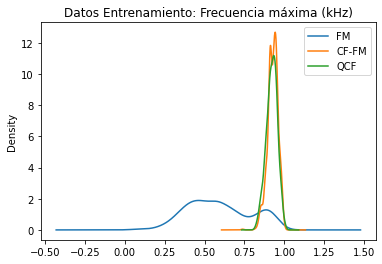

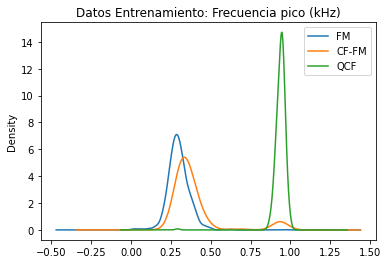

mels_max(x)for(y9)
Frecuencia final (kHz)
Frecuencia mínima (kHz)
Frecuencia inicial (kHz)
Frecuencia máxima (kHz)
Frecuencia pico (kHz)


<Figure size 720x4320 with 0 Axes>

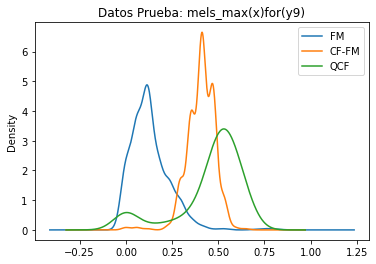

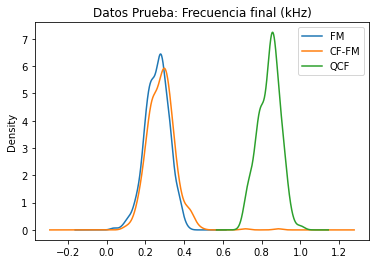

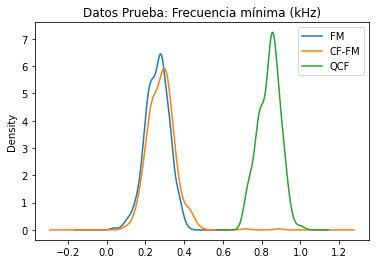

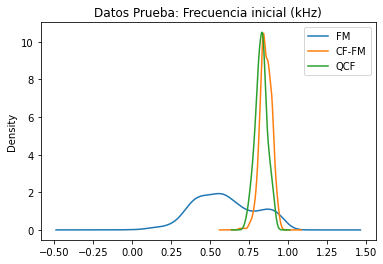

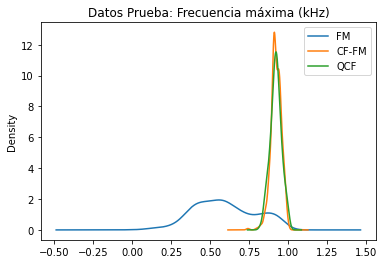

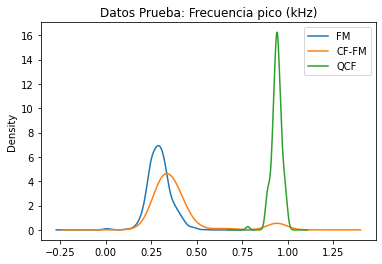

In [ ]:
#####################Pulsos###############################
## RamdomForest para los datos de los pulsos ['CF_FM','FM','QCF']
labels_=target1
class_names = ['CF-FM','FM','QCF']

## Datos de todas las características 
df = pd.DataFrame(features_fordes, columns=feature_names)
experimento='rf_pulsos_todos'
feature_names_=feature_names

## Valores de los mejores parámetros
n_estimators_ = 1000    # Number of trees in random forest
max_features_ = None  # Number of features to consider at every split
max_depth_ = 1000       # Maximum number of levels in tree
min_samples_split_ = 5 # Minimum number of samples required to split a node
min_samples_leaf_ = 4 # Minimum number of samples required at each leaf node

## Llamado a la funcion para validar los mejores paràmetros
validar_mejores_parametros(labels_, class_names,feature_names_, df,max_depth_, max_features_ ,min_samples_leaf_, min_samples_split_, n_estimators_)
  

### Pulsos mejores características automáticas


(1322, 592)
Validación mejores parámetros 
Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           1       0.92      0.94      0.93       449
           2       0.96      0.95      0.96       736
           3       0.94      0.94      0.94       137

    accuracy                           0.95      1322
   macro avg       0.94      0.94      0.94      1322
weighted avg       0.95      0.95      0.95      1322


=============Caracerísticas Importantes para los valores de prueba ========================
mels_max(x)for(y9)   Importancia = 0.57
mels_avg(y8)         Importancia = 0.21
zero_crossing_rate   Importancia = 0.03
Rolloff_0.8_avg      Importancia = 0.01
chroma_stft_max(avg(y1):avg(y12)) Importancia = 0.01
chroma_stft_max(x)for(y8) Importancia = 0.01
mels_order_by(avg(y1):avg(y12))desc(10) Importancia = 0.01
mels_max(x)for(y7)   Importanc

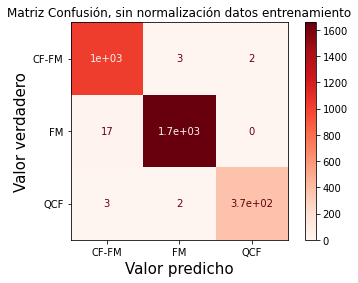

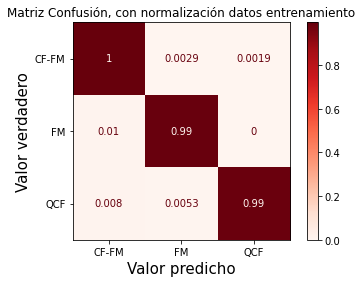

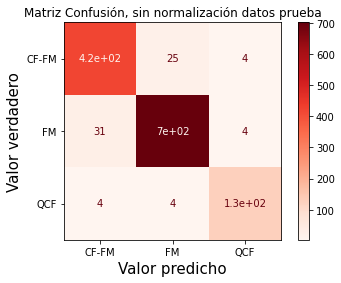

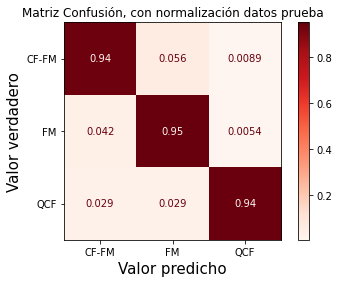

mels_max(x)for(y9)
mels_avg(y8)
zero_crossing_rate
Rolloff_0.8_avg
chroma_stft_max(avg(y1):avg(y12))
chroma_stft_max(x)for(y8)
mels_order_by(avg(y1):avg(y12))desc(10)
mels_max(x)for(y7)
mels_max(x)for(y8)
mels_median(y10)


<Figure size 720x4320 with 0 Axes>

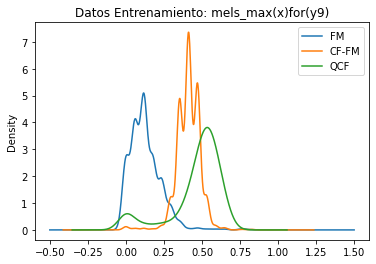

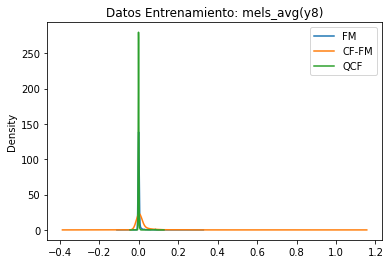

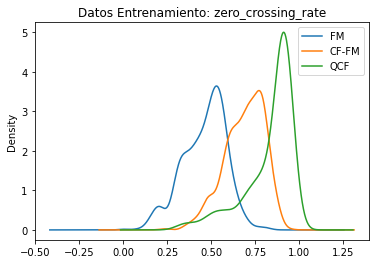

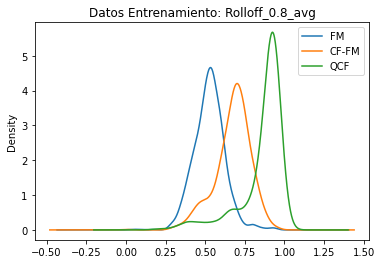

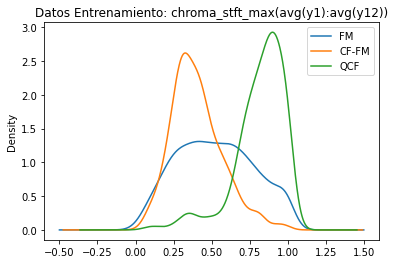

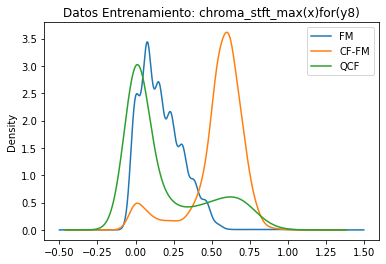

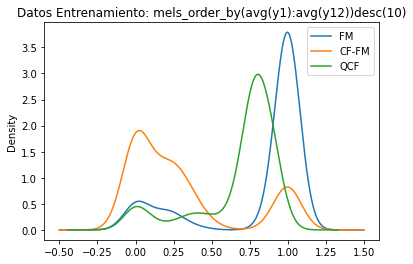

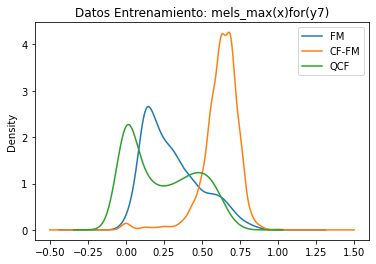

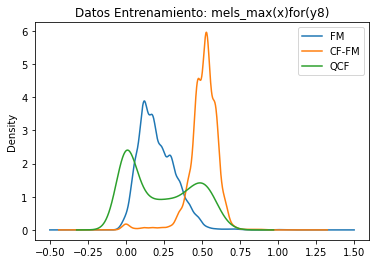

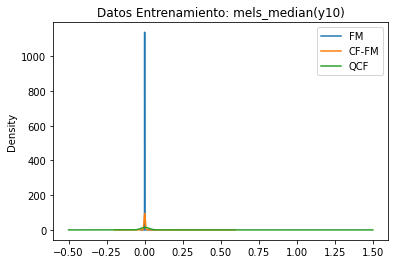

mels_max(x)for(y9)
mels_avg(y8)
zero_crossing_rate
Rolloff_0.8_avg
chroma_stft_max(avg(y1):avg(y12))
chroma_stft_max(x)for(y8)
mels_order_by(avg(y1):avg(y12))desc(10)
mels_max(x)for(y7)
mels_max(x)for(y8)
mels_median(y10)


<Figure size 720x4320 with 0 Axes>

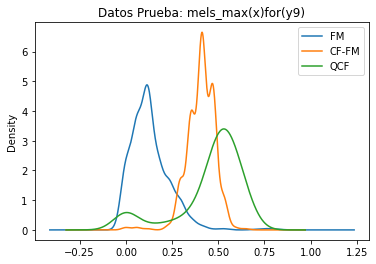

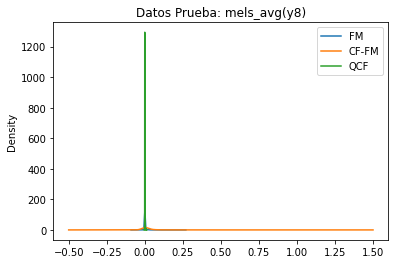

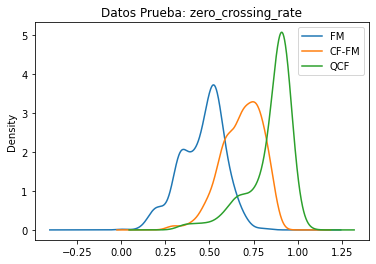

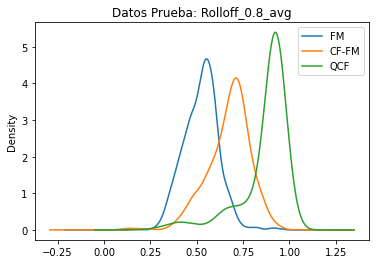

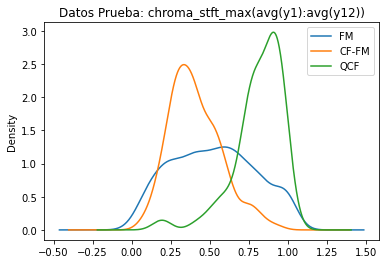

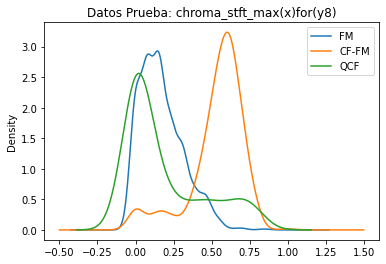

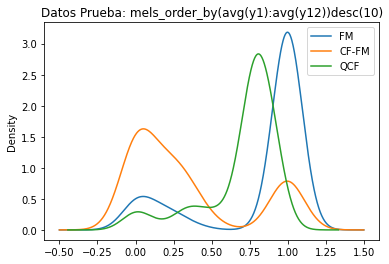

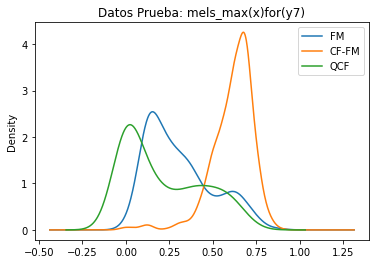

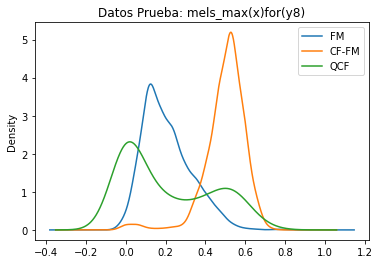

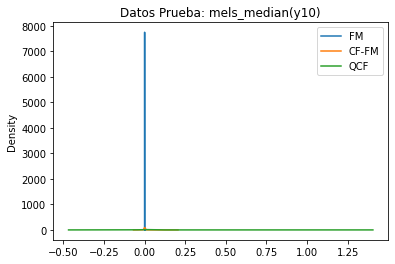

In [ ]:
#####################Pulsos###############################
## RamdomForest para los datos de los pulsos ['CF_FM','FM','QCF']
labels_=target1
class_names = ['CF-FM','FM','QCF']
## Datos de las características automáticas
experimento='rf_pulsos_auto'
df = pd.DataFrame(features_aut, columns=feature_names_aut)
feature_names_=feature_names_aut
#####################Pulsos###############################

## Valores de los mejores parámetros
n_estimators_ = 100    # Number of trees in random forest
max_features_ = None  # Number of features to consider at every split
max_depth_ = 10       # Maximum number of levels in tree
min_samples_split_ = 3 # Minimum number of samples required to split a node
min_samples_leaf_ = 2 # Minimum number of samples required at each leaf node

## Llamado a la función para validar los mejores parámetros
validar_mejores_parametros(labels_, class_names,feature_names_, df,max_depth_, max_features_ ,min_samples_leaf_, min_samples_split_, n_estimators_)
  

### Pulsos mejores caracteristicas manuales

(1322, 8)
Validación mejores parámetros 
Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           1       1.00      0.98      0.99       449
           2       0.99      1.00      0.99       736
           3       0.99      1.00      0.99       137

    accuracy                           0.99      1322
   macro avg       0.99      0.99      0.99      1322
weighted avg       0.99      0.99      0.99      1322


=============Caracerísticas Importantes para los valores de prueba ========================
Frecuencia máxima (kHz) Importancia = 0.52
Ancho de banda (kHz) Importancia = 0.1
Frecuencia inicial (kHz) Importancia = 0.09
Frecuencia final (kHz) Importancia = 0.09
Frecuencia mínima (kHz) Importancia = 0.09
Duración (ms)        Importancia = 0.09
Frecuencia pico (kHz) Importancia = 0.01
=============Matriz para los valores de prueba ==========

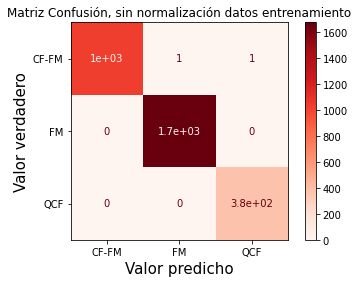

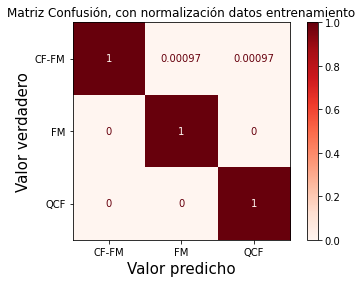

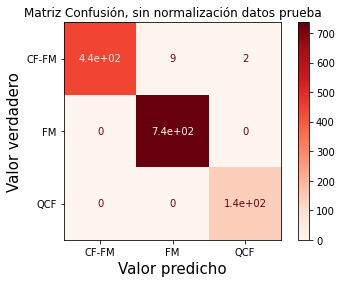

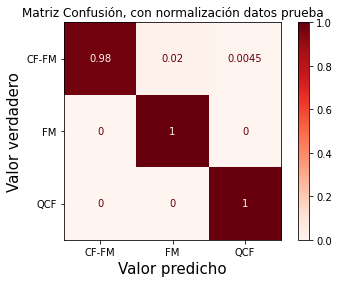

Frecuencia máxima (kHz)
Ancho de banda (kHz)
Frecuencia inicial (kHz)
Frecuencia final (kHz)
Frecuencia mínima (kHz)
Duración (ms)
Frecuencia pico (kHz)


<Figure size 720x4320 with 0 Axes>

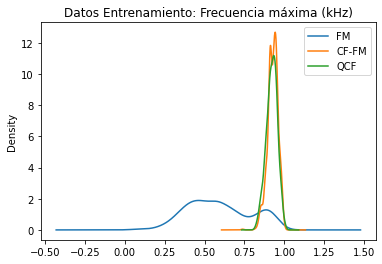

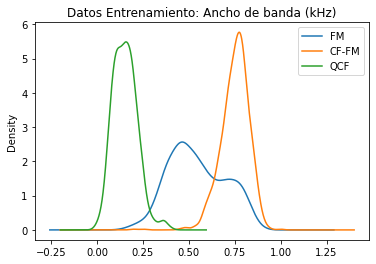

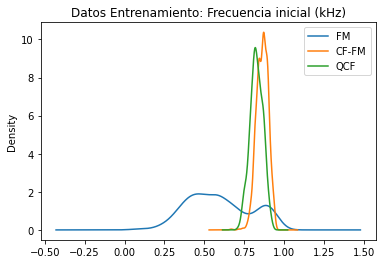

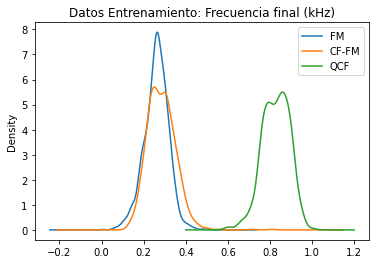

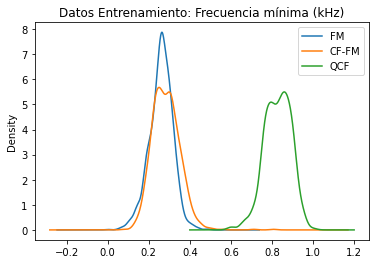

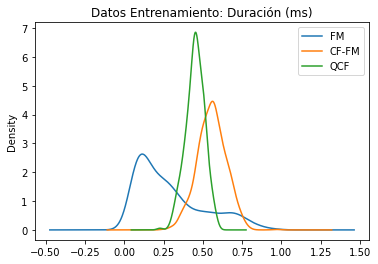

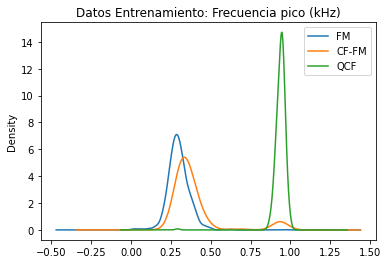

Frecuencia máxima (kHz)
Ancho de banda (kHz)
Frecuencia inicial (kHz)
Frecuencia final (kHz)
Frecuencia mínima (kHz)
Duración (ms)
Frecuencia pico (kHz)


<Figure size 720x4320 with 0 Axes>

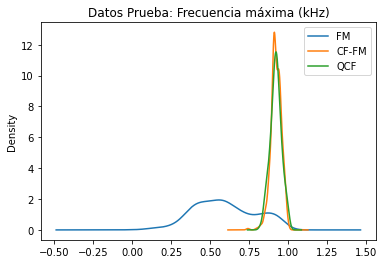

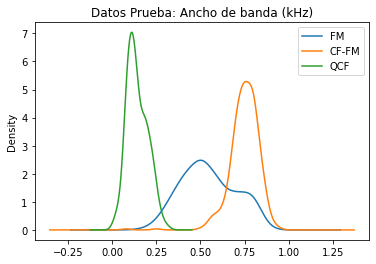

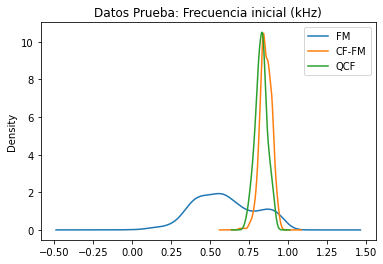

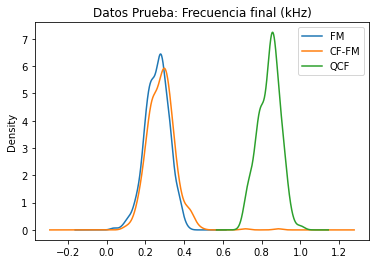

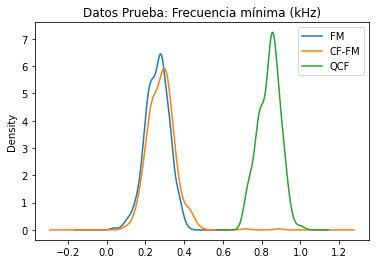

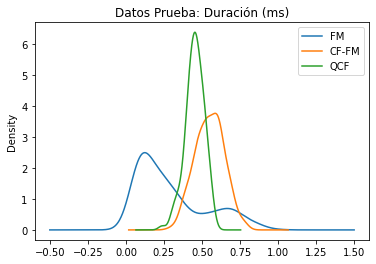

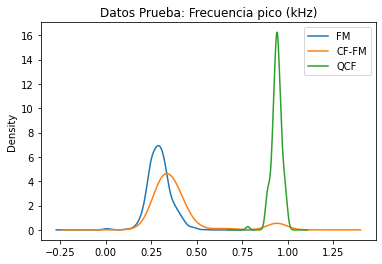

In [ ]:
#####################Pulsos###############################
## RamdomForest para los datos de los pulsos ['CF_FM','FM','QCF']
labels_=target1
class_names = ['CF-FM','FM','QCF']

## Datos de las características manuales
columns = ['Frecuencia pico (kHz)','Frecuencia inicial (kHz)','Frecuencia final (kHz)','Frecuencia máxima (kHz)','Frecuencia mínima (kHz)','Ancho de banda (kHz)','Duración (ms)','Intervalo (ms)']
experimento='rf_pulsos_manuales'
df = scaled_data_tipo_pulso1[columns]
feature_names_= columns

## Valores de los mejores parámetros
n_estimators_ = 150    # Number of trees in random forest
max_features_ = None  # Number of features to consider at every split
max_depth_ = 250       # Maximum number of levels in tree
min_samples_split_ = 3 # Minimum number of samples required to split a node
min_samples_leaf_ = 1 # Minimum number of samples required at each leaf node

## Llamado a la función para validar los mejores parámetros
validar_mejores_parametros(labels_, class_names,feature_names_, df,max_depth_, max_features_ ,min_samples_leaf_, min_samples_split_, n_estimators_)
  

### Fases mejores caracteristicas todo el conjunto de datos

(1322, 600)
Validación mejores parámetros 
Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           1       0.96      0.99      0.97       901
           2       0.84      0.70      0.76       231
           3       0.84      0.89      0.87       190

    accuracy                           0.92      1322
   macro avg       0.88      0.86      0.87      1322
weighted avg       0.92      0.92      0.92      1322


=============Caracerísticas Importantes para los valores de prueba ========================
Intervalo (ms)       Importancia = 0.59
Duración (ms)        Importancia = 0.11
delta_mfcc_median(y8) Importancia = 0.02
Ancho de banda (kHz) Importancia = 0.01
chroma_stft_avg(y4)  Importancia = 0.01
mels_median(y9)      Importancia = 0.01
delta_mfcc_avg(y8)   Importancia = 0.01
delta2_mfcc_order_by(avg(x1):avg(x21))desc(1) Importancia = 0.01
=

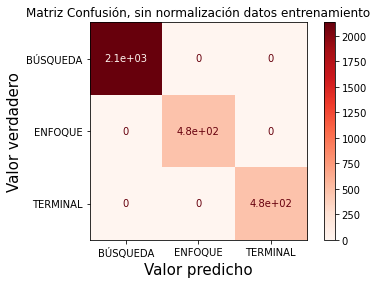

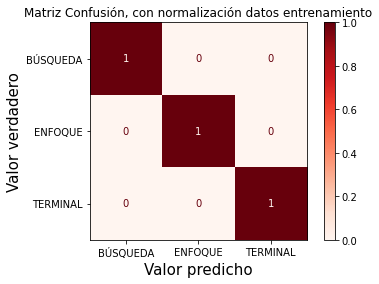

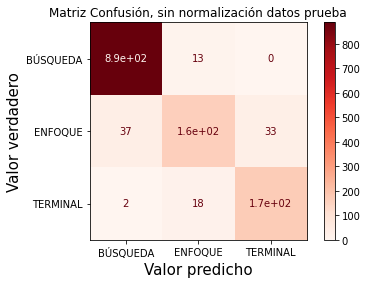

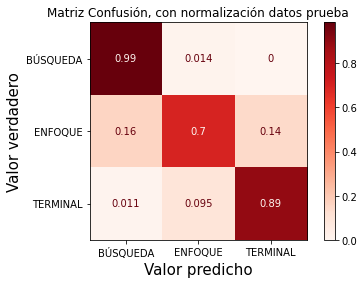

Intervalo (ms)
Duración (ms)
delta_mfcc_median(y8)
Ancho de banda (kHz)
chroma_stft_avg(y4)
mels_median(y9)
delta_mfcc_avg(y8)
delta2_mfcc_order_by(avg(x1):avg(x21))desc(1)


<Figure size 720x4320 with 0 Axes>

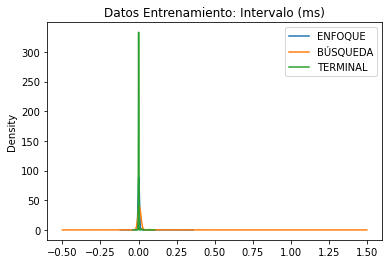

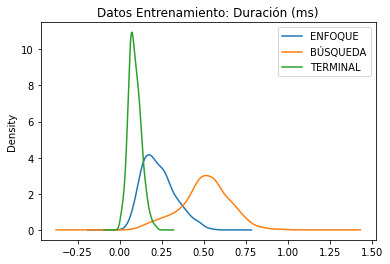

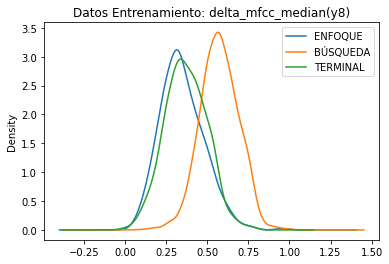

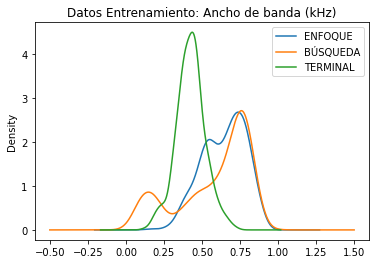

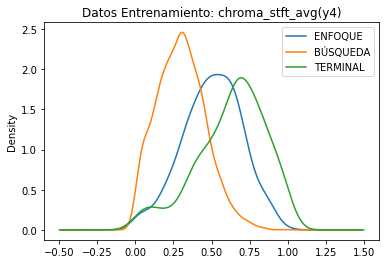

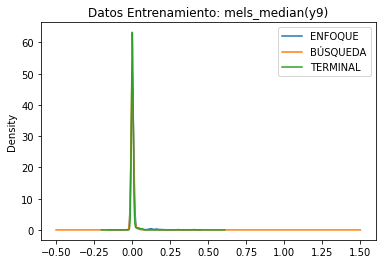

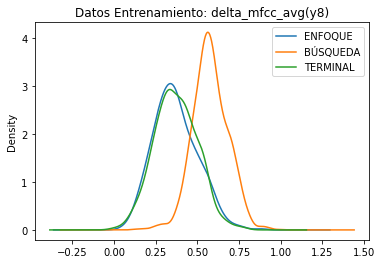

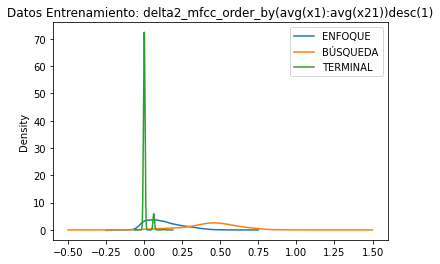

Intervalo (ms)
Duración (ms)
delta_mfcc_median(y8)
Ancho de banda (kHz)
chroma_stft_avg(y4)
mels_median(y9)
delta_mfcc_avg(y8)
delta2_mfcc_order_by(avg(x1):avg(x21))desc(1)


<Figure size 720x4320 with 0 Axes>

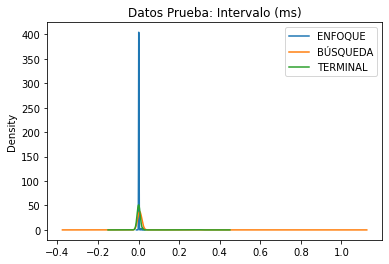

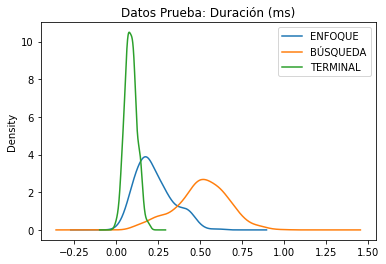

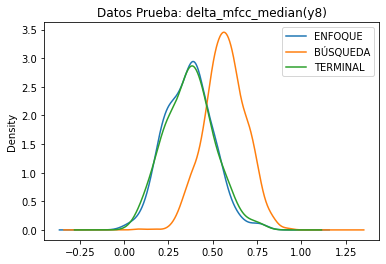

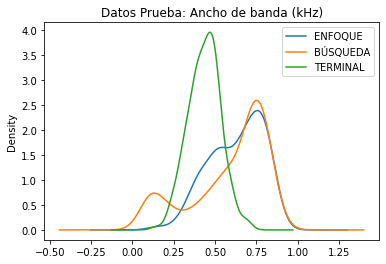

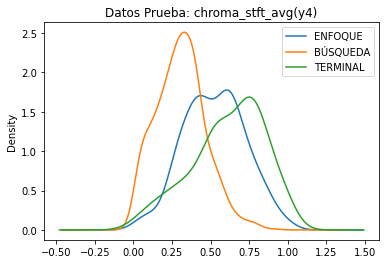

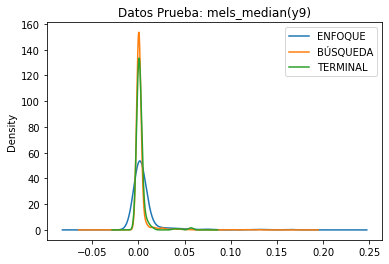

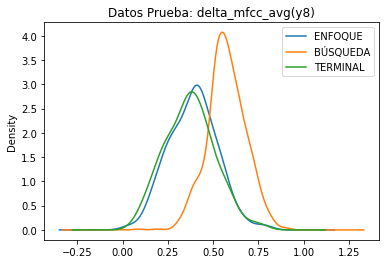

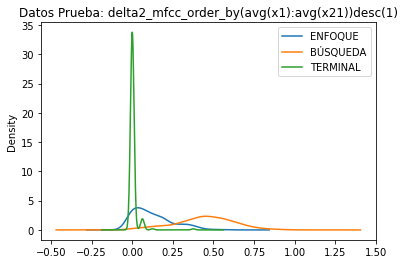

In [ ]:

#####################Fases###############################
labels_=target_fase1
class_names = ['BÚSQUEDA','ENFOQUE','TERMINAL']

## Datos de las características todos
df = pd.DataFrame(features_fordes, columns=feature_names)
feature_names_=feature_names
experimento='rf_fases_todos'

## Valores de los mejores parámetros
n_estimators_ = 250    # Number of trees in random forest
max_features_ = None  # Number of features to consider at every split
max_depth_ = 1200       # Maximum number of levels in tree
min_samples_split_ = 2 # Minimum number of samples required to split a node
min_samples_leaf_ = 1 # Minimum number of samples required at each leaf node

## Llamado a la función para validar los mejores parámetros
validar_mejores_parametros(labels_, class_names,feature_names_, df,max_depth_, max_features_ ,min_samples_leaf_, min_samples_split_, n_estimators_)
  

### Fases Mejores caracteristicas para el conjunto de características automáticas

(1322, 592)
Validación mejores parámetros 
Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           1       0.95      0.96      0.95       901
           2       0.77      0.61      0.68       231
           3       0.76      0.91      0.83       190

    accuracy                           0.89      1322
   macro avg       0.83      0.82      0.82      1322
weighted avg       0.89      0.89      0.89      1322


=============Caracerísticas Importantes para los valores de prueba ========================
Duracion_(ms)        Importancia = 0.14
mels_max(x)for(y7)   Importancia = 0.05
delta_mfcc_avg(y8)   Importancia = 0.05
delta_mfcc_order_by(avg(x1):avg(x21))desc(1) Importancia = 0.05
delta2_mfcc_order_by(avg(x1):avg(x21))desc(1) Importancia = 0.05
mfcc_order_by(avg(x1):avg(x21))desc(2) Importancia = 0.04
mels_max(y)for(x5)   Importancia = 0.03


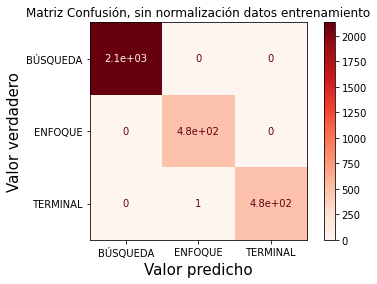

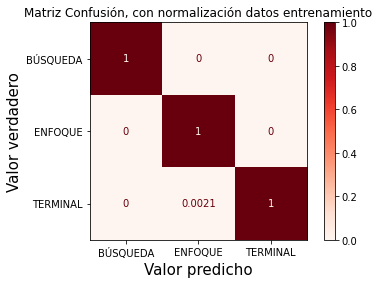

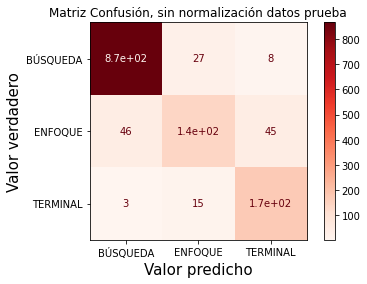

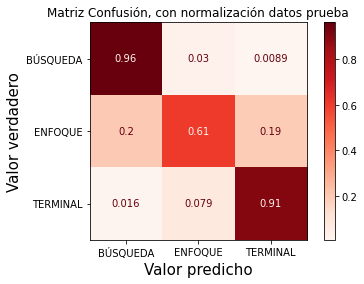

Duracion_(ms)
mels_max(x)for(y7)
delta_mfcc_avg(y8)
delta_mfcc_order_by(avg(x1):avg(x21))desc(1)
delta2_mfcc_order_by(avg(x1):avg(x21))desc(1)
mfcc_order_by(avg(x1):avg(x21))desc(2)
mels_max(y)for(x5)
mfcc_order_by(avg(x1):avg(x21))desc(1)
mfcc_order_by(avg(x1):avg(x21))desc(4)
delta_mfcc_median(y8)
mels_avg(y6)
mfcc_order_by(avg(x1):avg(x21))desc(3)
chroma_stft_avg(y4)
chroma_stft_median(y4)
mels_avg(y9)
mels_min(avg(y1):avg(y10))
mels_median(y9)
mfcc_max(x)for(y1)
mfcc_median(y1)
mfcc_order_by(avg(x1):avg(x21))desc(15)


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


mfcc_order_by(avg(x1):avg(x21))desc(16)
mfcc_max(y)for(x6)


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


delta_mfcc_max(x)for(y1)
delta2_mfcc_avg(y7)


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


delta2_mfcc_avg(y10)
delta2_mfcc_median(y10)


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<Figure size 720x4320 with 0 Axes>

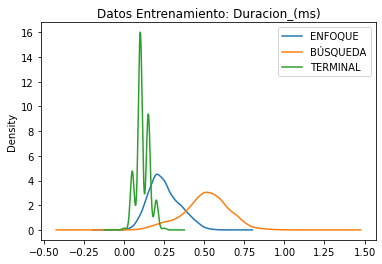

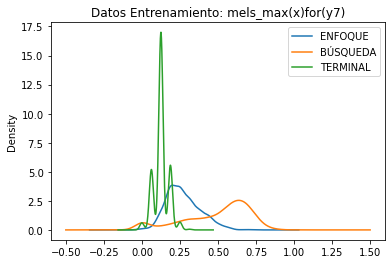

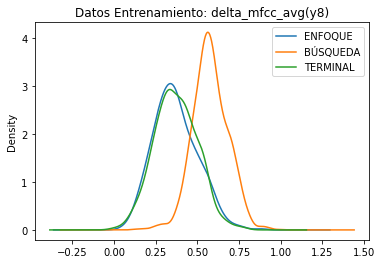

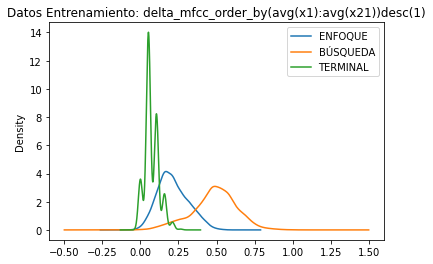

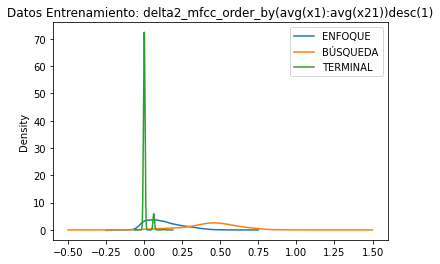

...

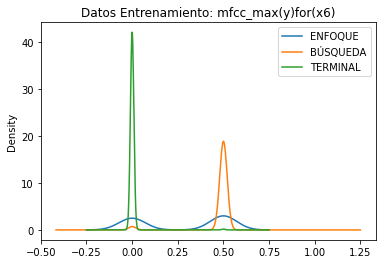

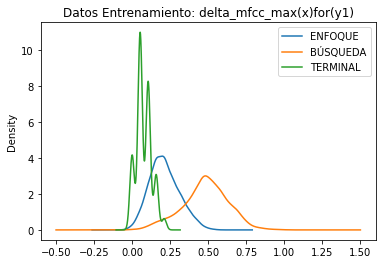

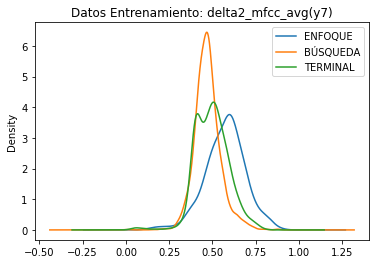

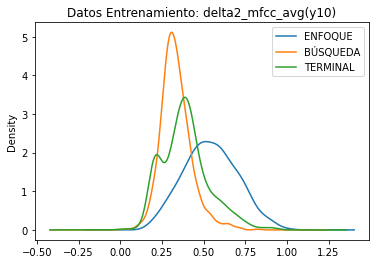

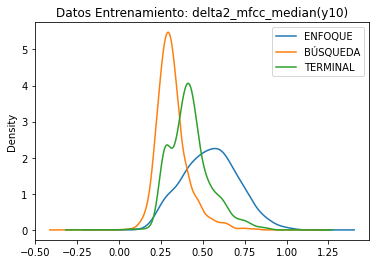

Duracion_(ms)
mels_max(x)for(y7)
delta_mfcc_avg(y8)
delta_mfcc_order_by(avg(x1):avg(x21))desc(1)
delta2_mfcc_order_by(avg(x1):avg(x21))desc(1)
mfcc_order_by(avg(x1):avg(x21))desc(2)
mels_max(y)for(x5)
mfcc_order_by(avg(x1):avg(x21))desc(1)
mfcc_order_by(avg(x1):avg(x21))desc(4)
delta_mfcc_median(y8)
mels_avg(y6)
mfcc_order_by(avg(x1):avg(x21))desc(3)
chroma_stft_avg(y4)
chroma_stft_median(y4)
mels_avg(y9)
mels_min(avg(y1):avg(y10))
mels_median(y9)
mfcc_max(x)for(y1)
mfcc_median(y1)
mfcc_order_by(avg(x1):avg(x21))desc(15)
mfcc_order_by(avg(x1):avg(x21))desc(16)


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

mfcc_max(y)for(x6)
delta_mfcc_max(x)for(y1)


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

delta2_mfcc_avg(y7)
delta2_mfcc_avg(y10)
delta2_mfcc_median(y10)


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<Figure size 720x4320 with 0 Axes>

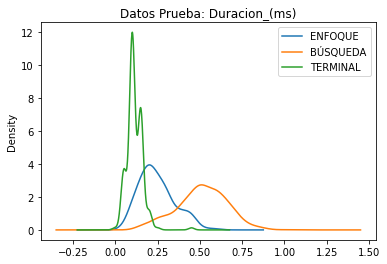

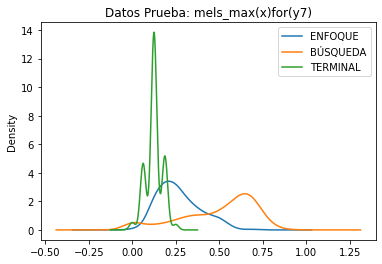

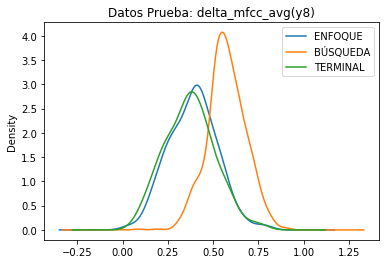

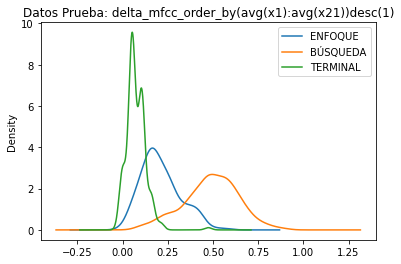

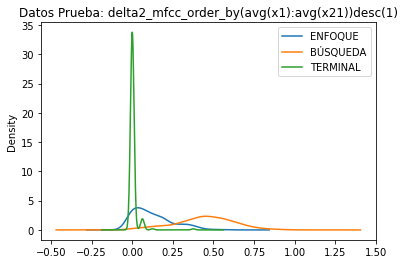

...

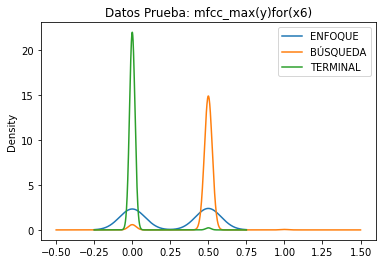

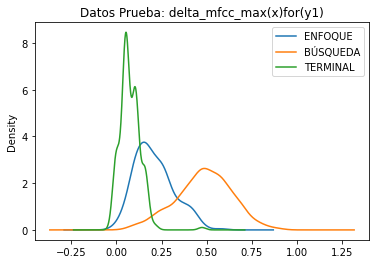

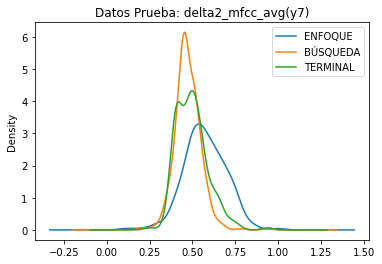

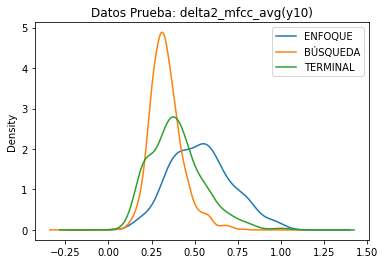

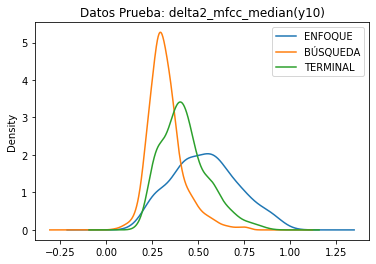

In [ ]:

#####################Fases###############################
labels_=target_fase1
class_names = ['BÚSQUEDA','ENFOQUE','TERMINAL']
## Datos de las características automáticas
experimento='rf_fases_auto'
feature_names_=feature_names_aut
df = pd.DataFrame(features_aut, columns=feature_names_aut)

## Valores de los mejores parámetros
n_estimators_ = 250    # Number of trees in random forest
max_features_ = None  # Number of features to consider at every split
max_depth_ = 2500       # Maximum number of levels in tree
min_samples_split_ = 4  # Minimum number of samples required to split a node
min_samples_leaf_ = 1 # Minimum number of samples required at each leaf node

## Llamado a la función para validar los mejores parámetros
validar_mejores_parametros(labels_, class_names,feature_names_, df,max_depth_, max_features_ ,min_samples_leaf_, min_samples_split_, n_estimators_)
  

### Fases Mejores caracteristicas para el conjunto de caracteristicas manuales

(1322, 8)
Validación mejores parámetros 
Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

              precision    recall  f1-score   support

           1       0.97      0.98      0.97       901
           2       0.84      0.73      0.78       231
           3       0.84      0.92      0.88       190

    accuracy                           0.93      1322
   macro avg       0.88      0.88      0.88      1322
weighted avg       0.93      0.93      0.93      1322


=============Caracerísticas Importantes para los valores de prueba ========================
Intervalo (ms)       Importancia = 0.64
Duración (ms)        Importancia = 0.19
Ancho de banda (kHz) Importancia = 0.06
Frecuencia pico (kHz) Importancia = 0.03
Frecuencia inicial (kHz) Importancia = 0.02
Frecuencia final (kHz) Importancia = 0.02
Frecuencia máxima (kHz) Importancia = 0.02
Frecuencia mínima (kHz) Importancia = 0.02
=============Mat

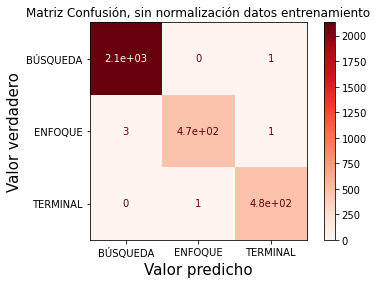

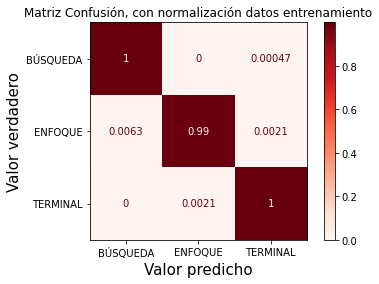

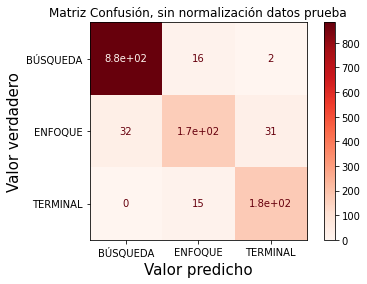

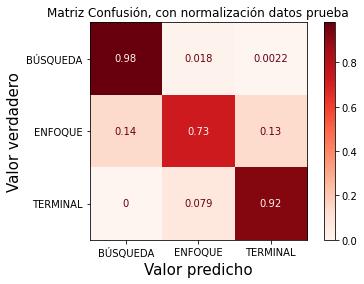

Intervalo (ms)
Duración (ms)
Ancho de banda (kHz)
Frecuencia pico (kHz)
Frecuencia inicial (kHz)
Frecuencia final (kHz)
Frecuencia máxima (kHz)
Frecuencia mínima (kHz)


<Figure size 720x4320 with 0 Axes>

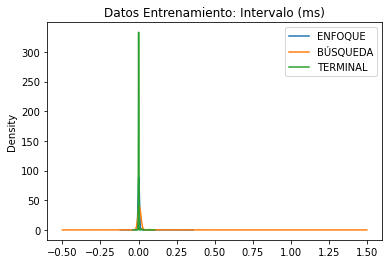

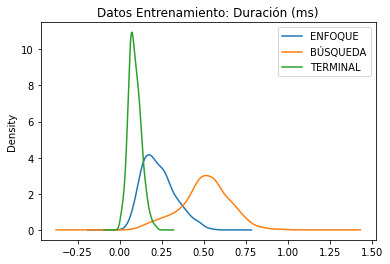

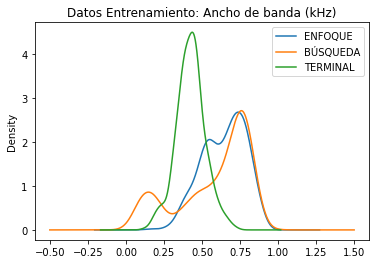

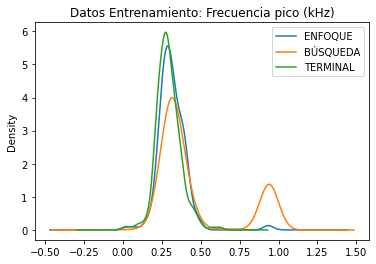

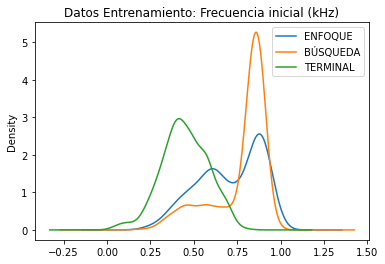

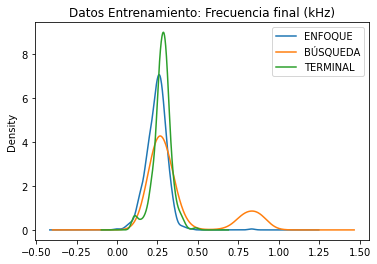

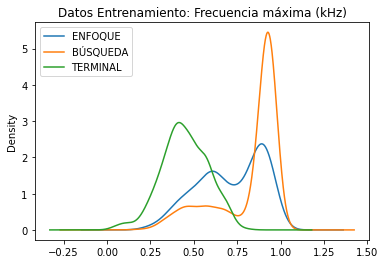

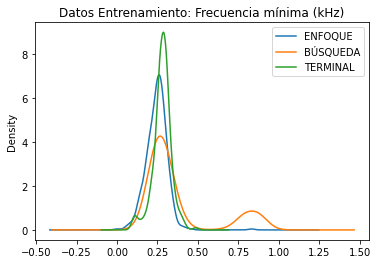

Intervalo (ms)
Duración (ms)
Ancho de banda (kHz)
Frecuencia pico (kHz)
Frecuencia inicial (kHz)
Frecuencia final (kHz)
Frecuencia máxima (kHz)
Frecuencia mínima (kHz)


<Figure size 720x4320 with 0 Axes>

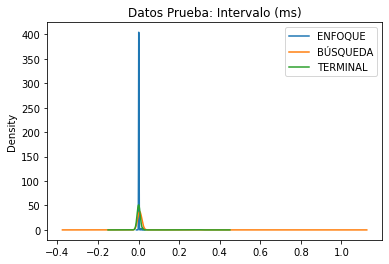

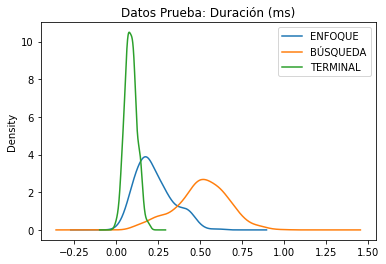

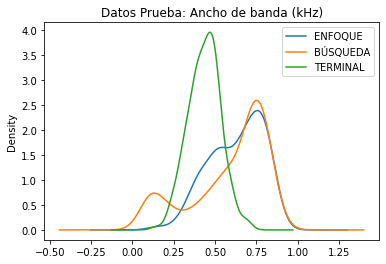

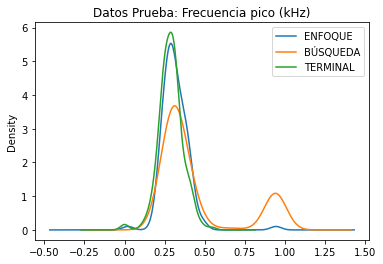

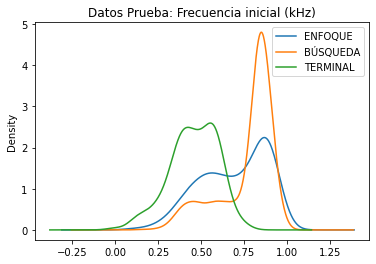

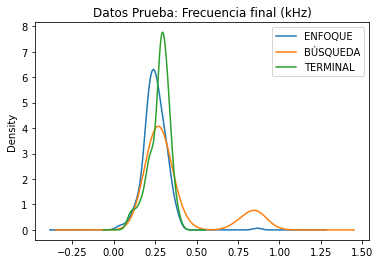

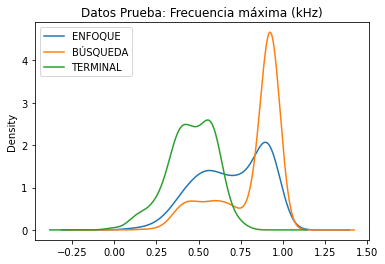

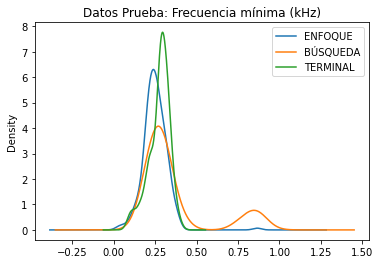

In [ ]:
#####################Fases###############################
labels_=target_fase1
class_names = ['BÚSQUEDA','ENFOQUE','TERMINAL']

## Datos de las características manuales
columns = ['Frecuencia pico (kHz)','Frecuencia inicial (kHz)','Frecuencia final (kHz)','Frecuencia máxima (kHz)','Frecuencia mínima (kHz)','Ancho de banda (kHz)','Duración (ms)','Intervalo (ms)']
experimento='rf_fases_manuales'
df = scaled_data_tipo_pulso1[columns]
feature_names_= columns

## Valores de los mejores paràmetros
n_estimators_ = 2000    # Number of trees in random forest
max_features_ = None  # Number of features to consider at every split
max_depth_ = 900       # Maximum number of levels in tree
min_samples_split_ = 4 # Minimum number of samples required to split a node
min_samples_leaf_ = 1 # Minimum number of samples required at each leaf node

## Llamado a la funcion para validar los mejores paràmetros
validar_mejores_parametros(labels_, class_names,feature_names_, df,max_depth_, max_features_ ,min_samples_leaf_, min_samples_split_, n_estimators_)
  

## Se implementa PCA para reducir la dimensionalidad


### PCA y Clusterización pulsos Mejores Características todos

Pulsos mejores características Todo el conjunto de datos
6
shape of X_pca (4404, 6)
Varianza explicada # componentes = 3 0.9731638671136627


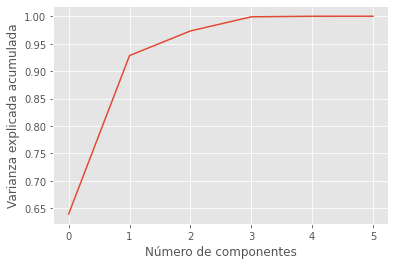

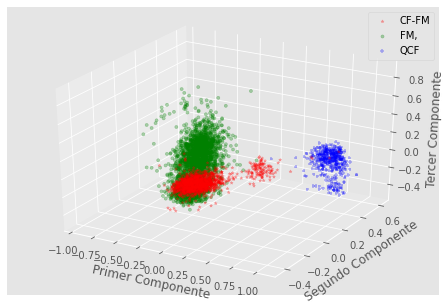

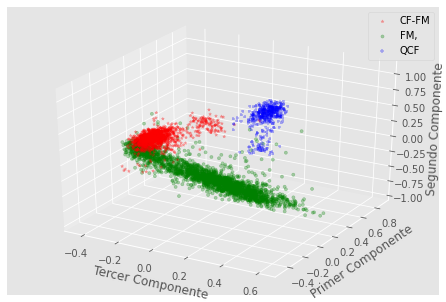

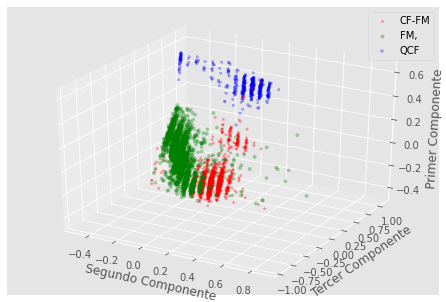

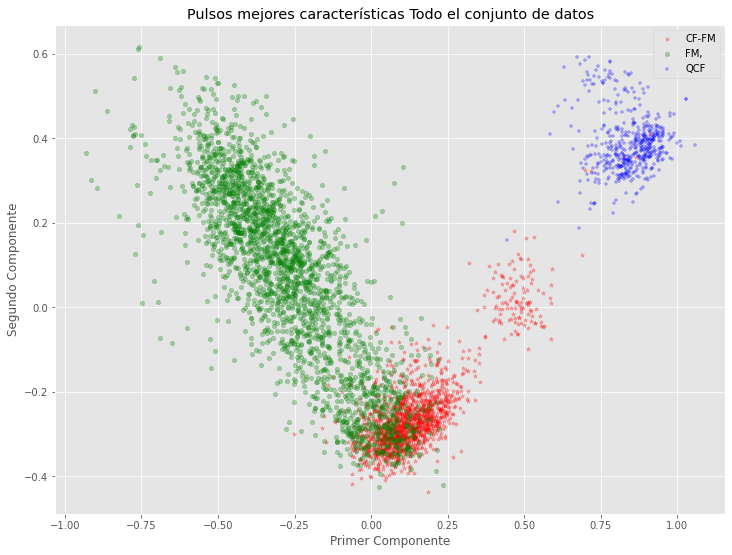

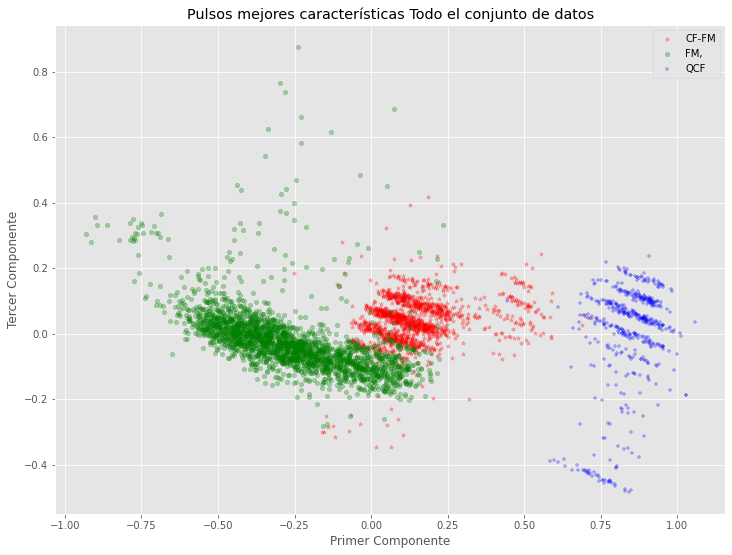

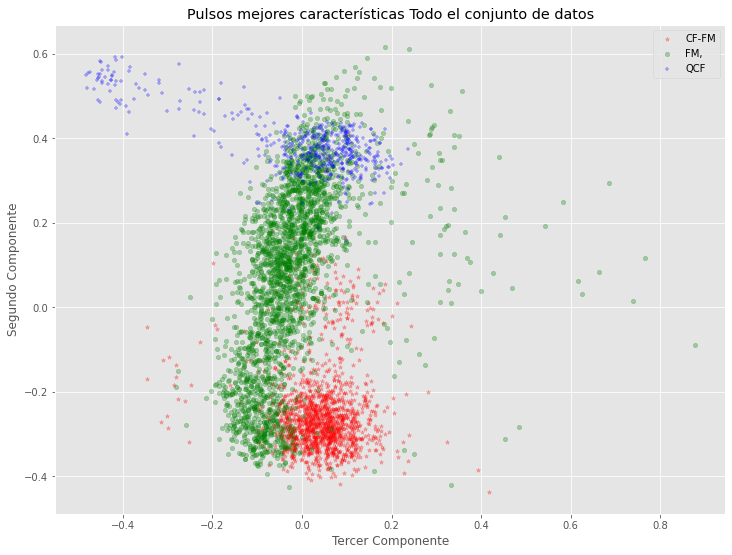

(3082, 3)
(3082, 3)
(1322, 3)


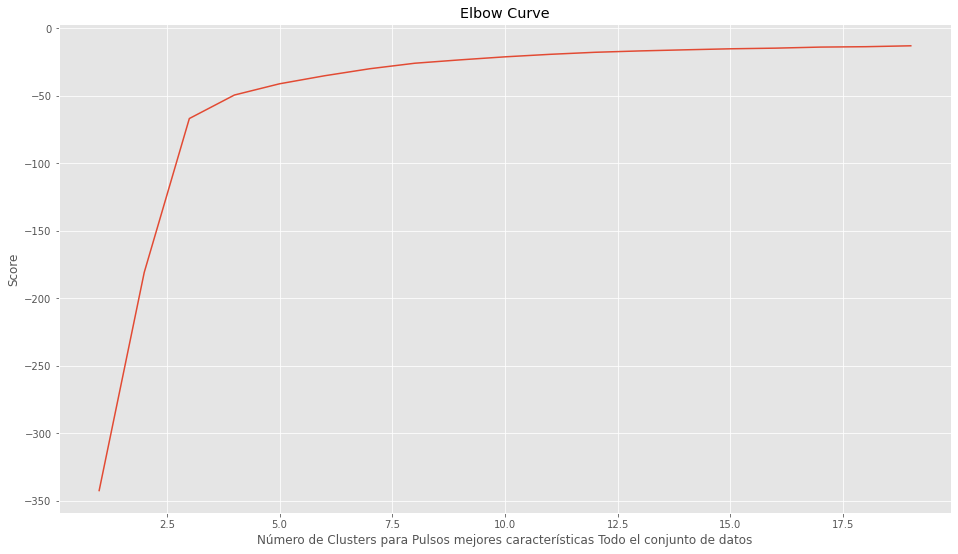

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_pulsos_todos_3
Pulsos mejores características Todo el conjunto de datos
6
shape of X_pca (4404, 6)
Varianza explicada # componentes = 6 0.9999999999999998


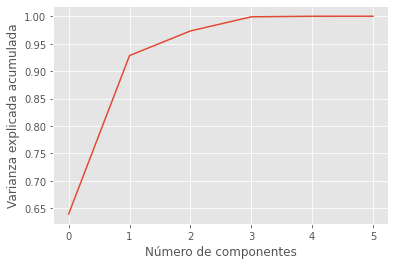

(3082, 6)
(3082, 6)
(1322, 6)


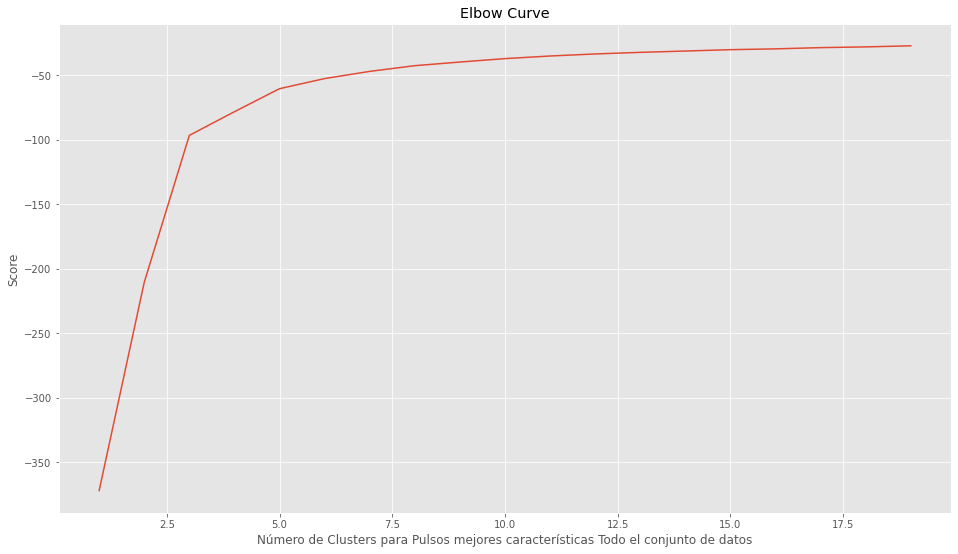

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_pulsos_todos
(3082, 6)
(3082, 6)
(1322, 6)


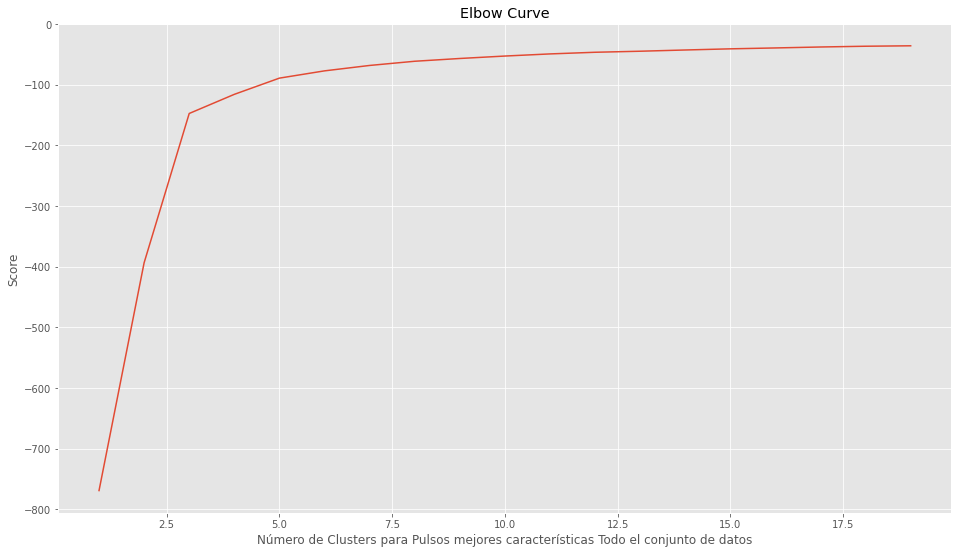

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento rf_pulsos_todos


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'CF-FM',2:'FM,',3:'QCF'}
labels=target1
titulo_='Pulsos mejores características Todo el conjunto de datos'
columns=['mels_max(x)for(y9)', 'Frecuencia final (kHz)', 'Frecuencia mínima (kHz)', 'Frecuencia inicial (kHz)', 'Frecuencia máxima (kHz)', 'Frecuencia pico (kHz)']
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_pulsos_todos_3'
sigla_experimento_='PCA_rf_pt_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=6
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_pulsos_todos'
sigla_experimento_='PCA_rf_pt_6'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='rf_pulsos_todos'
sigla_experimento_='rf_pt_6' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)

### PCA y Clusterización pulsos Mejores Características automáticas



Pulsos mejores características Automáticas
10
shape of X_pca (4404, 10)
Varianza explicada # componentes = 3 0.8733649768613305


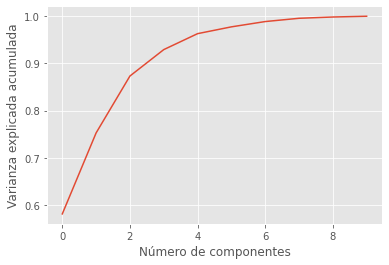

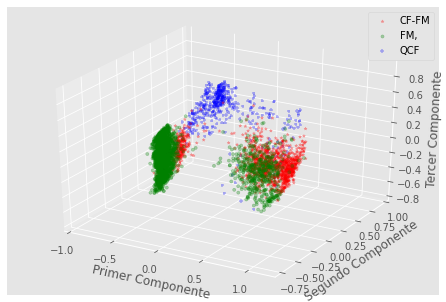

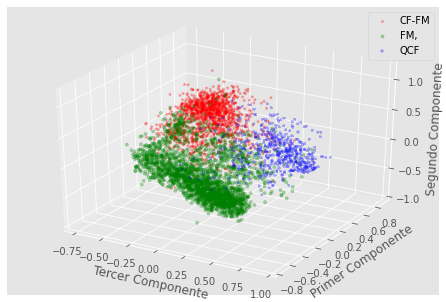

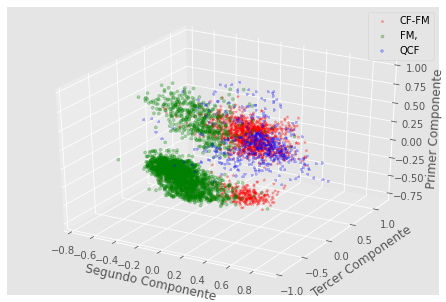

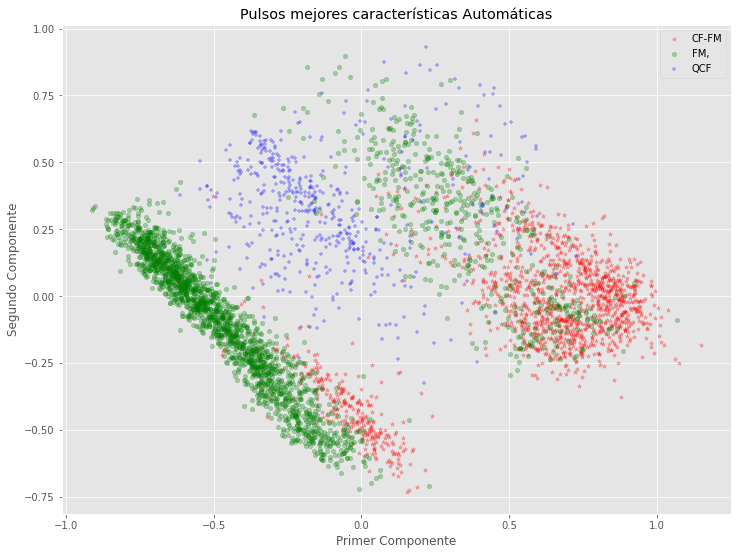

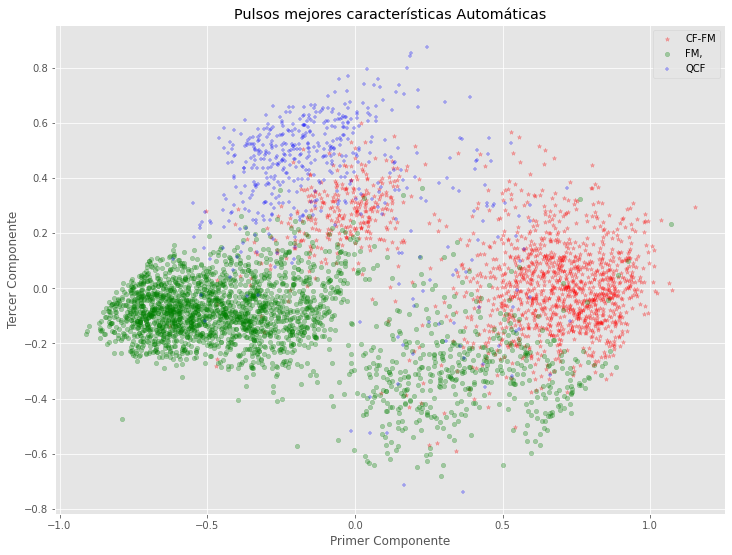

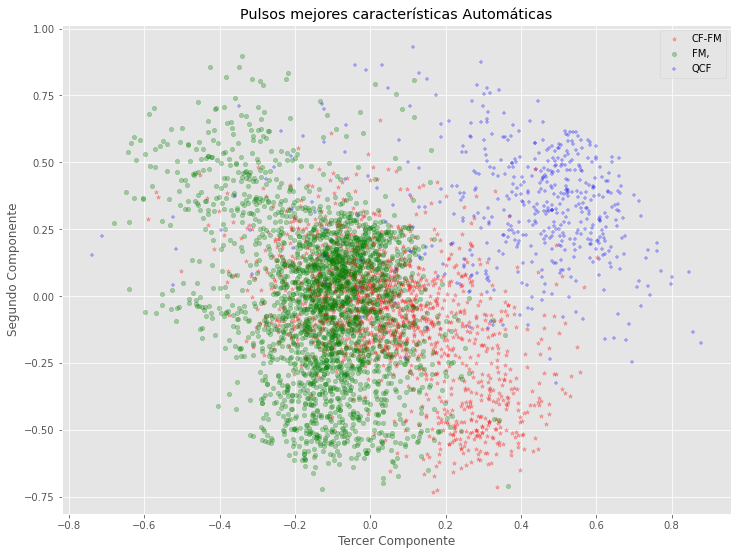

(3082, 3)
(3082, 3)
(1322, 3)


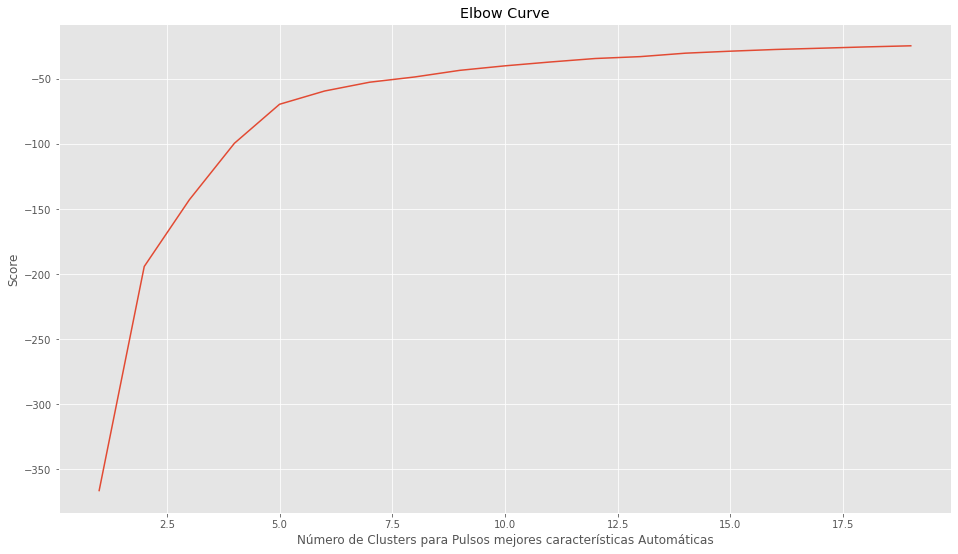

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_pulsos_auto_3
Pulsos mejores características Automáticas
10
shape of X_pca (4404, 10)
Varianza explicada # componentes = 10 1.0000000000000002


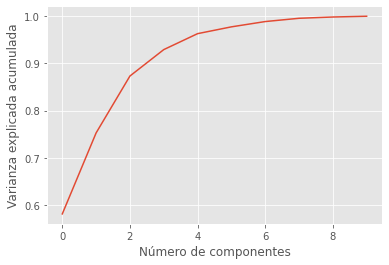

(3082, 10)
(3082, 10)
(1322, 10)


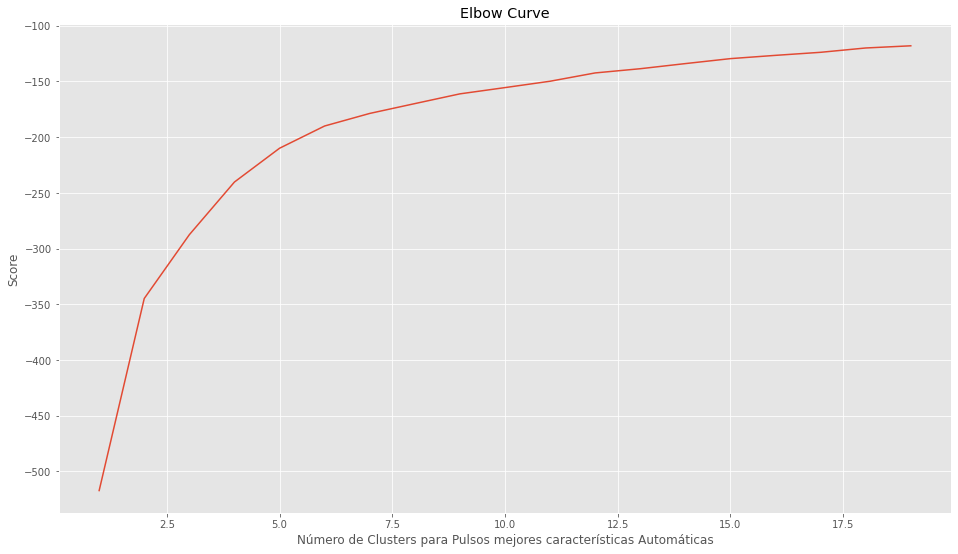

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_pulsos_auto
(3082, 10)
(3082, 10)
(1322, 10)


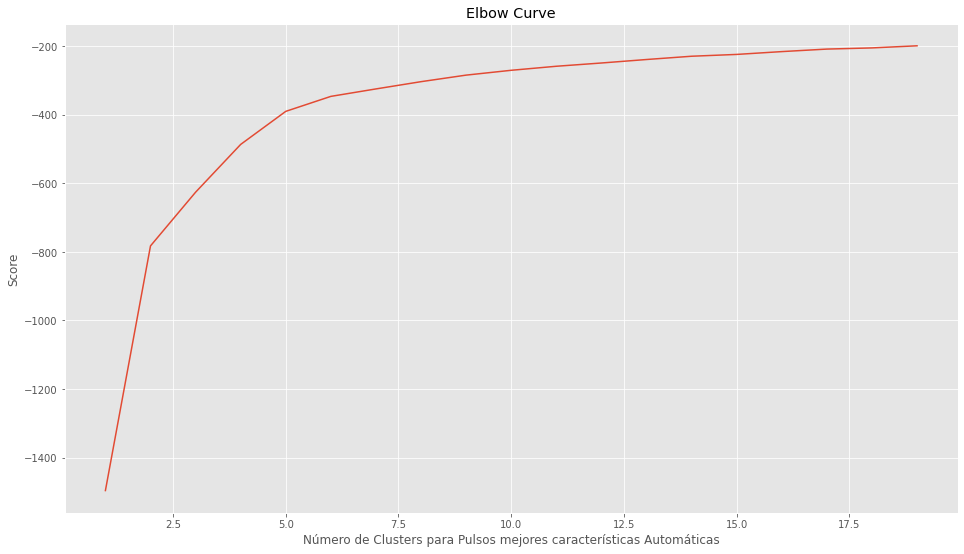

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento rf_pulsos_auto


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'CF-FM',2:'FM,',3:'QCF'}
labels=target1
titulo_='Pulsos mejores características Automáticas'
columns=['mels_max(x)for(y9)', 'mels_avg(y8)', 'zero_crossing_rate', 'Rolloff_0.8_avg', 'chroma_stft_max(avg(y1):avg(y12))', 'chroma_stft_max(x)for(y8)', 'mels_order_by(avg(y1):avg(y12))desc(10)', 'mels_max(x)for(y7)', 'mels_max(x)for(y8)', 'mels_median(y10)']
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_pulsos_auto_3'
sigla_experimento_='PCA_rf_pa_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=10
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_pulsos_auto'
sigla_experimento_='PCA_rf_pa_10'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='rf_pulsos_auto'
sigla_experimento_='rf_pa_10' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)


### PCA y Clusterización pulsos Mejores Características manuales

Pulsos mejores características manuales
7
shape of X_pca (4404, 7)
Varianza explicada # componentes = 3 0.9754123421270646


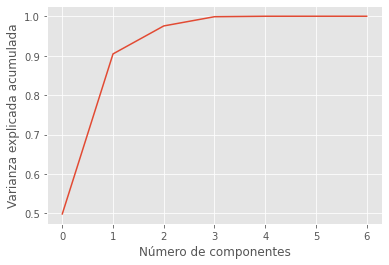

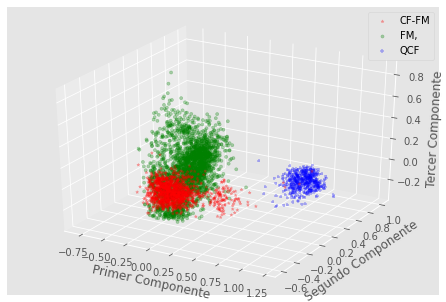

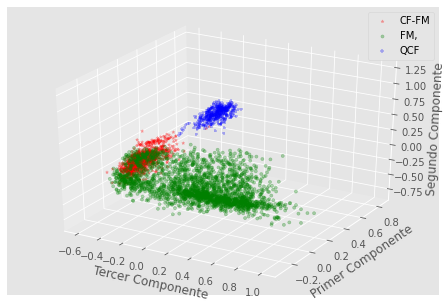

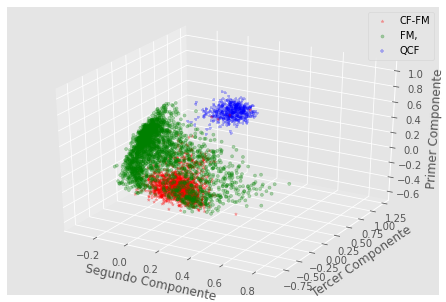

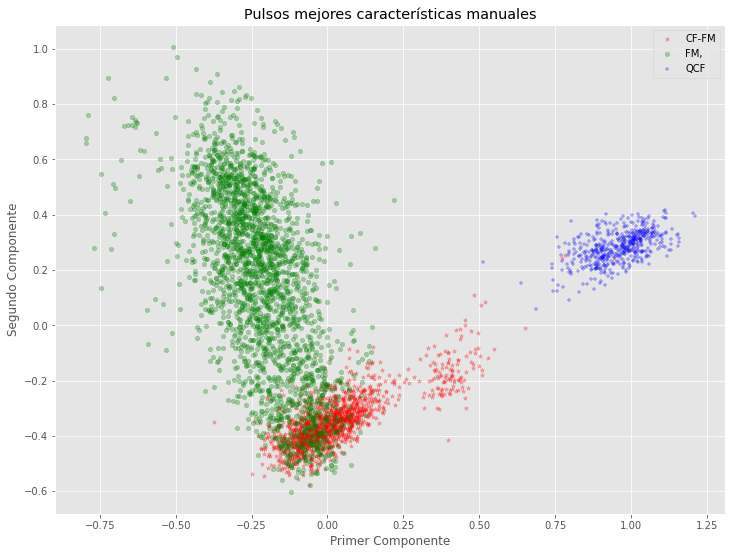

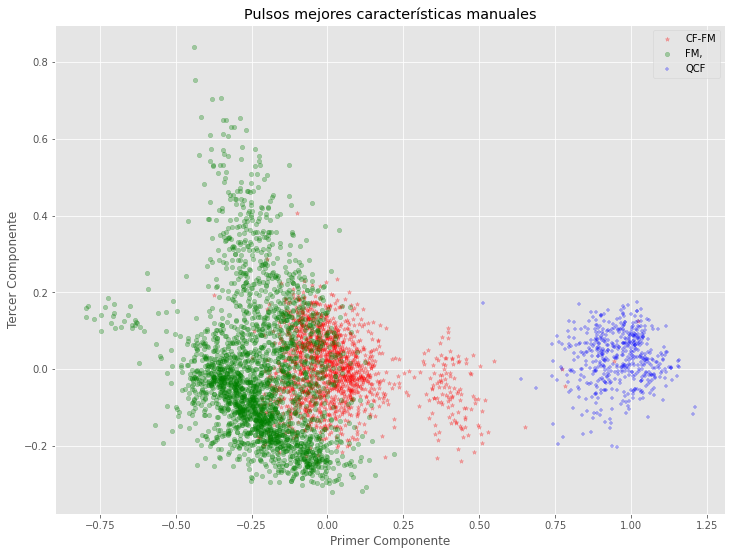

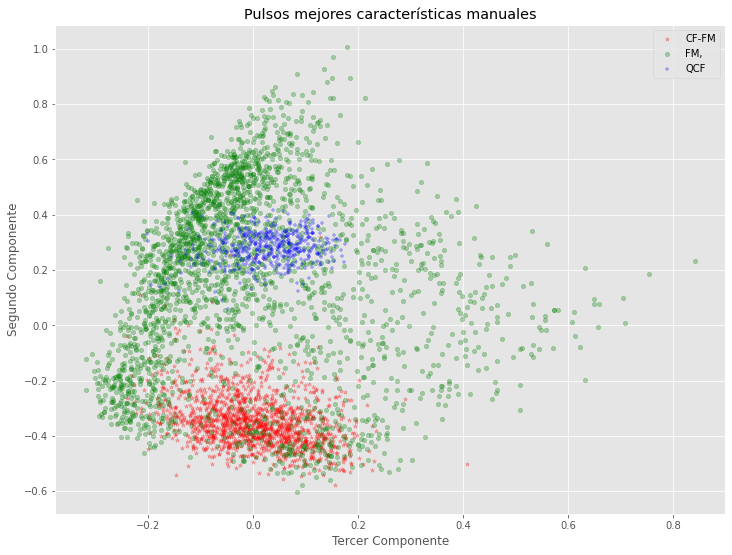

(3082, 3)
(3082, 3)
(1322, 3)


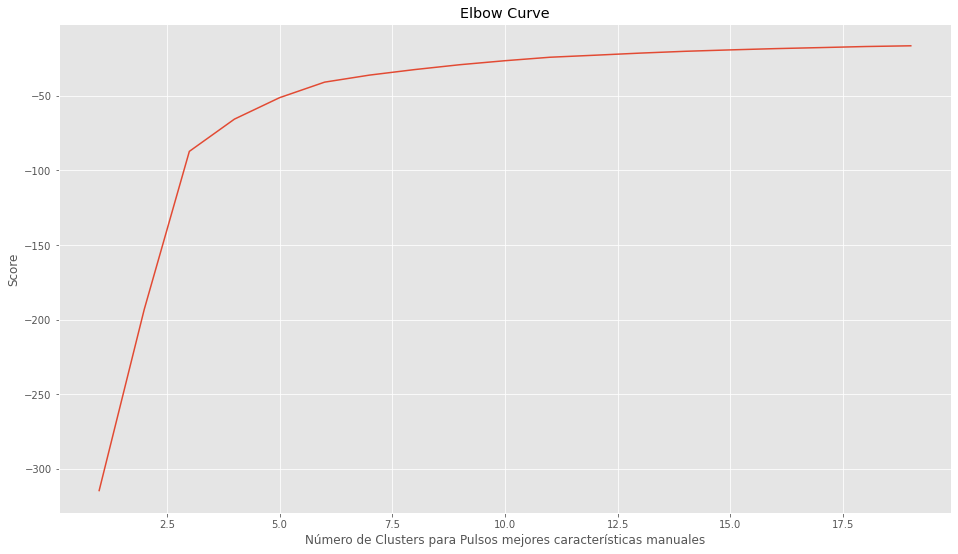

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_pulsos_manuales_3
Pulsos mejores características manuales
7
shape of X_pca (4404, 7)
Varianza explicada # componentes = 7 1.0


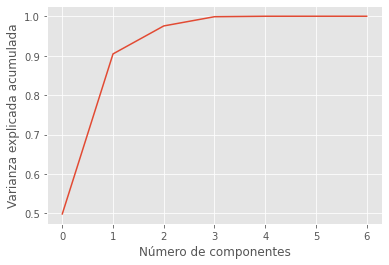

(3082, 7)
(3082, 7)
(1322, 7)


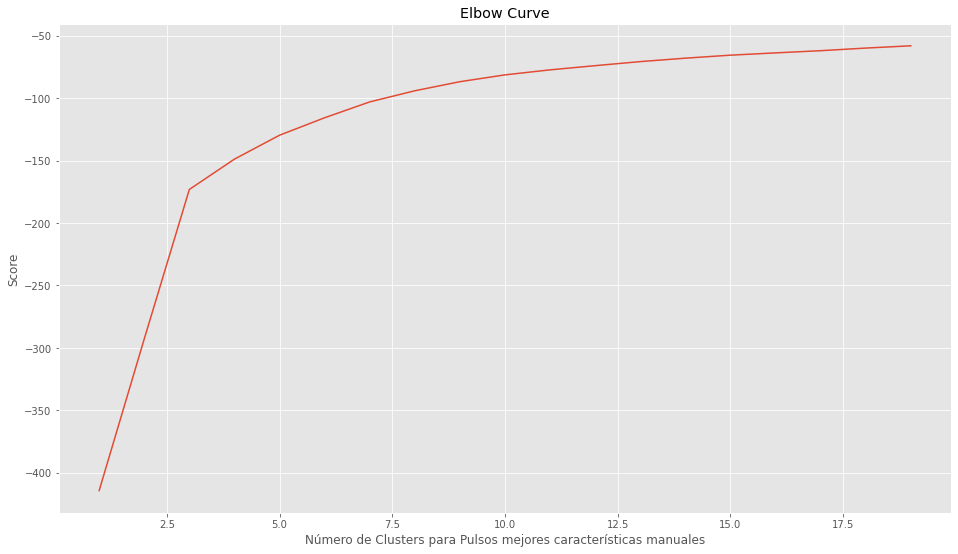

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_pulsos_manuales
(3082, 7)
(3082, 7)
(1322, 7)


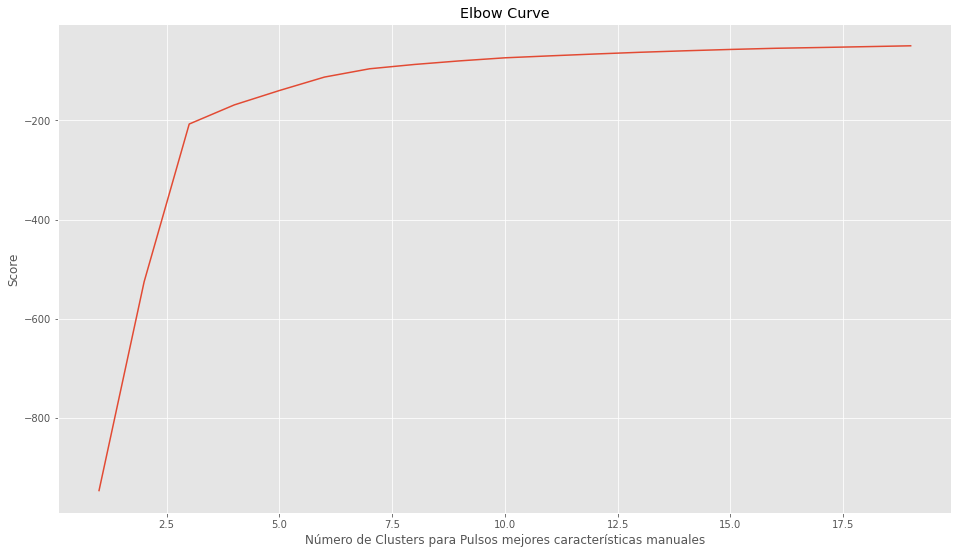

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento rf_pulsos_manuales


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'CF-FM',2:'FM,',3:'QCF'}
labels=target1
titulo_='Pulsos mejores características manuales'
columns=['Frecuencia máxima (kHz)', 'Ancho de banda (kHz)', 'Frecuencia inicial (kHz)', 'Frecuencia final (kHz)', 'Frecuencia mínima (kHz)', 'Duración (ms)', 'Frecuencia pico (kHz)']
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_pulsos_manuales_3'
sigla_experimento_='PCA_rf_pm_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=7
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_pulsos_manuales'
sigla_experimento_='PCA_rf_pm_7'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='rf_pulsos_manuales'
sigla_experimento_='rf_pm_7' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)

### PCA y Clusterización pulsos Todos los datos

Pulsos todas las características
600
shape of X_pca (4404, 600)
Varianza explicada # componentes = 3 0.3701756395605018


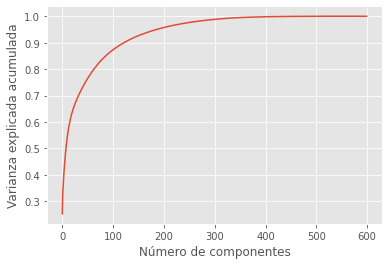

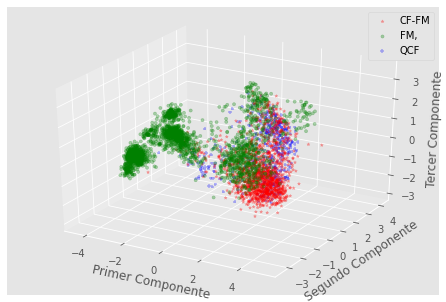

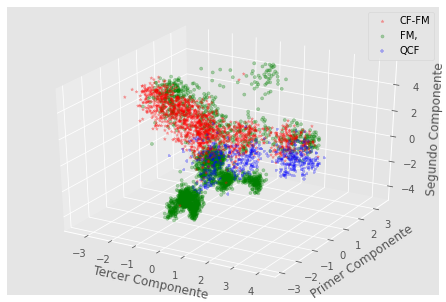

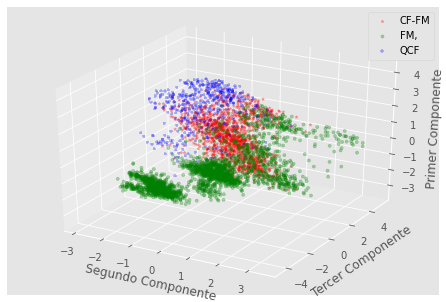

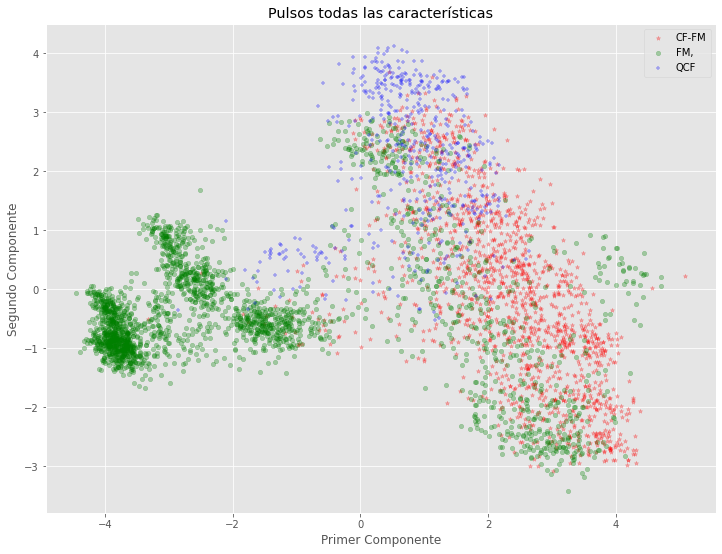

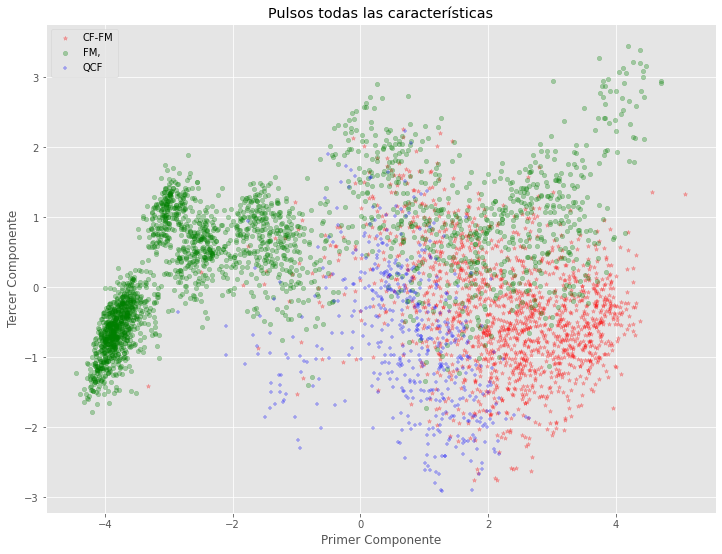

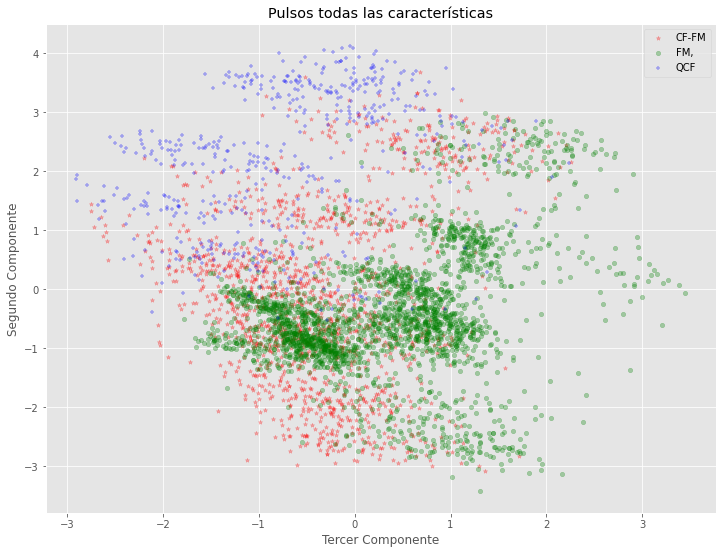

(3082, 3)
(3082, 3)
(1322, 3)


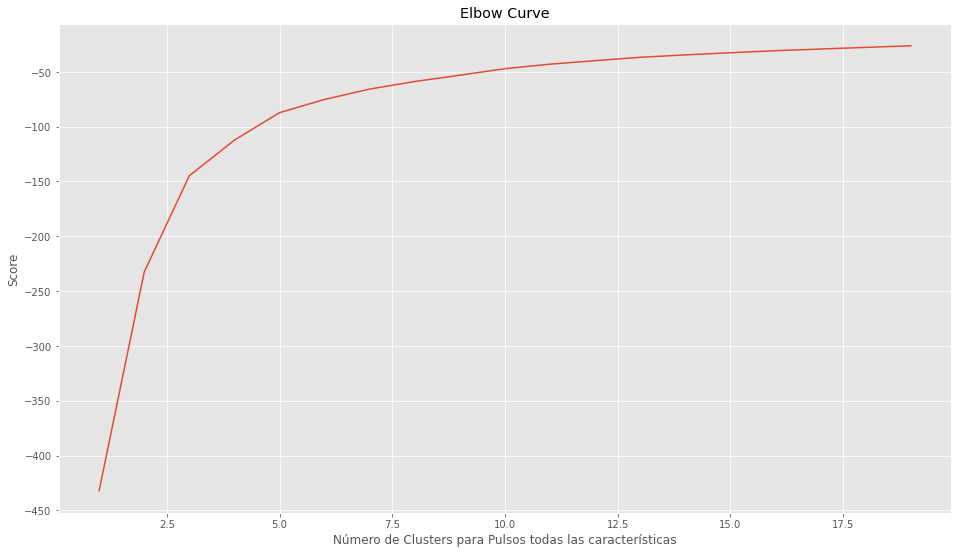

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_pulsos_todos_3
Pulsos todas las características
600
shape of X_pca (4404, 600)
Varianza explicada # componentes = 150 0.9258678816115319


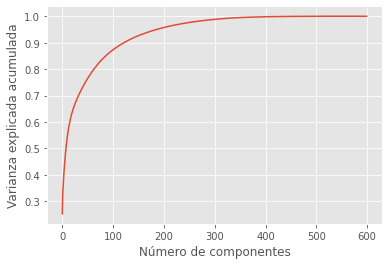

(3082, 150)
(3082, 150)
(1322, 150)


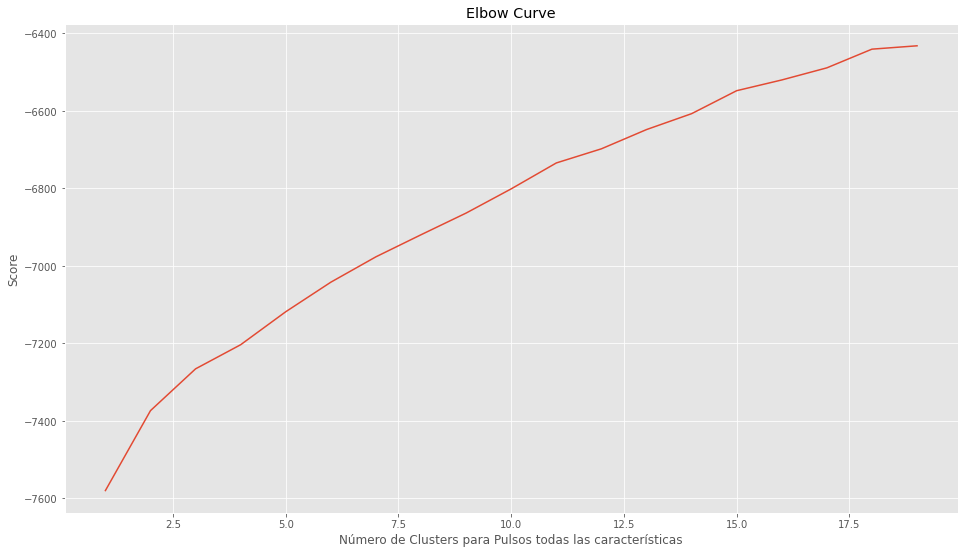

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_pulsos_todos
(3082, 600)
(3082, 600)
(1322, 600)


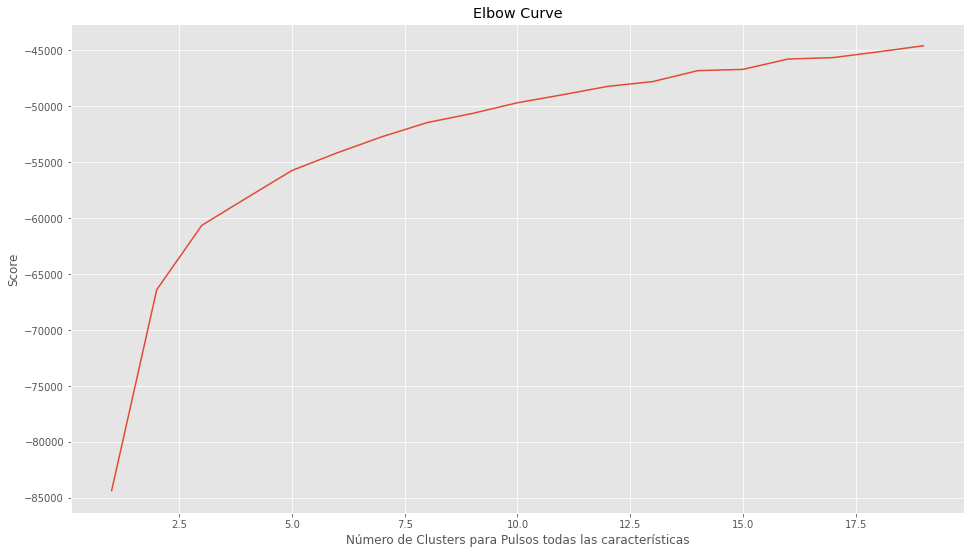

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pulsos_todos


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'CF-FM',2:'FM,',3:'QCF'}
labels=target1
titulo_='Pulsos todas las características'
columns=feature_names
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_pulsos_todos_3'
sigla_experimento_='PCA_pt_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=150
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_pulsos_todos'
sigla_experimento_='PCA_pt_150'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='pulsos_todos'
sigla_experimento_='pt_600' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)


### PCA y Clusterización pulsos Solo las Caracteristicas automáticas

Pulsos características Automáticas
592
shape of X_pca (4404, 592)
Varianza explicada # componentes = 3 0.3685666144557091


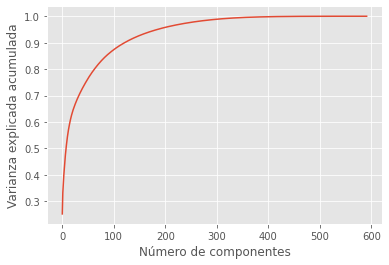

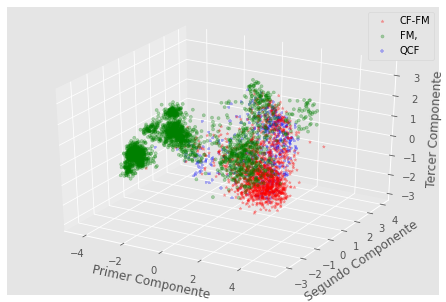

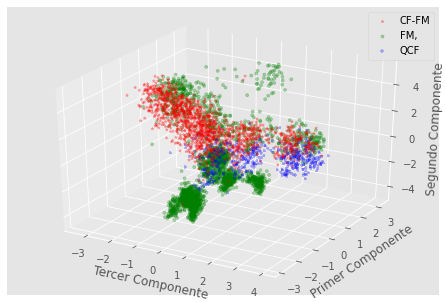

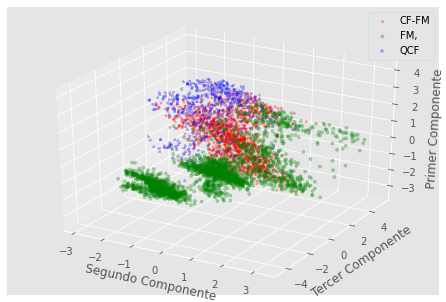

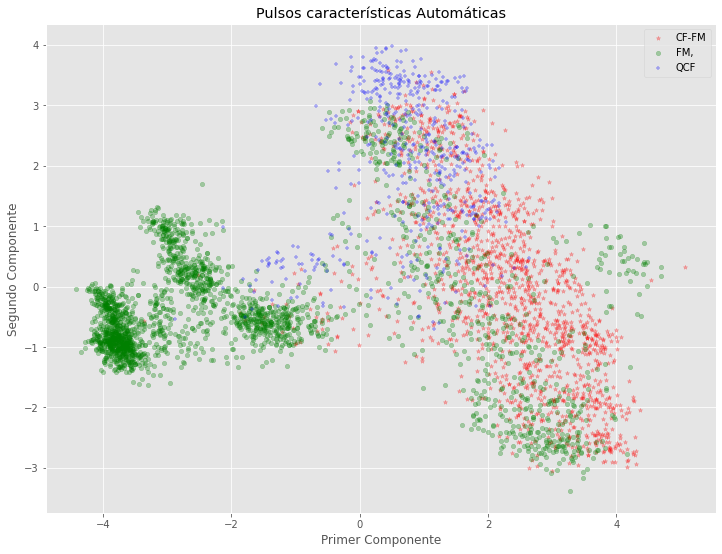

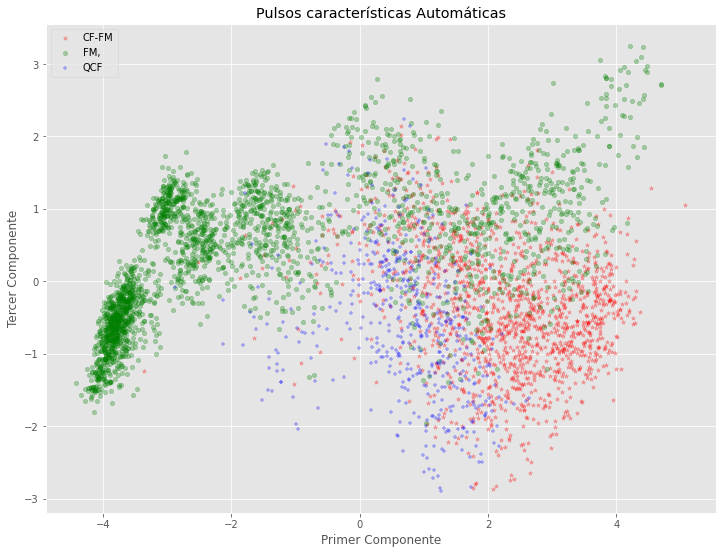

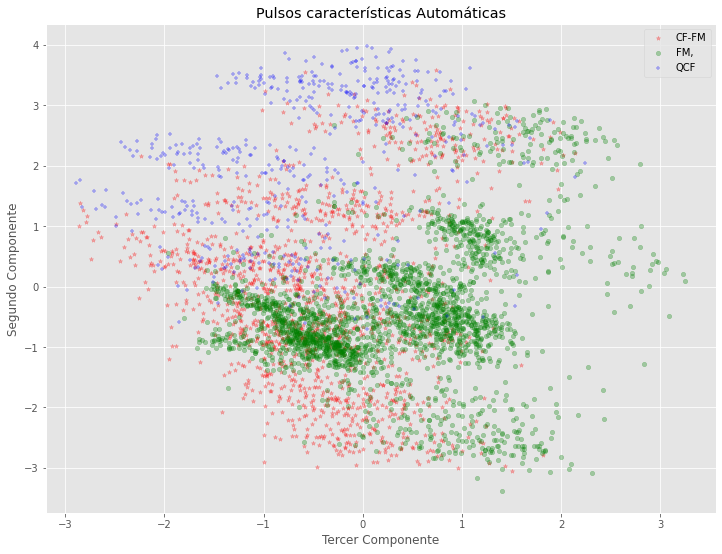

(3082, 3)
(3082, 3)
(1322, 3)


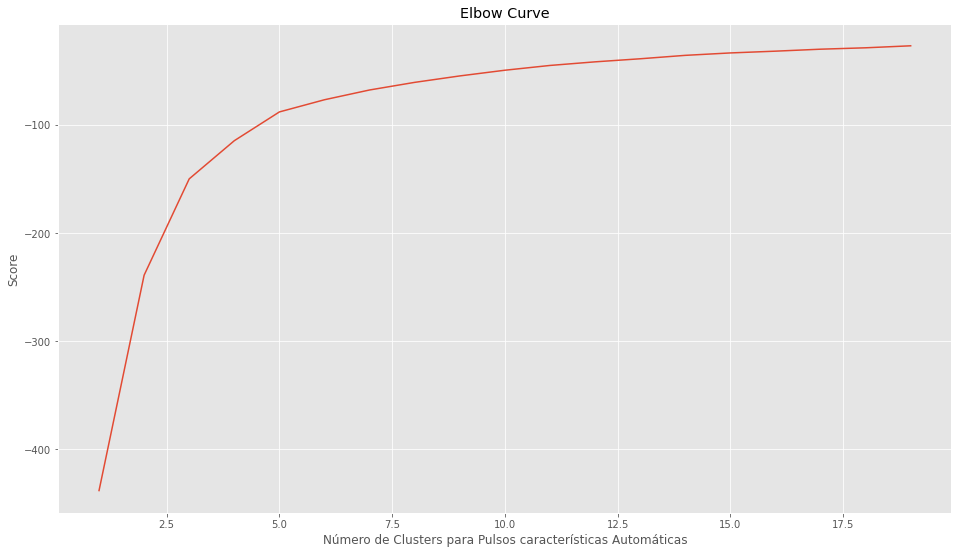

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_pulsos_auto_3
Pulsos características Automáticas
592
shape of X_pca (4404, 592)
Varianza explicada # componentes = 150 0.9263424642654323


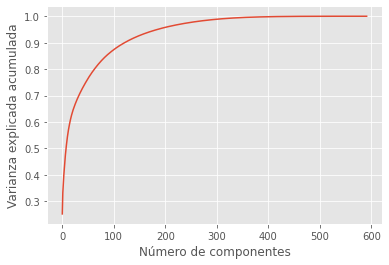

(3082, 150)
(3082, 150)
(1322, 150)


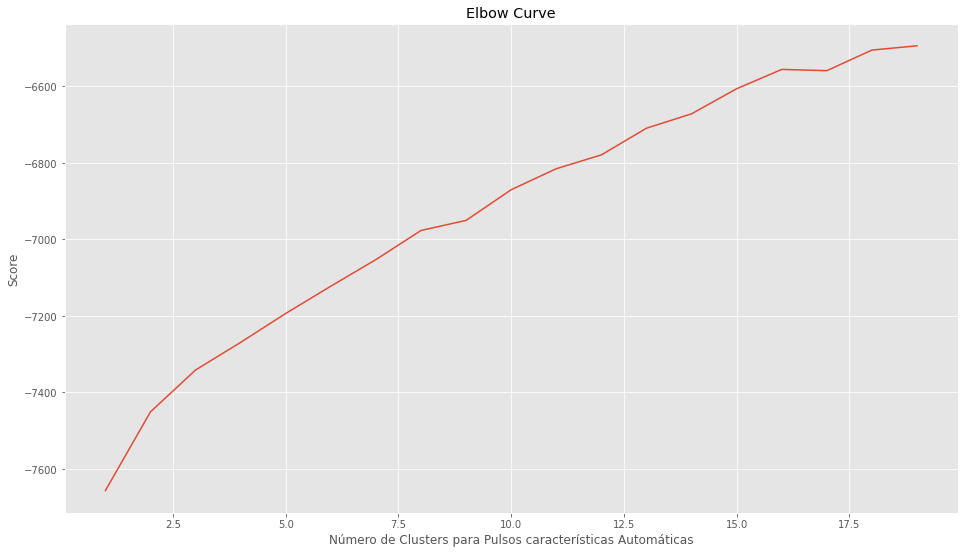

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_pulsos_auto
(3082, 592)
(3082, 592)
(1322, 592)


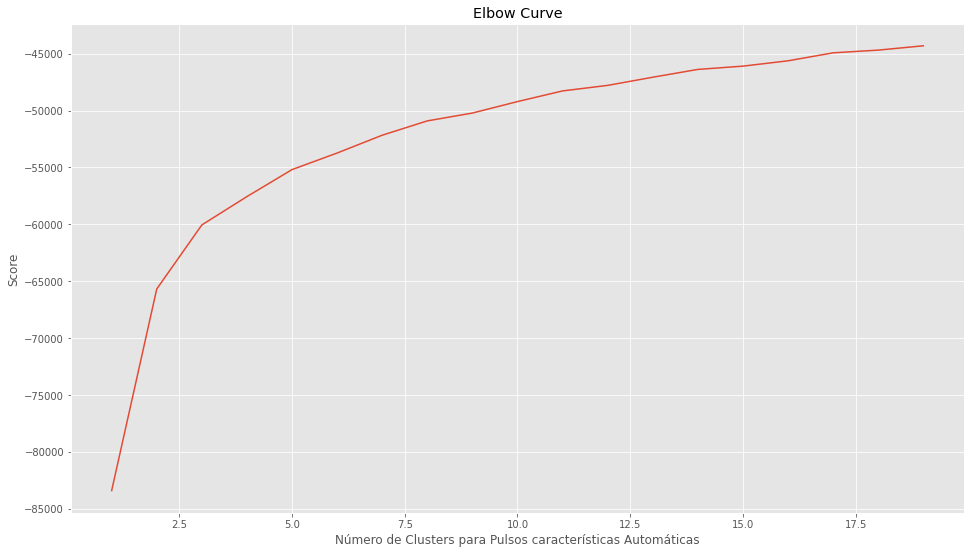

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pulsos_auto


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'CF-FM',2:'FM,',3:'QCF'}
labels=target1
titulo_='Pulsos características Automáticas'
columns=feature_names_aut
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_pulsos_auto_3'
sigla_experimento_='PCA_pa_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=150
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_pulsos_auto'
sigla_experimento_='PCA_pa_150'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='pulsos_auto'
sigla_experimento_='pa_592' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)

### PCA y Clusterización pulsos Solo Características manuales

Pulsos características manuales
8
shape of X_pca (4404, 8)
Varianza explicada # componentes = 3 0.9714876813791995


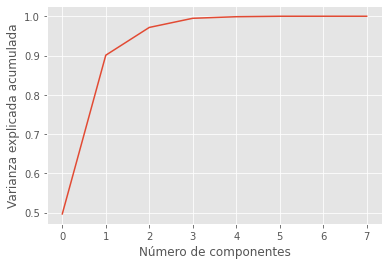

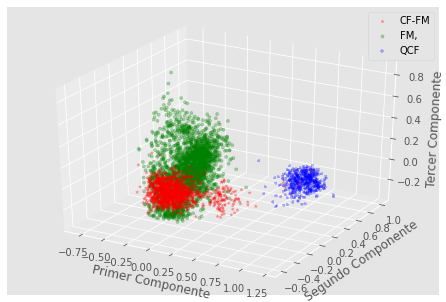

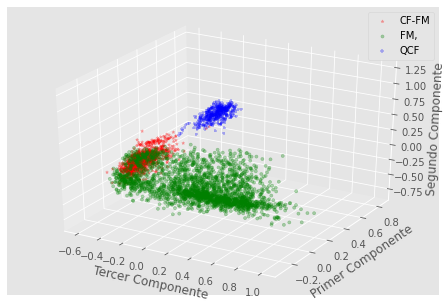

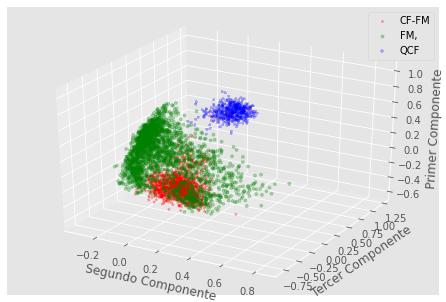

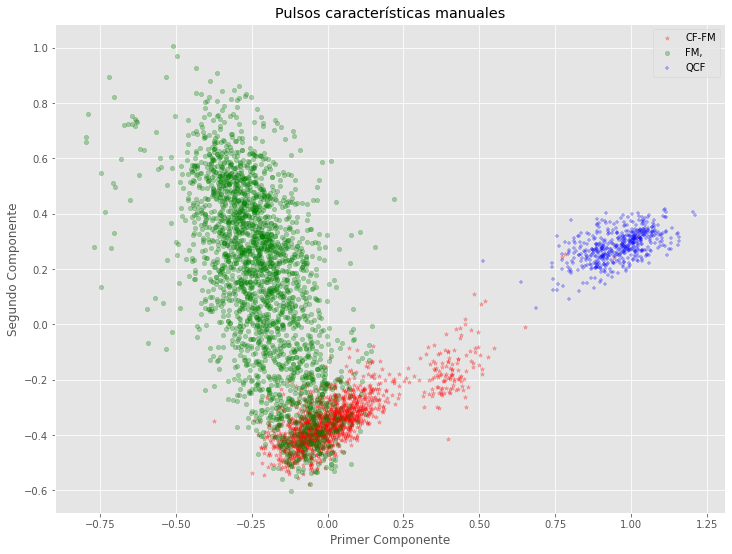

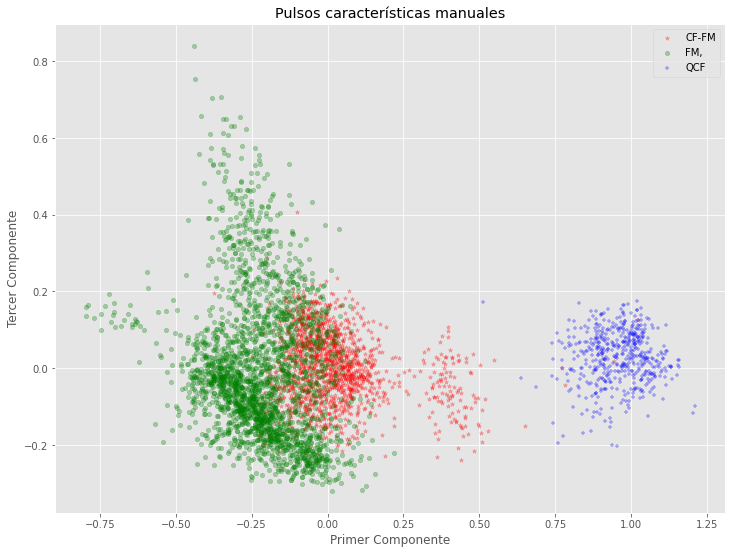

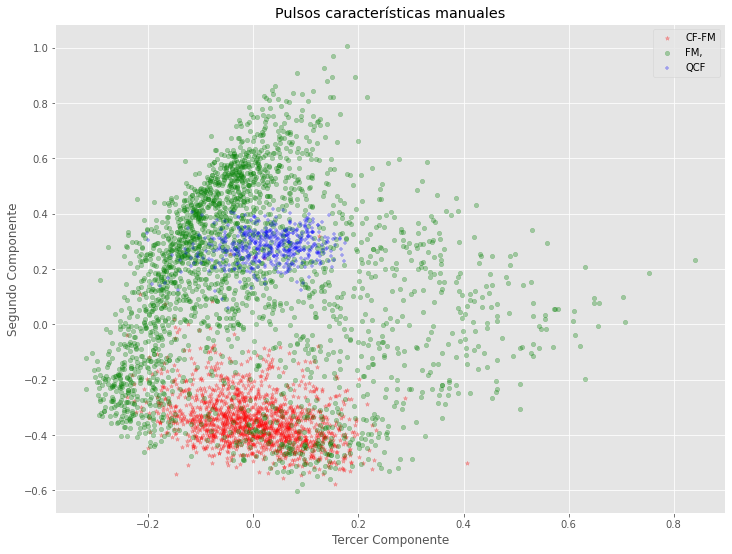

(3082, 3)
(3082, 3)
(1322, 3)


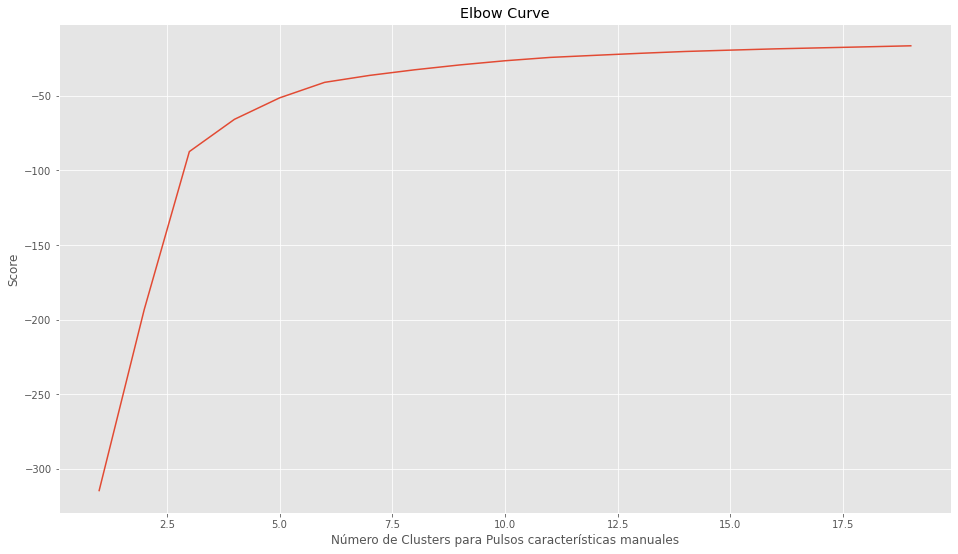

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_pulsos_manuales_3
Pulsos características manuales
8
shape of X_pca (4404, 8)
Varianza explicada # componentes = 8 0.9999999999999999


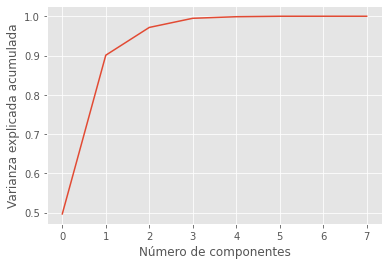

(3082, 8)
(3082, 8)
(1322, 8)


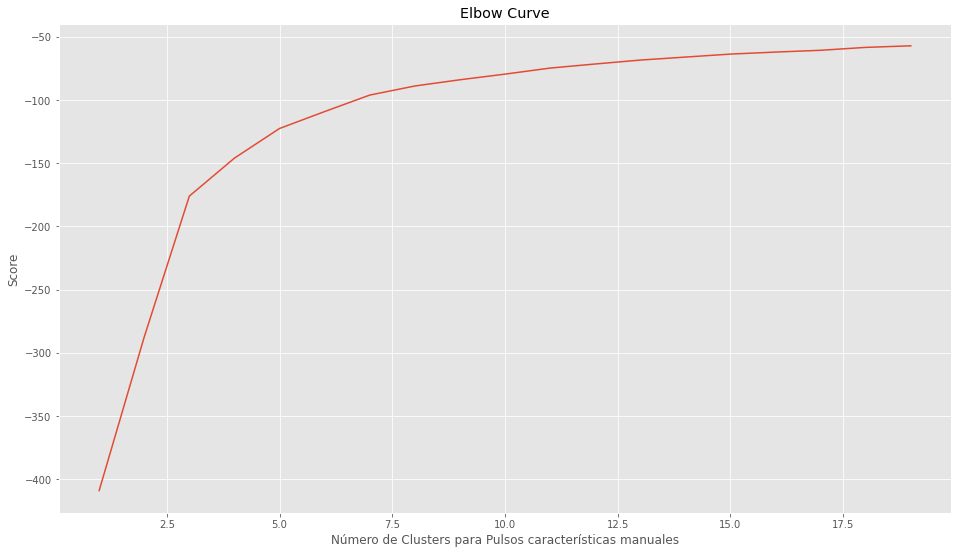

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_pulsos_manuales
(3082, 8)
(3082, 8)
(1322, 8)


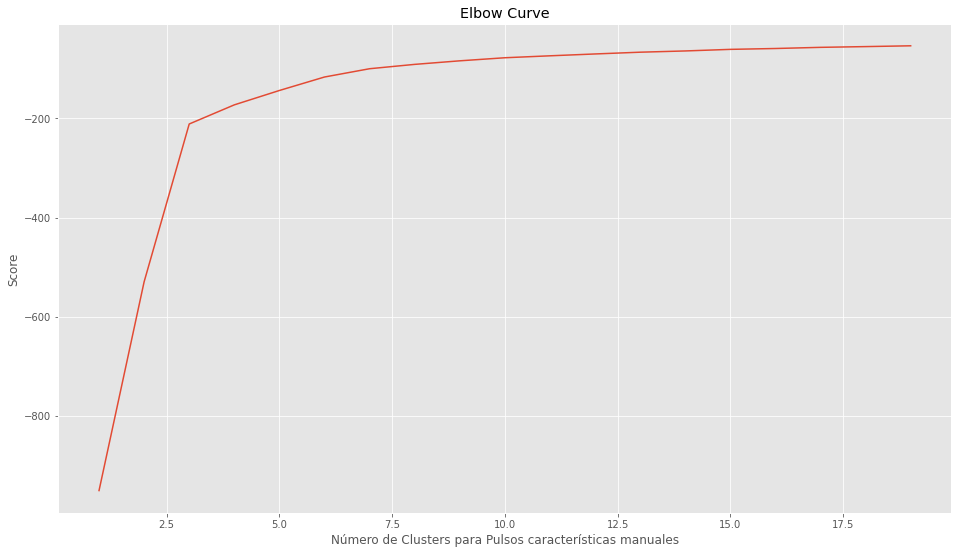

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pulsos_manuales


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'CF-FM',2:'FM,',3:'QCF'}
labels=target1
titulo_='Pulsos características manuales'
columns=['Frecuencia máxima (kHz)', 'Ancho de banda (kHz)', 'Frecuencia inicial (kHz)', 'Frecuencia final (kHz)', 'Frecuencia mínima (kHz)', 'Duración (ms)', 'Frecuencia pico (kHz)', 'Intervalo (ms)']
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_pulsos_manuales_3'
sigla_experimento_='PCA_pm_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=8
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_pulsos_manuales'
sigla_experimento_='PCA_pm_8'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='pulsos_manuales'
sigla_experimento_='pm_8' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)


### PCA y Clusterización fases Mejores Caracteristicas todos

Fases mejores características Todo el conjunto de datos
8
shape of X_pca (4404, 8)
Varianza explicada # componentes = 3 0.943309269436545


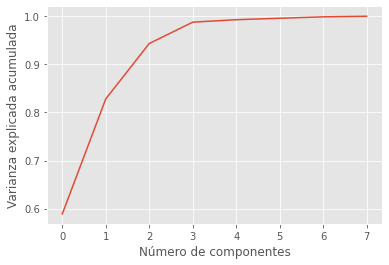

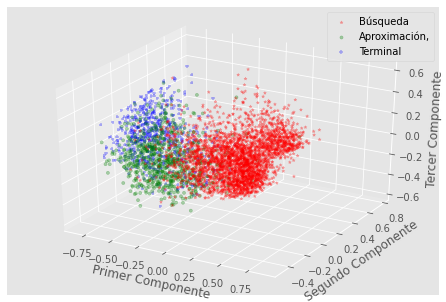

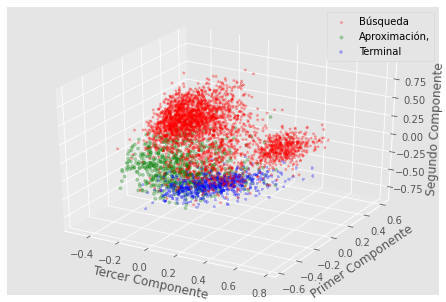

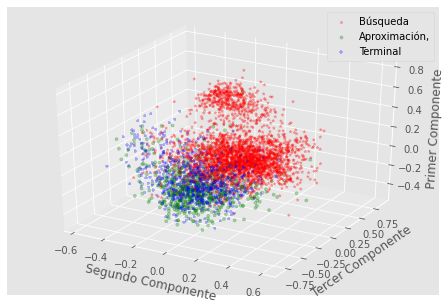

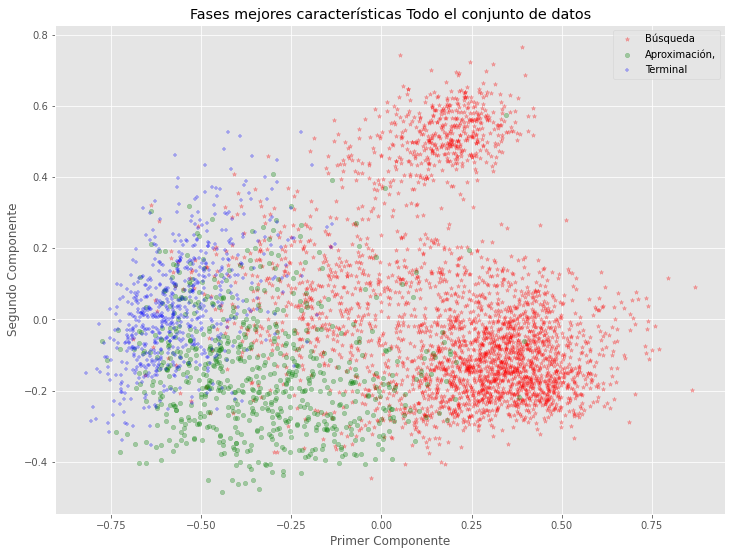

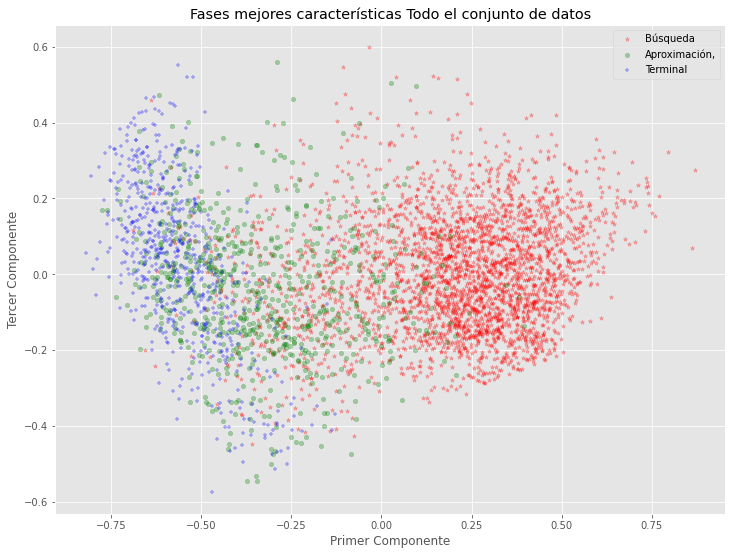

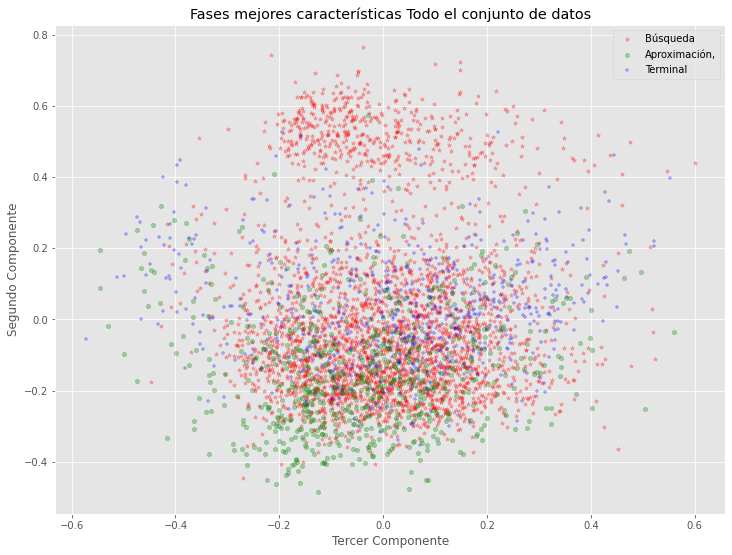

(3082, 3)
(3082, 3)
(1322, 3)


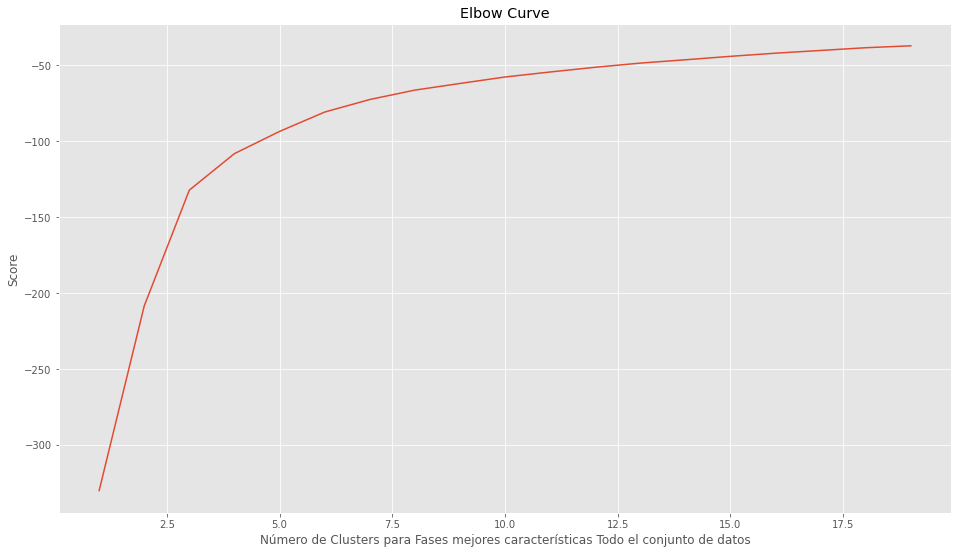

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_fases_todos_3
Fases mejores características Todo el conjunto de datos
8
shape of X_pca (4404, 8)
Varianza explicada # componentes = 8 1.0


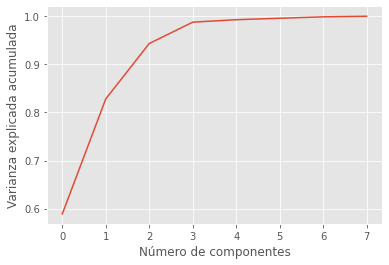

(3082, 8)
(3082, 8)
(1322, 8)


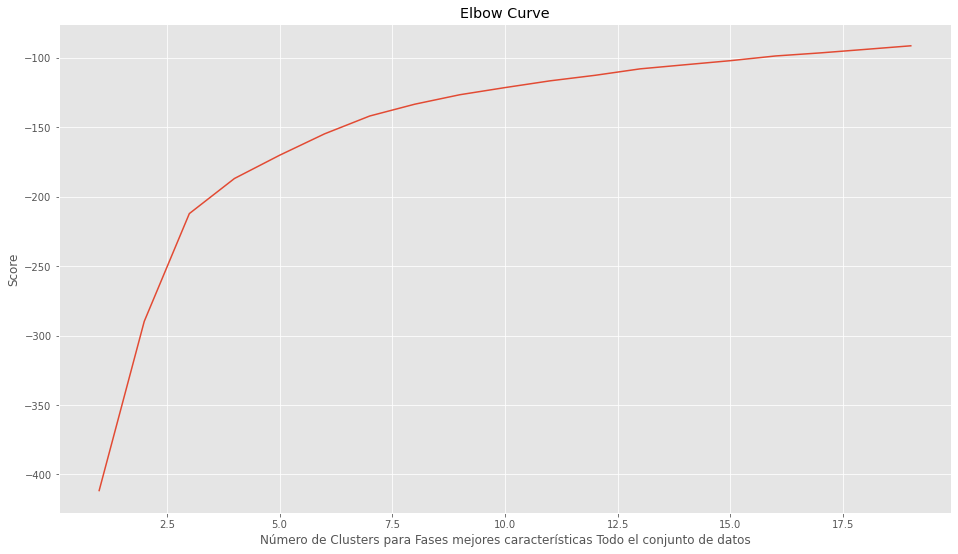

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_fases_todos
(3082, 8)
(3082, 8)
(1322, 8)


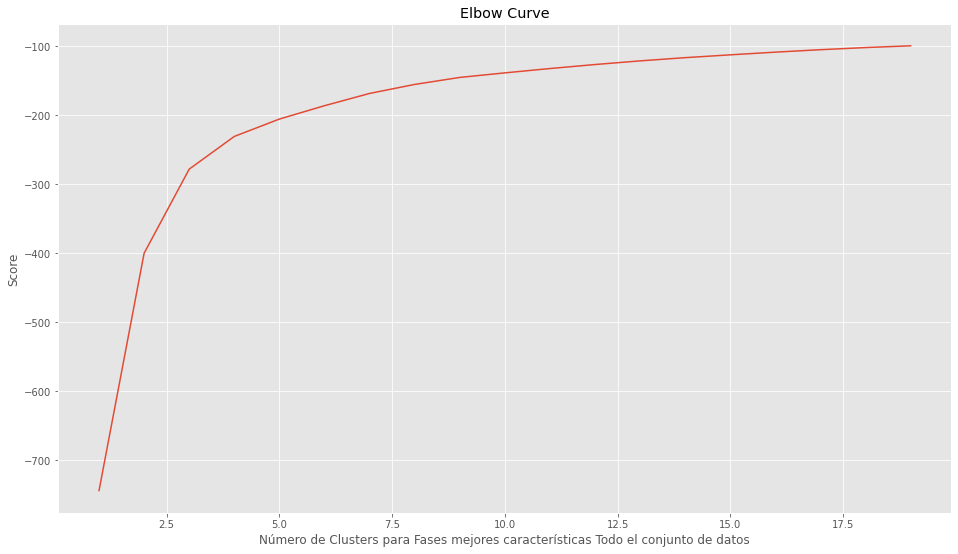

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento rf_fases_todos


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'Búsqueda',2:'Aproximación,',3:'Terminal'}
labels=target_fase1
titulo_='Fases mejores características Todo el conjunto de datos'
columns= ['Intervalo (ms)', 'Duración (ms)', 'delta_mfcc_median(y8)', 'Ancho de banda (kHz)', 'chroma_stft_avg(y4)', 'mels_median(y9)', 'delta_mfcc_avg(y8)', 'delta2_mfcc_order_by(avg(x1):avg(x21))desc(1)']
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_fases_todos_3'
sigla_experimento_='PCA_rf_ft_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=8
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_fases_todos'
sigla_experimento_='PCA_rf_ft_8'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='rf_fases_todos'
sigla_experimento_='rf_ft_8' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)


### PCA y Clustericación fases Mejores caracteristicas automáticas

Fases mejores características Automáticas
26
shape of X_pca (4404, 26)
Varianza explicada # componentes = 3 0.8256387303854329


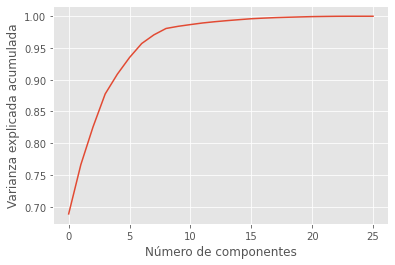

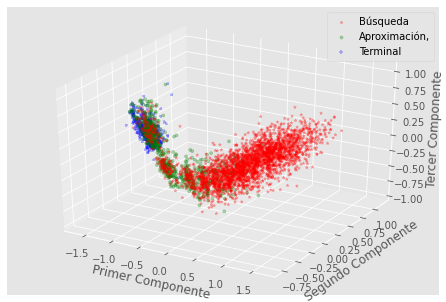

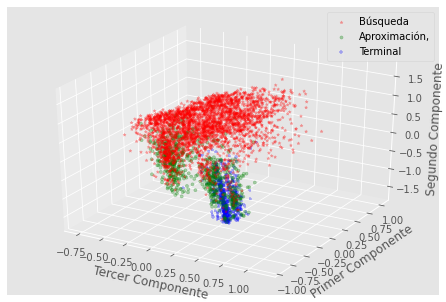

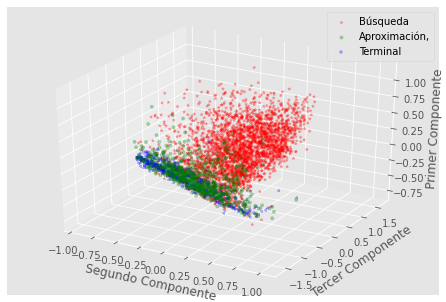

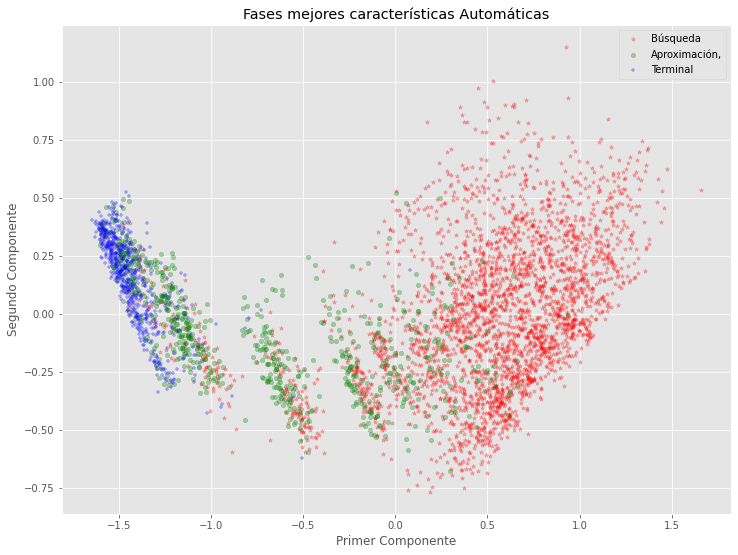

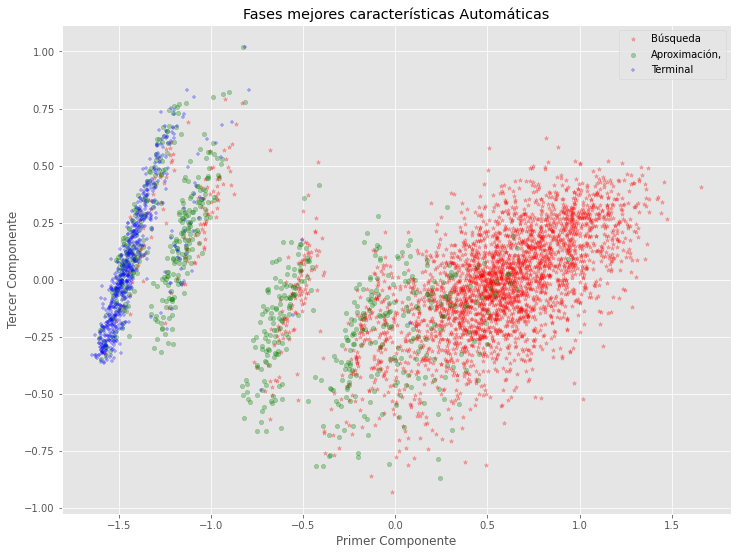

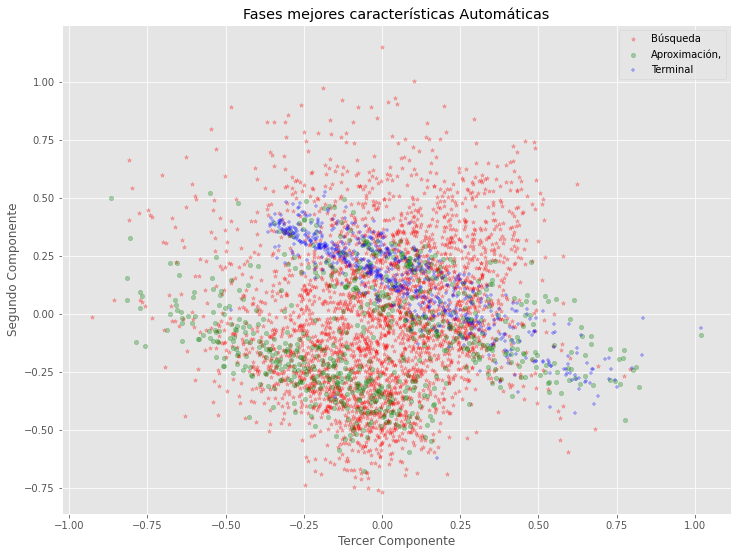

(3082, 3)
(3082, 3)
(1322, 3)


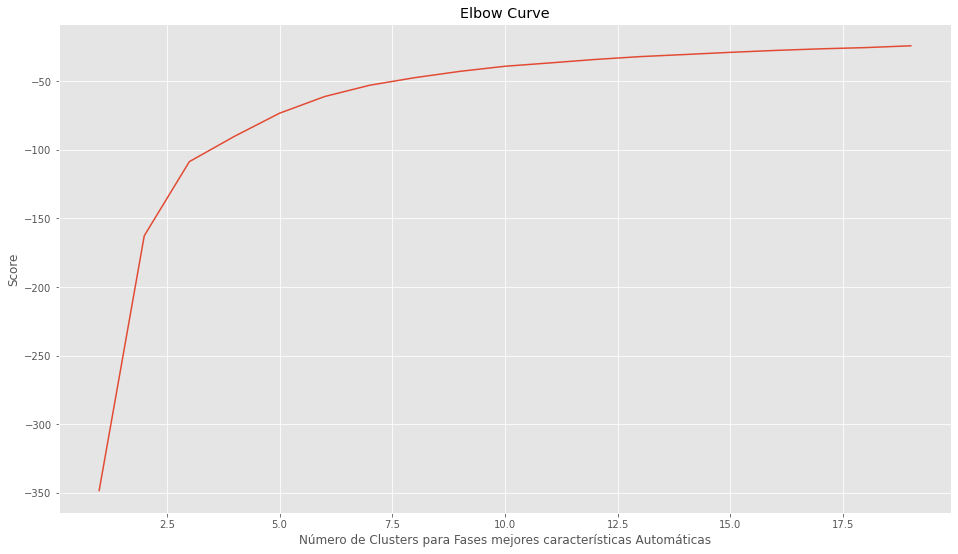

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_fases_auto_3
Fases mejores características Automáticas
26
shape of X_pca (4404, 26)
Varianza explicada # componentes = 26 1.0


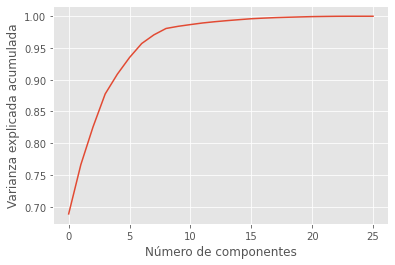

(3082, 26)
(3082, 26)
(1322, 26)


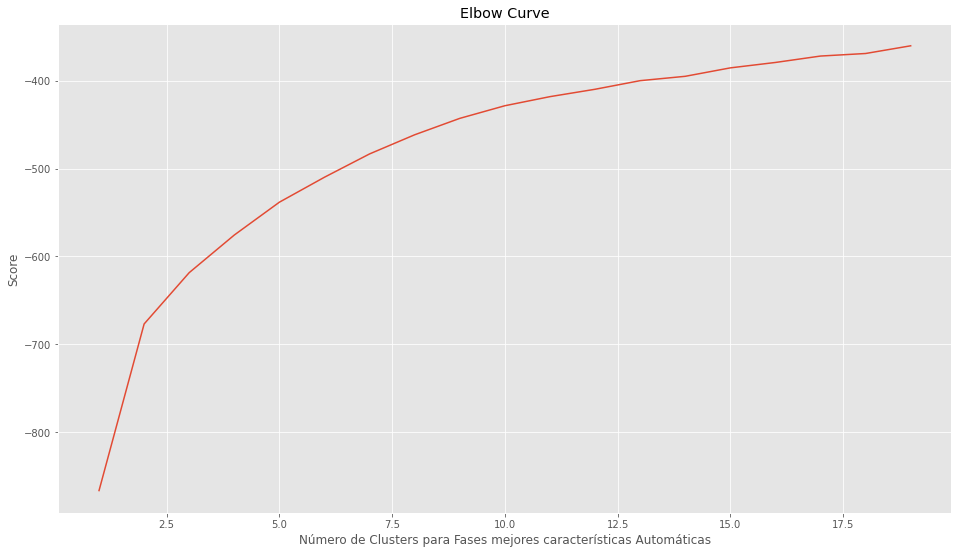

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_fases_auto
(3082, 26)
(3082, 26)
(1322, 26)


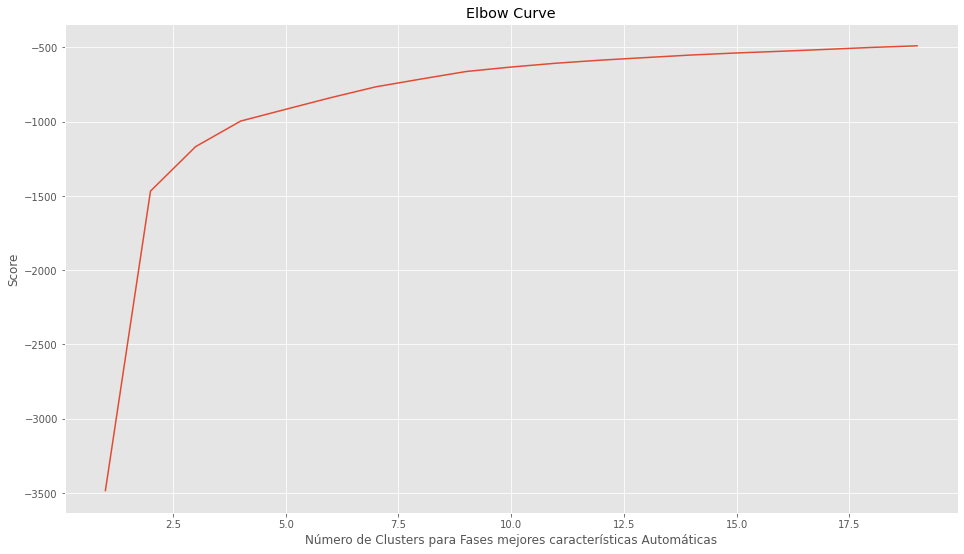

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2_KNN_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2_KNN_5


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento rf_fases_auto


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'Búsqueda',2:'Aproximación,',3:'Terminal'}
labels=target_fase1
titulo_='Fases mejores características Automáticas'
columns=['Duracion_(ms)', 'mels_max(x)for(y7)', 'delta_mfcc_avg(y8)', 'delta_mfcc_order_by(avg(x1):avg(x21))desc(1)', 'delta2_mfcc_order_by(avg(x1):avg(x21))desc(1)', 
         'mfcc_order_by(avg(x1):avg(x21))desc(2)', 'mels_max(y)for(x5)', 'mfcc_order_by(avg(x1):avg(x21))desc(1)', 'mfcc_order_by(avg(x1):avg(x21))desc(4)', 
         'delta_mfcc_median(y8)', 'mels_avg(y6)', 'mfcc_order_by(avg(x1):avg(x21))desc(3)', 'chroma_stft_avg(y4)', 'chroma_stft_median(y4)', 'mels_avg(y9)', 
         'mels_min(avg(y1):avg(y10))', 'mels_median(y9)', 'mfcc_max(x)for(y1)', 'mfcc_median(y1)', 'mfcc_order_by(avg(x1):avg(x21))desc(15)', 
         'mfcc_order_by(avg(x1):avg(x21))desc(16)', 'mfcc_max(y)for(x6)', 'delta_mfcc_max(x)for(y1)', 'delta2_mfcc_avg(y7)', 'delta2_mfcc_avg(y10)', 'delta2_mfcc_median(y10)']

df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_fases_auto_3'
sigla_experimento_='PCA_rf_fa_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=26
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_fases_auto'
sigla_experimento_='PCA_rf_fa_26'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='rf_fases_auto'
sigla_experimento_='rf_fa_26' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)


### PCA y Clusterización fases Mejores características manuales

Fases mejores características Manuales
8
shape of X_pca (4404, 8)
Varianza explicada # componentes = 3 0.9714876813791995


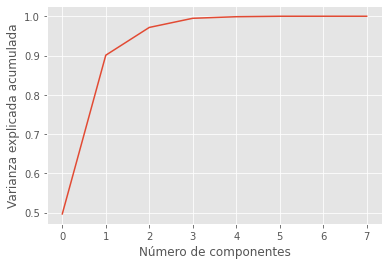

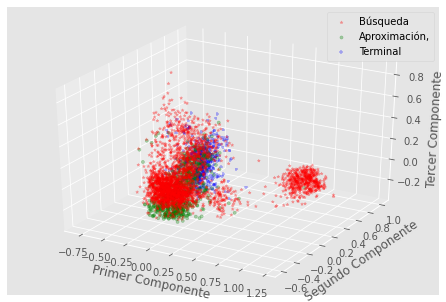

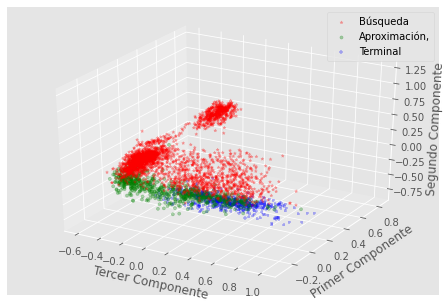

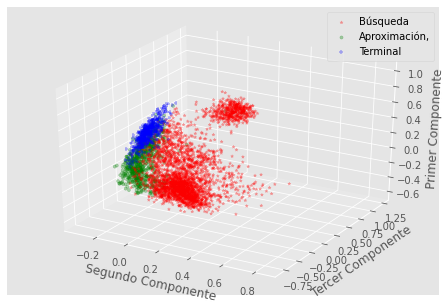

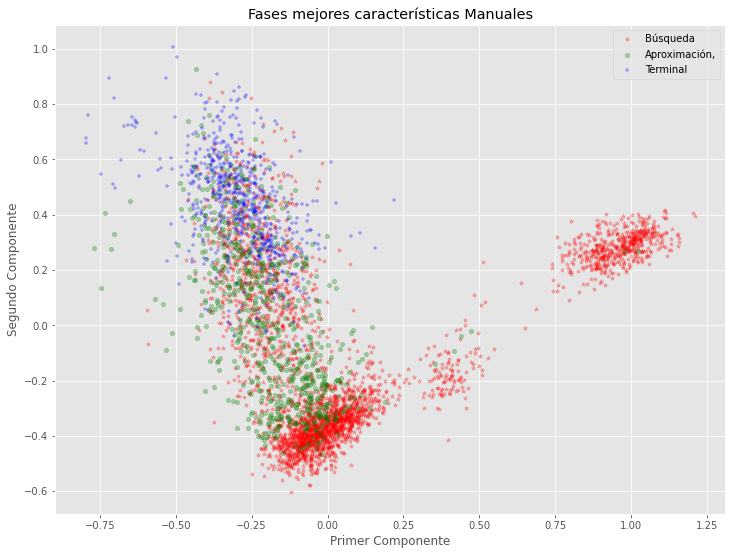

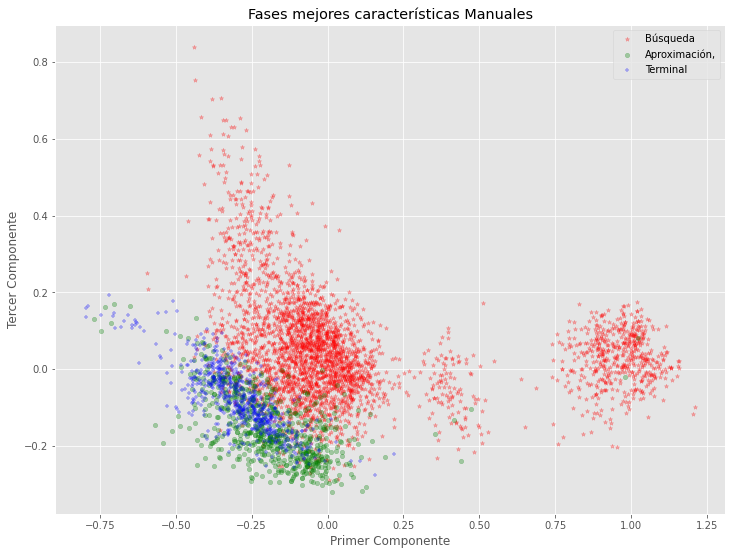

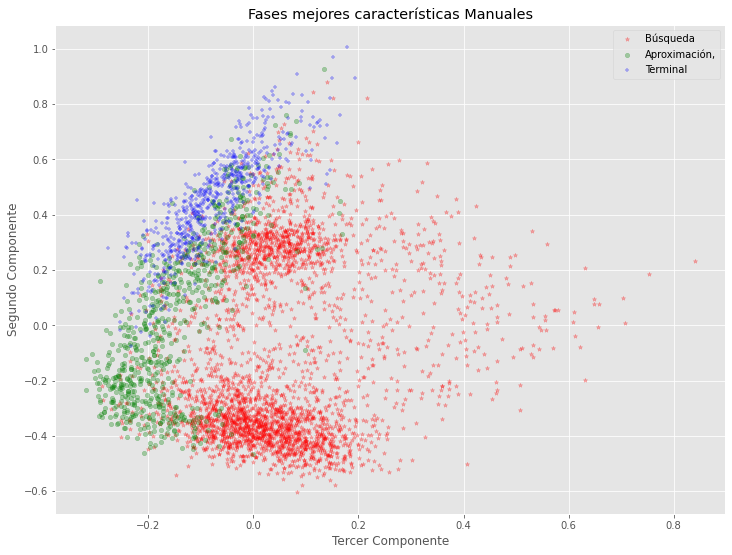

(3082, 3)
(3082, 3)
(1322, 3)


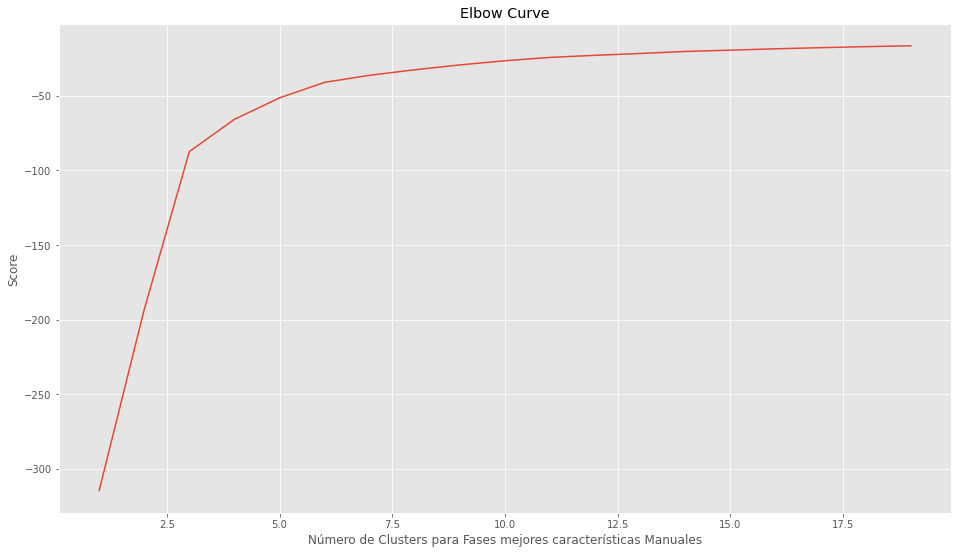

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_fases_manuales_3
Fases mejores características Manuales
8
shape of X_pca (4404, 8)
Varianza explicada # componentes = 8 1.0


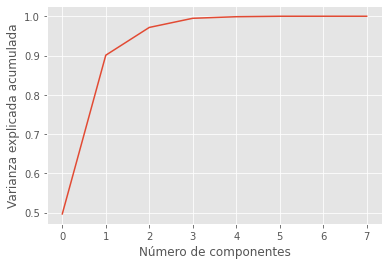

(3082, 8)
(3082, 8)
(1322, 8)


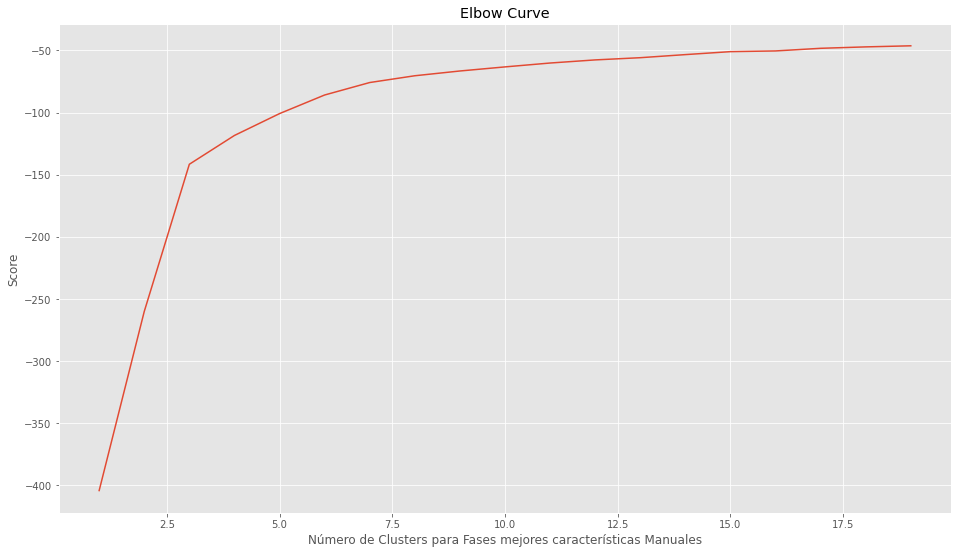

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_rf_fases_manuales
(3082, 8)
(3082, 8)
(1322, 8)


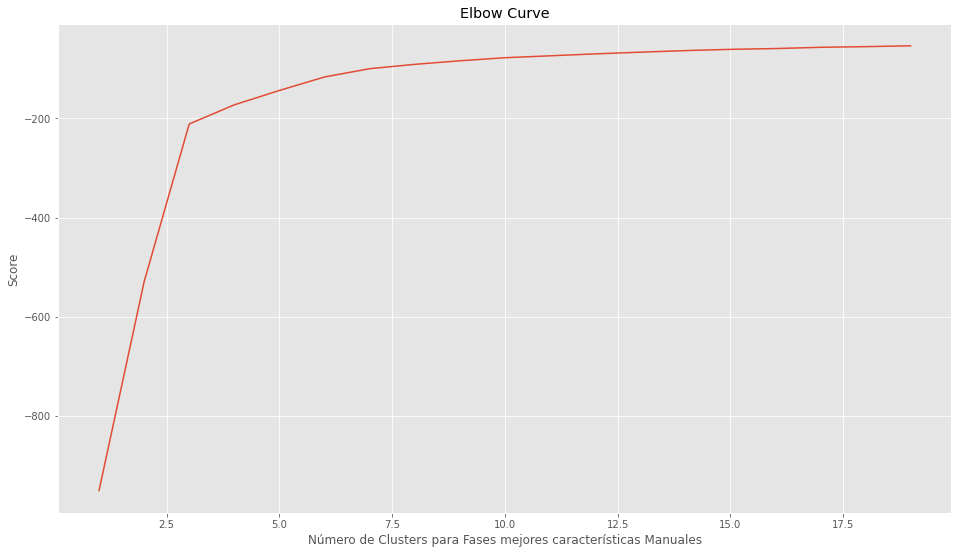

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento rf_fases_manuales


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'Búsqueda',2:'Aproximación,',3:'Terminal'}
labels=target_fase1
titulo_='Fases mejores características Manuales'
columns= ['Intervalo (ms)', 'Duración (ms)', 'Ancho de banda (kHz)', 'Frecuencia pico (kHz)', 'Frecuencia inicial (kHz)', 'Frecuencia final (kHz)', 'Frecuencia máxima (kHz)', 'Frecuencia mínima (kHz)']
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_fases_manuales_3'
sigla_experimento_='PCA_rf_fm_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=8
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_rf_fases_manuales'
sigla_experimento_='PCA_rf_fm_8'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='rf_fases_manuales'
sigla_experimento_='rf_fm_8' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)

### PCA y Clusterización fases Todos los datos

Fases características Todo el conjunto de datos
600
shape of X_pca (4404, 600)
Varianza explicada # componentes = 3 0.3701756395605018


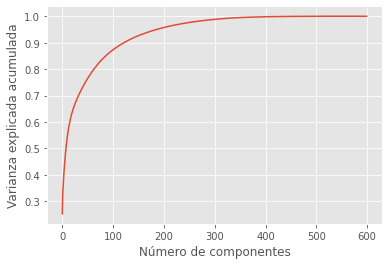

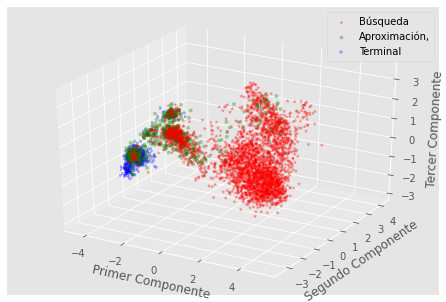

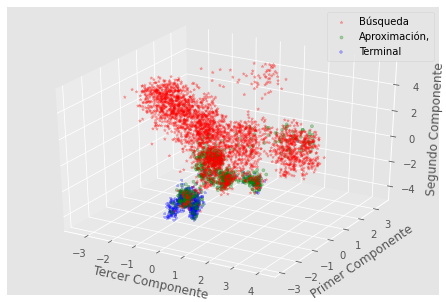

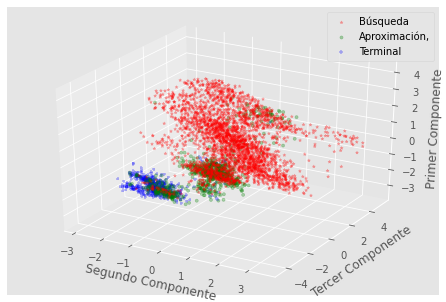

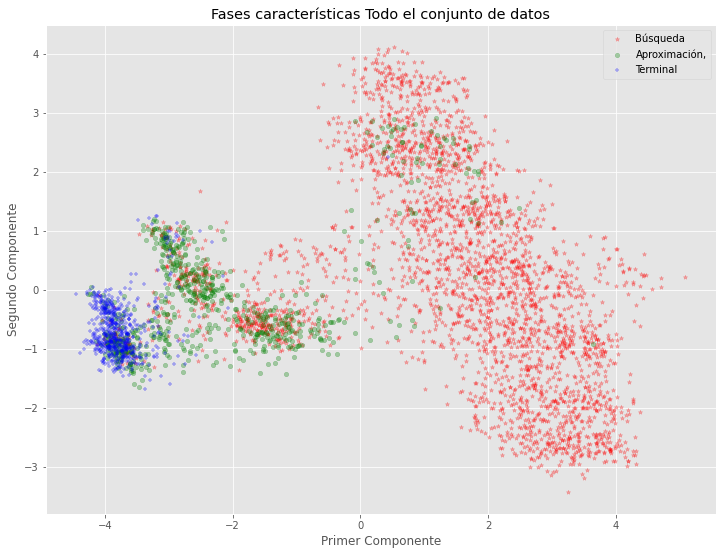

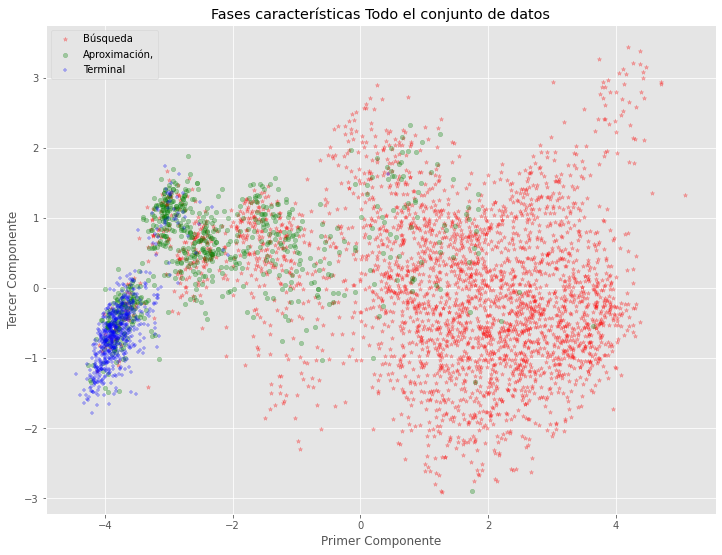

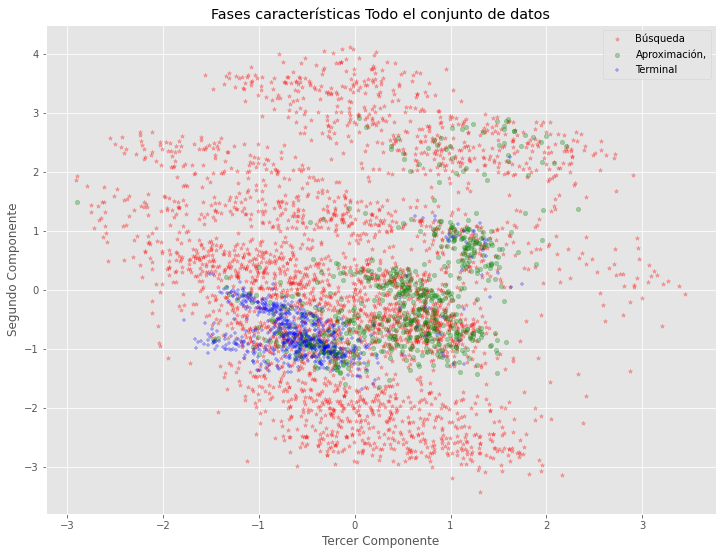

(3082, 3)
(3082, 3)
(1322, 3)


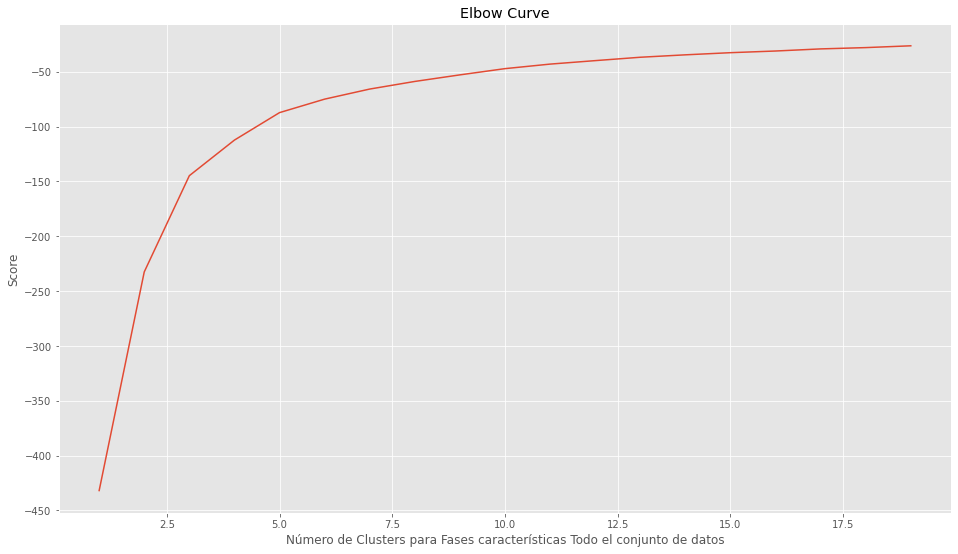

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_fases_todos_3
Fases características Todo el conjunto de datos
600
shape of X_pca (4404, 600)
Varianza explicada # componentes = 150 0.9258678816115319


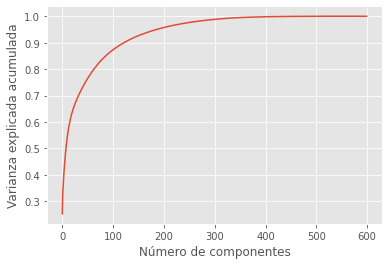

(3082, 150)
(3082, 150)
(1322, 150)


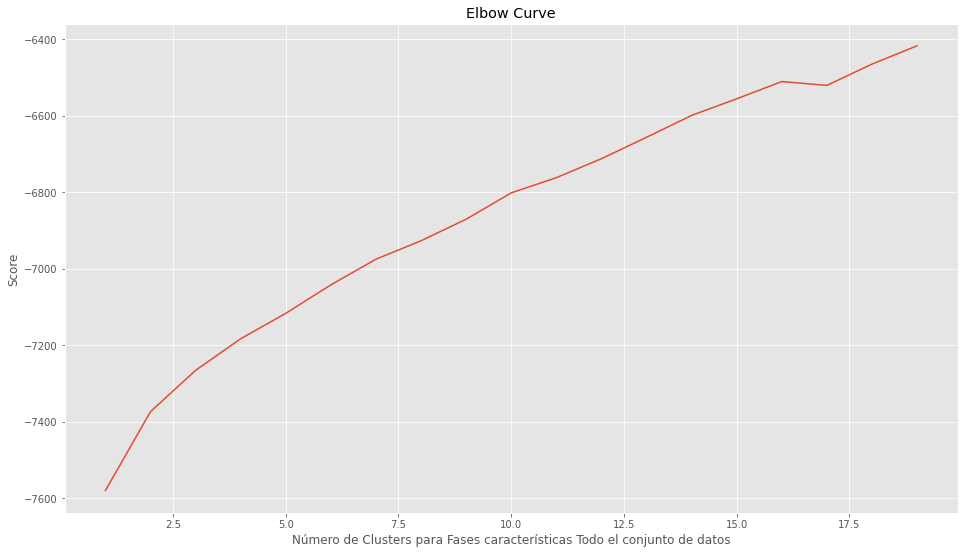

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_fases_todos
(3082, 600)
(3082, 600)
(1322, 600)


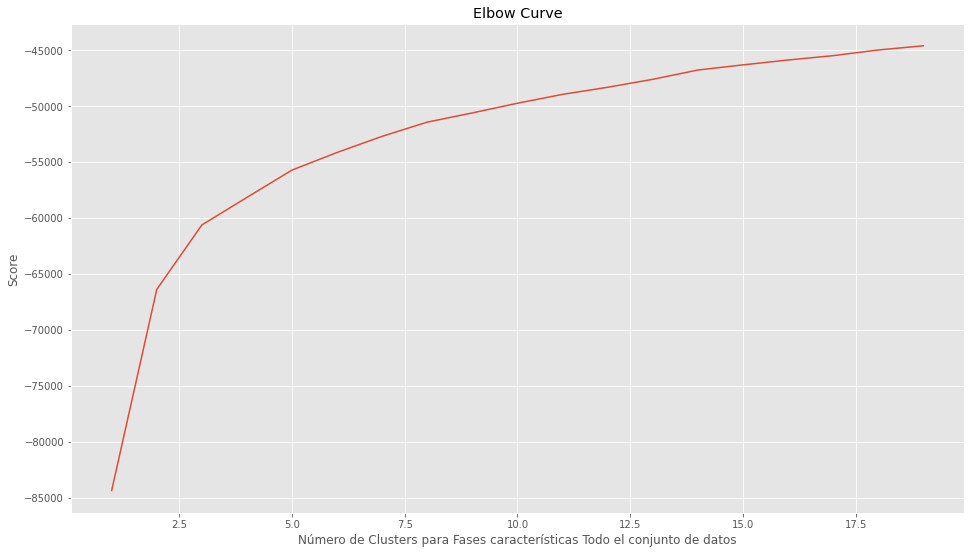

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento fases_todos


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'Búsqueda',2:'Aproximación,',3:'Terminal'}
labels=target_fase1
titulo_='Fases características Todo el conjunto de datos'
columns=feature_names
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_fases_todos_3'
sigla_experimento_='PCA_ft_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=150
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_fases_todos'
sigla_experimento_='PCA_ft_150'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='fases_todos'
sigla_experimento_='ft_600' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)


### PCA y Clustarización fases solo las caracteristicas automáticas

Fases características Automáticas
592
shape of X_pca (4404, 592)
Varianza explicada # componentes = 3 0.3685666144557091


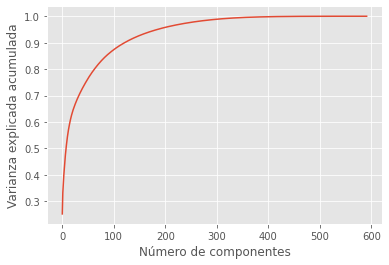

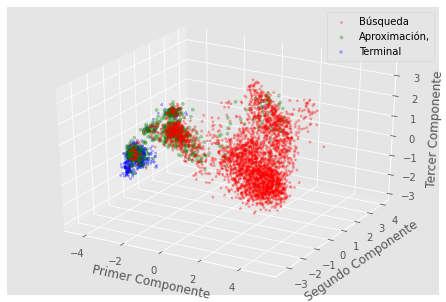

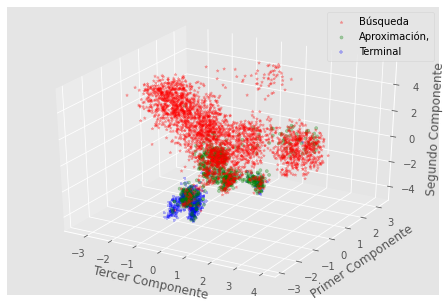

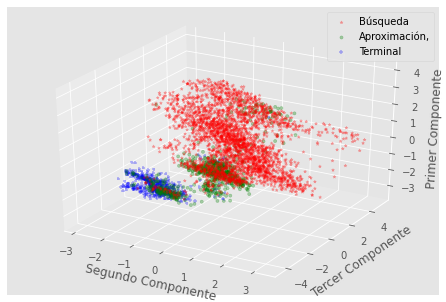

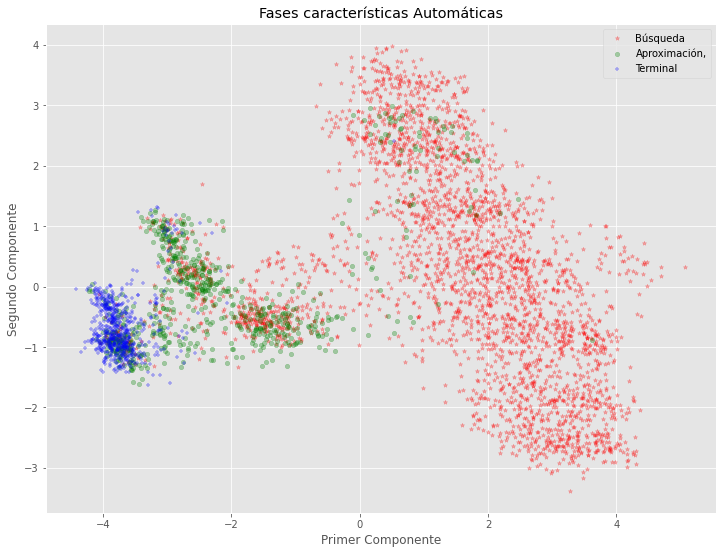

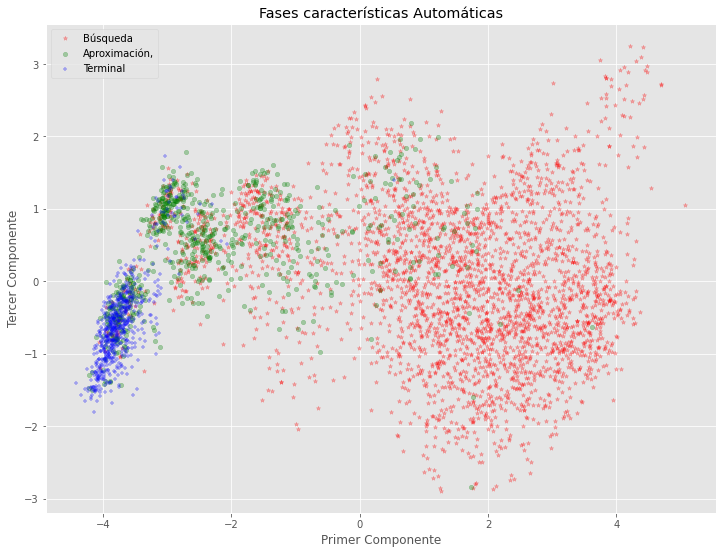

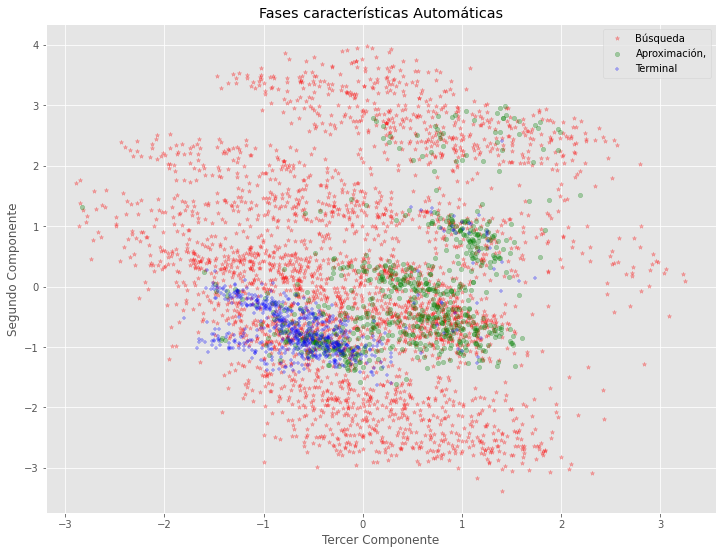

(3082, 3)
(3082, 3)
(1322, 3)


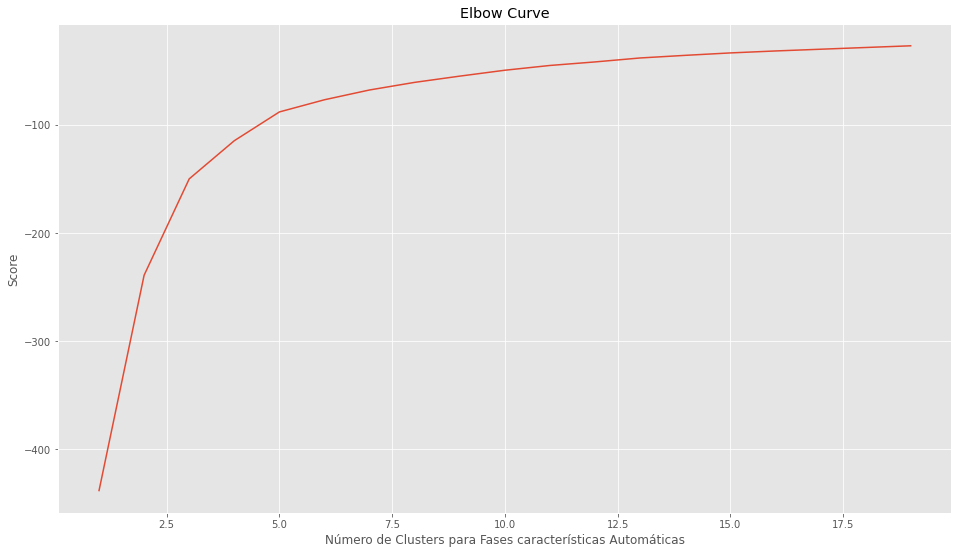

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_fases_auto_3
Fases características Automáticas
592
shape of X_pca (4404, 592)
Varianza explicada # componentes = 150 0.9263424642654323


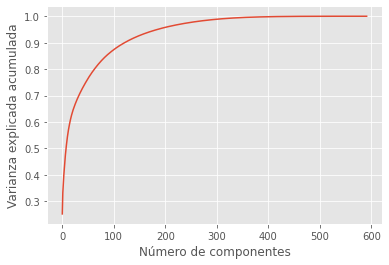

(3082, 150)
(3082, 150)
(1322, 150)


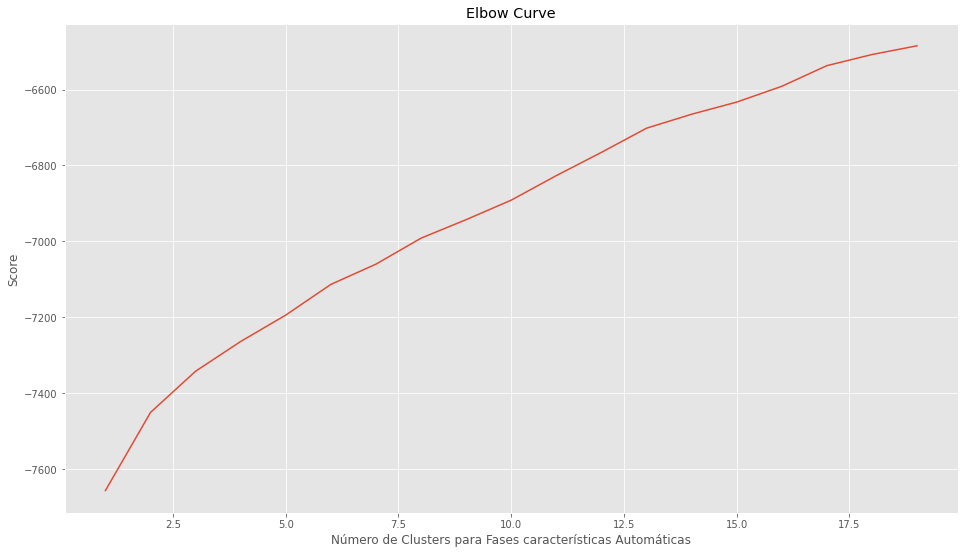

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_fases_auto
(3082, 592)
(3082, 592)
(1322, 592)


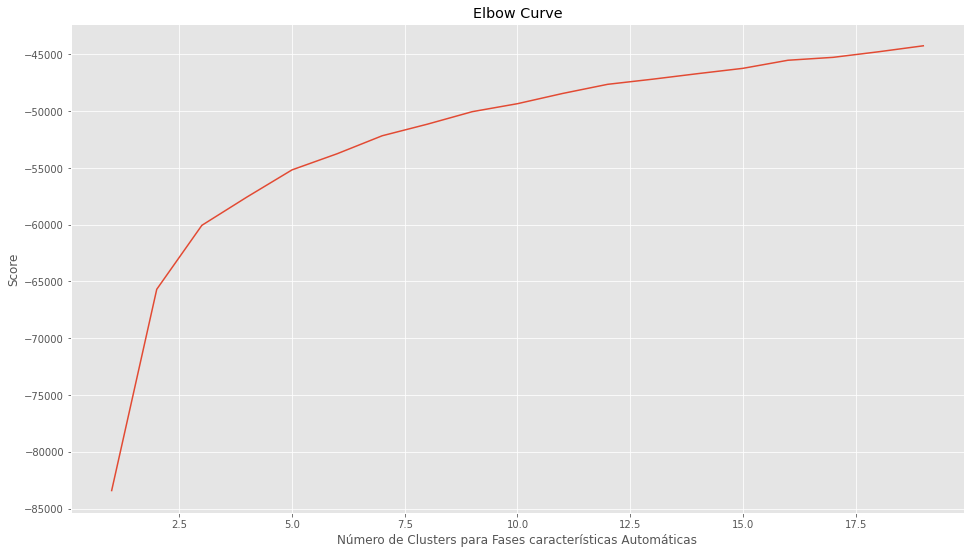

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento fases_auto


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'Búsqueda',2:'Aproximación,',3:'Terminal'}
labels=target_fase1
titulo_='Fases características Automáticas'

columns=feature_names_aut
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_fases_auto_3'
sigla_experimento_='PCA_fa_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=150
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_fases_auto'
sigla_experimento_='PCA_fa_150'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='fases_auto'
sigla_experimento_='fa_592' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)

### PCA y Clusterización fases Solo características manuales

Fases características Manuales
8
shape of X_pca (4404, 8)
Varianza explicada # componentes = 3 0.9714876813791995


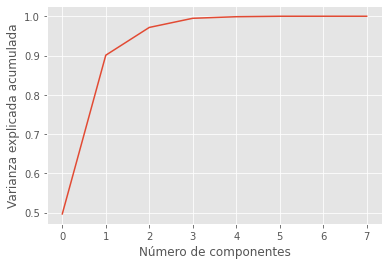

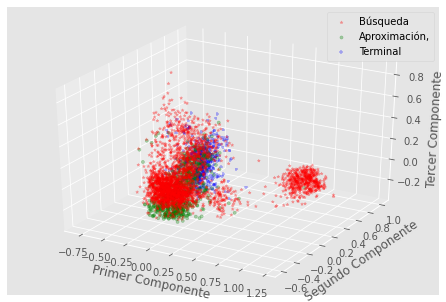

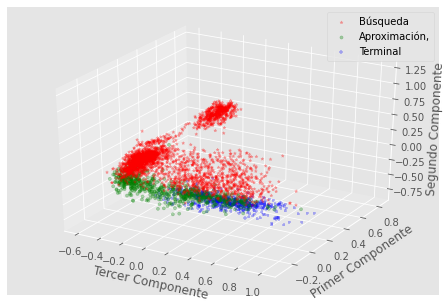

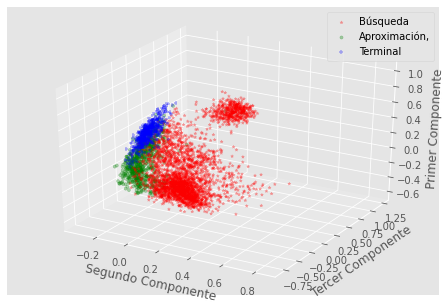

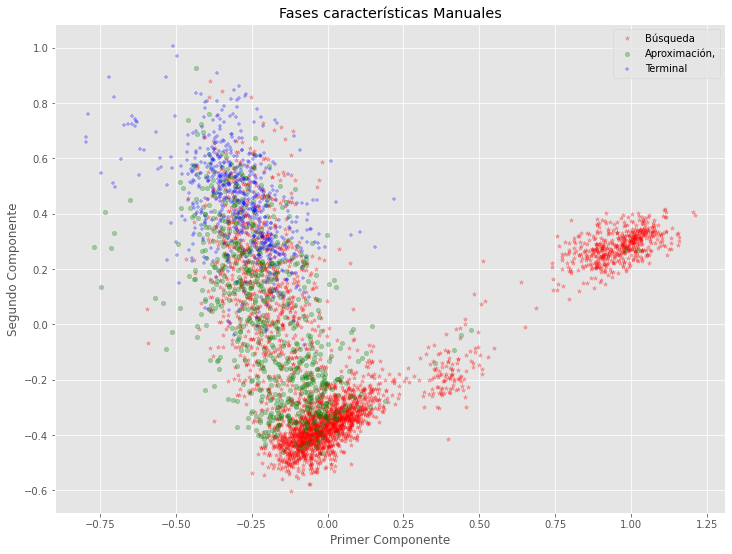

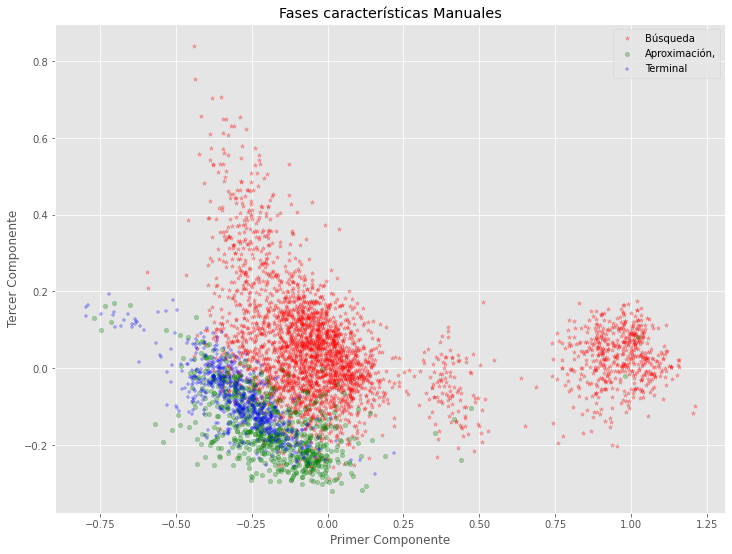

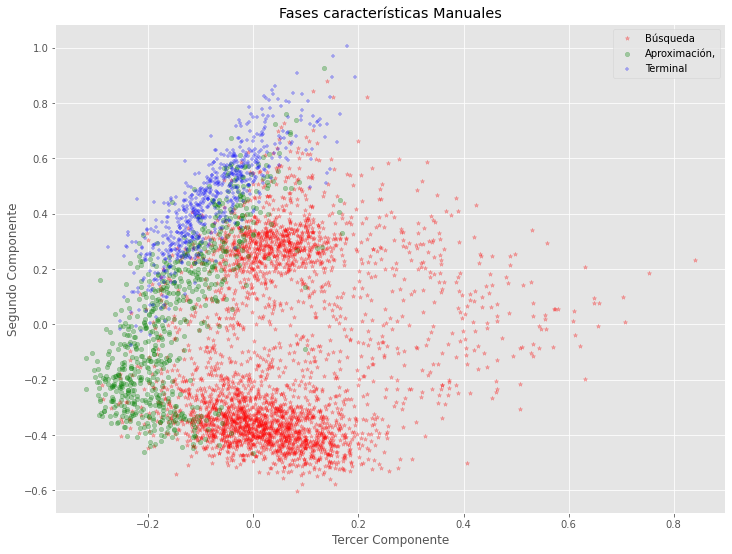

(3082, 3)
(3082, 3)
(1322, 3)


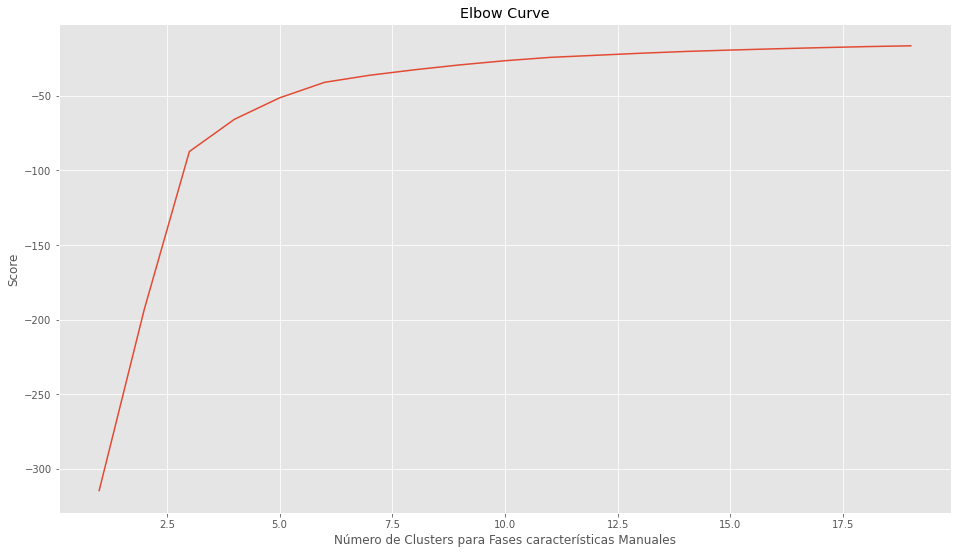

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_fases_manuales_3
Fases características Manuales
8
shape of X_pca (4404, 8)
Varianza explicada # componentes = 8 1.0


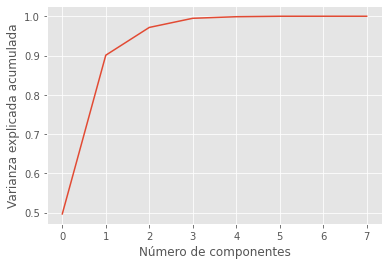

(3082, 8)
(3082, 8)
(1322, 8)


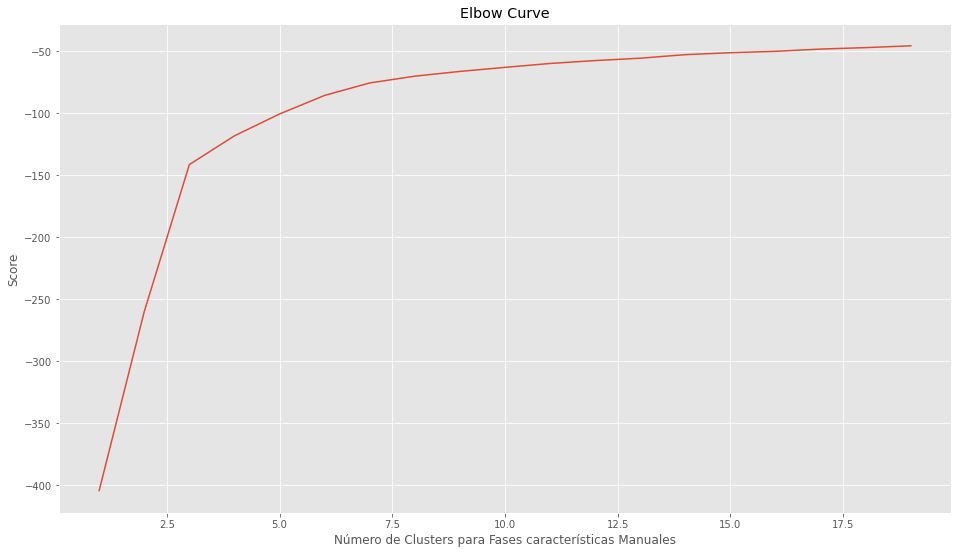

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2
SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10
SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10
SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10
SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10
SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10
SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10
SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10
SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10
SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento pca_fases_manuales
(3082, 8)
(3082, 8)
(1322, 8)


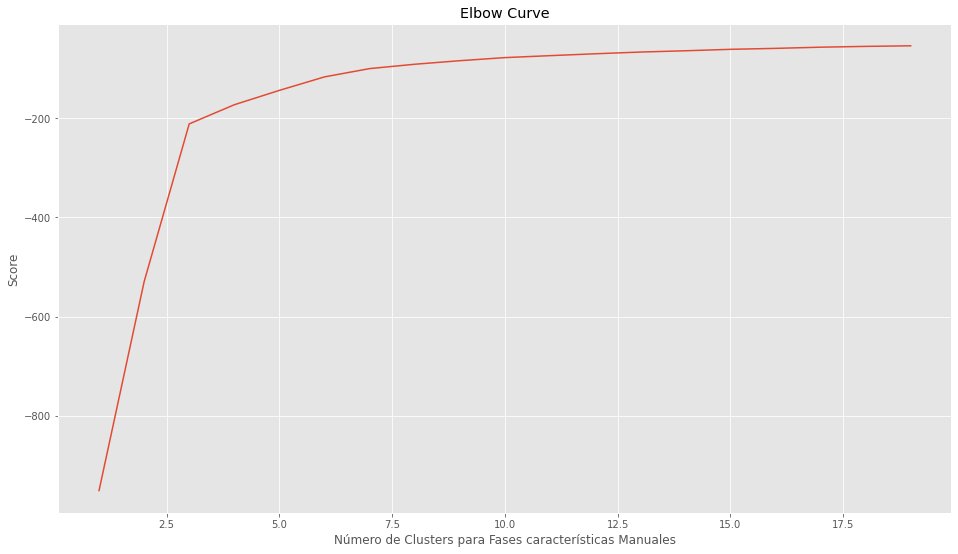

k_means_20
k_means_10
k_means_9
k_means_8
k_means_7
k_means_6
k_means_5
k_means_4
k_means_3
k_means_2


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_20
SpectralClustering_20_KNN_2
SpectralClustering_20_KNN_5
SpectralClustering_20_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_10
SpectralClustering_10_KNN_2
SpectralClustering_10_KNN_5
SpectralClustering_10_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_9
SpectralClustering_9_KNN_2
SpectralClustering_9_KNN_5
SpectralClustering_9_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_8
SpectralClustering_8_KNN_2
SpectralClustering_8_KNN_5
SpectralClustering_8_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_7
SpectralClustering_7_KNN_2
SpectralClustering_7_KNN_5
SpectralClustering_7_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_6
SpectralClustering_6_KNN_2
SpectralClustering_6_KNN_5
SpectralClustering_6_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_5
SpectralClustering_5_KNN_2
SpectralClustering_5_KNN_5
SpectralClustering_5_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_4
SpectralClustering_4_KNN_2
SpectralClustering_4_KNN_5
SpectralClustering_4_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_3
SpectralClustering_3_KNN_2
SpectralClustering_3_KNN_5
SpectralClustering_3_KNN_10


/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


SpectralClustering_2
SpectralClustering_2_KNN_2
SpectralClustering_2_KNN_5
SpectralClustering_2_KNN_10


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:152: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).


###########################################################
Finaliza el proceso de clusterización para el experimento fases_manuales


In [ ]:
from sklearn.model_selection import train_test_split
labl={1:'Búsqueda',2:'Aproximación,',3:'Terminal'}
labels=target_fase1
titulo_='Fases características Manuales'
columns= ['Intervalo (ms)','Duración (ms)','Ancho de banda (kHz)','Frecuencia pico (kHz)','Frecuencia inicial (kHz)','Frecuencia final (kHz)','Frecuencia máxima (kHz)','Frecuencia mínima (kHz)']
df = scaled_data_tipo_pulso1[columns]
feature_names_=columns

######PCA#######################
cant_componentes_=3
graficas_=1 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_fases_manuales_3'
sigla_experimento_='PCA_fm_3'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

cant_componentes_=8
graficas_=0 #Variable usada para definir si se quere gráficar PCA
experimento_='pca_fases_manuales'
sigla_experimento_='PCA_fm_8'
implementar_pca(df,labels,labl,cant_componentes_,titulo_,experimento_,sigla_experimento_,feature_names_,graficas_)

######Clusterización#######################
experimento_='fases_manuales'
sigla_experimento_='fm_8' # + cantidad de características
feature_names_=columns
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)
X_train, X_test, y_train, y_test = train_test_split(
                                                    scaled_data, 
                                                    labels, 
                                                    test_size=0.3, random_state=0)
print(X_train.shape)

implementacion_cluster(X_train,X_test,y_train,y_test,feature_names_,experimento_,sigla_experimento_,titulo_)
